## Importing Libraries

In [2]:
import numpy as np
import pandas as pd
import sys

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import time

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.semi_supervised import LabelPropagation

# import tensorflow 
# from tensorflow import keras
import keras
from keras import backend as K
from keras.layers import Conv2D, Conv2DTranspose, Input, Flatten, Dense, Lambda, Reshape
from keras.models import Model

import xgboost as xgb

import six
from six import StringIO  

import random 

from IPython.display import Image  
import pydotplus
import re

import warnings
warnings.filterwarnings('ignore')


Bad key "text.kerning_factor" on line 4 in
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


## Reading the Data

In [3]:
fingerprints_df_from_file = pd.read_csv('../Dataset/Original_Dataset/Whole_Dataset/fingerprint.csv')
fingerprints_df = fingerprints_df_from_file.iloc[: , 2:]
#training_cols = [col for col in fingerprints_df.columns if col not in ['channel1', 'channel2','channel3','channel4','channel5','channel6','channel7','channel8','channel9','channel10','channel11','channel12','channel13', 'channel14', 'channel15', 'channel16', 'channel17', 'channel18', 'channel19', 'channel20','location']]
training_cols = [col for col in fingerprints_df.columns if col not in ['location']]
# X = fingerprints_df.loc[:, training_cols]
# target = fingerprints_df.loc[:, 'location']
fingerprints_df


,beacon1,channel1,beacon2,channel2,beacon3,channel3,beacon4,channel4,beacon5,channel5,...,channel16,beacon17,channel17,beacon18,channel18,beacon19,channel19,beacon20,channel20,location
0,-100,37,-81,37,-300,0,-300,0,-300,0,...,0,-300,0,-300,0,-300,0,-300,0,b1
1,-97,37,-87,38,-300,0,-300,0,-300,0,...,0,-300,0,-300,0,-300,0,-300,0,b1
2,-91,37,-84,38,-300,0,-300,0,-300,0,...,0,-300,0,-300,0,-300,0,-300,0,b1
3,-92,38,-85,38,-95,38,-300,0,-300,0,...,0,-300,0,-300,0,-300,0,-300,0,b1
4,-94,37,-80,37,-300,0,-300,0,-300,0,...,0,-300,0,-300,0,-300,0,-300,0,b1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1194,-300,0,-300,0,-300,0,-300,0,-300,0,...,37,-92,38,-83,38,-88,37,-300,0,sa15
1195,-300,0,-300,0,-300,0,-300,0,-300,0,...,37,-85,38,-82,39,-91,38,-300,0,sa15
1196,-300,0,-300,0,-300,0,-300,0,-300,0,...,37,-91,37,-98,37,-92,37,-300,0,sa15
1197,-300,0,-300,0,-300,0,-300,0,-300,0,...,37,-85,38,-78,38,-89,37,-300,0,sa15


In [4]:
fingerprints_df.loc[:, [col for col in fingerprints_df.columns if col in ["channel1_0","channel1_37","channel1_38","channel1_39" ]]]
                    
                    

""
0
1
2
3
4
...
1194
1195
1196
1197


In [5]:
fingerprints_df_from_file.loc[:, [col for col in fingerprints_df_from_file.columns if col in ["channel1" ]]]
                    
                    

,channel1
0,37
1,37
2,37
3,38
4,37
...,...
1194,0
1195,0
1196,0
1197,0


In [6]:
fingerprints_df.loc[:, [col for col in fingerprints_df.columns if col in ["location" ]]].iloc[[2,300,700,900]]
                    
                    

,location
2,b1
300,be7
700,s3
900,s13


In [7]:
fingerprints_df_from_file.loc[:, [col for col in fingerprints_df_from_file.columns if col in ["location" ]]].iloc[[2,300,700,900]]

,location
2,b1
300,be7
700,s3
900,s13


## Data Preprocessing

### Kalman Filter

In [8]:
def calculate_kalman_equations(current_measurement, prior_mean, prior_variance, mean_prediction_factor, variance_prediction_factor, measurement_error , process_noise):
    extrapolated_mean = mean_prediction_factor*prior_mean + np.random.normal(0, process_noise)
    extrapolated_variance = prior_variance*variance_prediction_factor + process_noise
    
    measurement_variance = measurement_error
    
    kalman_gain = extrapolated_variance/(extrapolated_variance + measurement_variance)
    current_mean_estimate = extrapolated_mean + kalman_gain*(current_measurement - extrapolated_mean)
    current_variance_estimate = (1-kalman_gain)*extrapolated_variance
    
    return current_mean_estimate, current_variance_estimate

In [9]:
def kalman_filter(measured_signal, mean_prediction_factor =1, variance_prediction_factor =1, measurement_error = 6, process_noise= 1.6):
    estimated_signal = []
    #initialization
    estimated_signal.append(measured_signal[0])
    prior_mean = measured_signal[0]
    prior_variance = 0
  
    for i in range(1, len(measured_signal)):
        if measured_signal[i] == -300:
            calculated_mean, calculated_variance = calculate_kalman_equations(measured_signal[i], prior_mean, prior_variance, mean_prediction_factor, variance_prediction_factor, measurement_error, process_noise)
            estimated_signal.append(calculated_mean)  
        else:
            prior_mean, prior_variance = calculate_kalman_equations(measured_signal[i], prior_mean, prior_variance, mean_prediction_factor, variance_prediction_factor, measurement_error, process_noise)
            estimated_signal.append(prior_mean)  
    
    return estimated_signal

### Alpha-Beta-Gamma Filter

In [10]:
def alpha_beta_gamma_filter(measured_signal):
    estimated_signal = []
    #initialization
    estimated_signal.append(measured_signal[0])
    prior_mean = measured_signal[0]
    
    for i in range(1, len(measured_signal)):
        alpha = 1/i
        if measured_signal[i] == -300:
            estimated_signal.append(prior_mean + alpha*(measured_signal[i] - prior_mean))
        else:
            prior_mean = prior_mean + alpha*(measured_signal[i] - prior_mean)
            estimated_signal.append(prior_mean)
        
    return estimated_signal
    

### Fast Fourier Transform Filter

In [11]:
def fast_fourier_transform_filter(measured_signal, window_size=8, M=2):
    estimated_signal = []
    for j in range(0, np.shape(measured_signal)[0], window_size):  
        window_size = np.minimum(window_size, np.shape(measured_signal)[0] - j)  
        R_0 = np.zeros(window_size)
        R_0[:] = measured_signal[j:j + window_size] 
        R_0_fft = np.fft.fft(R_0) 
        if window_size <= 3:
            M = 1;
        for k in range(int(window_size/ 2)): 
            R_0_fft[M + k] = 0  
            R_0_fft[-1 - M - k] = 0

        R_0_ifft = np.fft.ifft(R_0_fft)  
        for i in range(0, window_size):
            estimated_signal.append(R_0_ifft[i]) 

    return estimated_signal

### Filter Application Method

In [12]:
def apply_filter(dataframe, filter_name,filename):
    filtered_data = dataframe.to_dict()
    for key in filtered_data:
        filtered_data[key] = list(filtered_data[key].values())
    
    unique_locations = dataframe.location.unique()
    for i in range(1,21):
        current_beacon_rssis = []
        for location in unique_locations:
            current_rssis = dataframe.loc[dataframe['location'] == location]   
            current_signal = current_rssis['beacon'+str(i)].values.tolist()
            if filter_name == "kalman":
                estimated_signal = kalman_filter(current_signal)
            elif filter_name == "alpha_beta_gamma":
                estimated_signal = alpha_beta_gamma_filter(current_signal)
            elif filter_name == "fast_fourier_transform":
                estimated_signal = fast_fourier_transform_filter(current_signal)
                estimated_signal = [c.real for c in estimated_signal]

            current_beacon_rssis = current_beacon_rssis + estimated_signal
        filtered_data['beacon'+str(i)] = current_beacon_rssis
        
    result = pd.DataFrame(filtered_data)
    result.to_csv("../Dataset/Filtered_Dataset/"+filter_name+"/"+filename, sep=',', index=False, encoding='utf-8')
    return result

In [13]:
def apply_filter_to_whole(dataframe, filter_name, filename):
    filtered_data = dataframe.to_dict()
    for key in filtered_data:
        filtered_data[key] = list(filtered_data[key].values())

    for i in range(1,21):
        current_signal = dataframe['beacon'+str(i)].values.tolist()
        if filter_name == "kalman":
            estimated_signal = kalman_filter(current_signal)
        elif filter_name == "alpha_beta_gamma":
            estimated_signal = alpha_beta_gamma_filter(current_signal)
        elif filter_name == "fast_fourier_transform":
            estimated_signal = fast_fourier_transform_filter(current_signal)
            estimated_signal = [c.real for c in estimated_signal]
            
        filtered_data['beacon'+str(i)] = estimated_signal      
    result = pd.DataFrame(filtered_data)
    result.to_csv("../Dataset/Filtered_Dataset/"+filter_name+"/"+filename, sep=',', index=False, encoding='utf-8')
    return result

### Data Type Correction

In [14]:
fingerprints_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1199 entries, 0 to 1198
Data columns (total 41 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   beacon1    1199 non-null   int64 
 1   channel1   1199 non-null   int64 
 2   beacon2    1199 non-null   int64 
 3   channel2   1199 non-null   int64 
 4   beacon3    1199 non-null   int64 
 5   channel3   1199 non-null   int64 
 6   beacon4    1199 non-null   int64 
 7   channel4   1199 non-null   int64 
 8   beacon5    1199 non-null   int64 
 9   channel5   1199 non-null   int64 
 10  beacon6    1199 non-null   int64 
 11  channel6   1199 non-null   int64 
 12  beacon7    1199 non-null   int64 
 13  channel7   1199 non-null   int64 
 14  beacon8    1199 non-null   int64 
 15  channel8   1199 non-null   int64 
 16  beacon9    1199 non-null   int64 
 17  channel9   1199 non-null   int64 
 18  beacon10   1199 non-null   int64 
 19  channel10  1199 non-null   int64 
 20  beacon11   1199 non-null   int

In [15]:
channel_cols = ['channel1', 'channel2','channel3','channel4','channel5','channel6','channel7','channel8','channel9','channel10','channel11','channel12','channel13', 'channel14', 'channel15', 'channel16', 'channel17', 'channel18', 'channel19', 'channel20']
for col in channel_cols:
    fingerprints_df[col] = fingerprints_df[col].map(str)
fingerprints_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1199 entries, 0 to 1198
Data columns (total 41 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   beacon1    1199 non-null   int64 
 1   channel1   1199 non-null   object
 2   beacon2    1199 non-null   int64 
 3   channel2   1199 non-null   object
 4   beacon3    1199 non-null   int64 
 5   channel3   1199 non-null   object
 6   beacon4    1199 non-null   int64 
 7   channel4   1199 non-null   object
 8   beacon5    1199 non-null   int64 
 9   channel5   1199 non-null   object
 10  beacon6    1199 non-null   int64 
 11  channel6   1199 non-null   object
 12  beacon7    1199 non-null   int64 
 13  channel7   1199 non-null   object
 14  beacon8    1199 non-null   int64 
 15  channel8   1199 non-null   object
 16  beacon9    1199 non-null   int64 
 17  channel9   1199 non-null   object
 18  beacon10   1199 non-null   int64 
 19  channel10  1199 non-null   object
 20  beacon11   1199 non-null   int

### One-hot Encoding for Categorical Features

In [16]:
fingerprints_df = pd.get_dummies(fingerprints_df, columns = ['channel1', 'channel2','channel3','channel4','channel5','channel6','channel7','channel8','channel9','channel10','channel11','channel12','channel13', 'channel14', 'channel15', 'channel16', 'channel17', 'channel18', 'channel19', 'channel20'])
for col in fingerprints_df:
    print(col)
    print(fingerprints_df[col].unique())

beacon1
[-100  -97  -91  -92  -94  -99  -96  -98 -300  -93  -95 -101 -105 -102
 -106 -103  -89  -79  -81  -76  -77  -85  -80  -74  -78  -82  -72  -83
  -84  -87 -109  -88  -90  -86 -104]
beacon2
[ -81  -87  -84  -85  -80  -78  -86  -83  -94  -88  -82  -96  -93  -79
  -90  -89  -98  -91  -95  -77  -76  -74  -92  -97 -101  -70  -73  -71
  -75  -72 -102  -99 -100 -103 -104 -300]
beacon3
[-300  -95 -101  -97 -103  -99 -102  -98 -100 -104  -96 -105  -94  -93
  -92  -87  -86  -85  -90  -89  -82  -84  -91  -80  -88  -81  -83  -77
  -78  -79  -72  -76  -74]
beacon4
[-300 -101 -103  -98  -99 -105 -100  -97  -96  -95  -93 -104  -94 -106
 -102  -92  -90  -91  -88  -89  -87  -86  -82  -85  -84  -83  -80  -81
  -75  -77  -78  -71  -76  -79]
beacon5
[-300  -99  -98 -103  -97  -95  -96 -101  -94 -105  -93 -102 -106  -91
  -84  -89  -80  -88  -82  -83  -92  -90  -85 -100  -86  -87  -79  -81
  -76  -78  -74  -72]
beacon6
[-300 -100 -101 -102  -99  -97  -98  -96  -93  -95  -94  -88 -103 -105
  -91  -86 

### Label Encoding the Labels

In [17]:
label_encoder = preprocessing.LabelEncoder()
fingerprints_df['location']= label_encoder.fit_transform(fingerprints_df['location'])

In [18]:
enc_labels = fingerprints_df['location'].unique()
rev_enc_labels = label_encoder.inverse_transform(enc_labels)
print(enc_labels)
print(rev_enc_labels)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 36 37 38 39 40 41
 42 50 51 52 53 58 59 60 61 66 73 74 75 76 77 78 79 80 67 68 69 70 71 72
 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 43 44 45 46 47 48
 49 54 55 56 57 62 63 64 65 81 88 89 90 91 92 93 94 95 82 83 84 85 86 87]
['b1' 'b2' 'b3' 'b4' 'b5' 'b6' 'b7' 'b8' 'b9' 'be1' 'be2' 'be3' 'be4'
 'be5' 'be6' 'be7' 'be8' 'be9' 'h1' 'h2' 'h3' 'h4' 'h5' 'h6' 'h7' 'k1'
 'k2' 'k3' 'k4' 'l1' 'l2' 'l3' 'l4' 's1' 's2' 's3' 's4' 's5' 's6' 's7'
 's8' 's9' 's10' 's11' 's12' 's13' 's14' 's15' 'c1' 'c2' 'c3' 'c4' 'c5'
 'c6' 'c7' 'c8' 'c9' 'ce1' 'ce2' 'ce3' 'ce4' 'ce5' 'ce6' 'ce7' 'ce8' 'ce9'
 'ha1' 'ha2' 'ha3' 'ha4' 'ha5' 'ha6' 'ha7' 'ki1' 'ki2' 'ki3' 'ki4' 'li1'
 'li2' 'li3' 'li4' 'sa1' 'sa2' 'sa3' 'sa4' 'sa5' 'sa6' 'sa7' 'sa8' 'sa9'
 'sa10' 'sa11' 'sa12' 'sa13' 'sa14' 'sa15']


In [19]:
label_mappings= dict(zip(enc_labels, rev_enc_labels))
label_mappings

{0: 'b1',
 1: 'b2',
 2: 'b3',
 3: 'b4',
 4: 'b5',
 5: 'b6',
 6: 'b7',
 7: 'b8',
 8: 'b9',
 9: 'be1',
 10: 'be2',
 11: 'be3',
 12: 'be4',
 13: 'be5',
 14: 'be6',
 15: 'be7',
 16: 'be8',
 17: 'be9',
 36: 'h1',
 37: 'h2',
 38: 'h3',
 39: 'h4',
 40: 'h5',
 41: 'h6',
 42: 'h7',
 50: 'k1',
 51: 'k2',
 52: 'k3',
 53: 'k4',
 58: 'l1',
 59: 'l2',
 60: 'l3',
 61: 'l4',
 66: 's1',
 73: 's2',
 74: 's3',
 75: 's4',
 76: 's5',
 77: 's6',
 78: 's7',
 79: 's8',
 80: 's9',
 67: 's10',
 68: 's11',
 69: 's12',
 70: 's13',
 71: 's14',
 72: 's15',
 18: 'c1',
 19: 'c2',
 20: 'c3',
 21: 'c4',
 22: 'c5',
 23: 'c6',
 24: 'c7',
 25: 'c8',
 26: 'c9',
 27: 'ce1',
 28: 'ce2',
 29: 'ce3',
 30: 'ce4',
 31: 'ce5',
 32: 'ce6',
 33: 'ce7',
 34: 'ce8',
 35: 'ce9',
 43: 'ha1',
 44: 'ha2',
 45: 'ha3',
 46: 'ha4',
 47: 'ha5',
 48: 'ha6',
 49: 'ha7',
 54: 'ki1',
 55: 'ki2',
 56: 'ki3',
 57: 'ki4',
 62: 'li1',
 63: 'li2',
 64: 'li3',
 65: 'li4',
 81: 'sa1',
 88: 'sa2',
 89: 'sa3',
 90: 'sa4',
 91: 'sa5',
 92: 'sa6',
 93: 'sa

## Dataset Splitting

In [20]:
def split_train_validation_test(dataframe, train_size, validation_size):
    shuffled_df = dataframe.sample(frac=1, random_state = 37)
    train_num = int(train_size * len(dataframe))
    validation_num = int(validation_size * len(dataframe))
    test_num = len(dataframe) - train_num - validation_num
    
    train_set_with_label = shuffled_df[:train_num]
    validation_set_with_label = shuffled_df[train_num : train_num + validation_num]
    test_set_with_label = shuffled_df[ train_num + validation_num:]
    
    train_set_with_label = train_set_with_label.sort_values('location')
    validation_set_with_label = validation_set_with_label.sort_values('location')
    test_set_with_label = test_set_with_label.sort_values('location')
    
    training_cols = [col for col in train_set_with_label.columns if col not in ['location']]
    
    train_set = train_set_with_label.loc[:, training_cols]
    target_train = train_set_with_label.loc[:, 'location']
    
    validation_set = validation_set_with_label.loc[:, training_cols]
    target_validation = validation_set_with_label.loc[:, 'location']
    
    test_set = test_set_with_label.loc[:, training_cols]
    target_test = test_set_with_label.loc[:, 'location']
    
    
    
    return shuffled_df, train_set_with_label, validation_set_with_label, test_set_with_label, train_set, target_train, validation_set, target_validation, test_set, target_test

In [21]:
shuf, train, validation, test, X_train, target_train, X_validation, target_validation, X_test, target_test = split_train_validation_test(fingerprints_df, 0.8,0.1)

### Splitting Test

In [22]:
training_cols = [col for col in train.columns if col not in ['location']]

print("Shapes:")
print(X_train.shape, X_validation.shape, X_test.shape, target_train.shape, target_validation.shape, target_test.shape,"\n")

print("Check if the split is correct:")
print("Train columns: ", ((train.loc[:, training_cols]==X_train).all()).all())
print("Validation columns: ", ((validation.loc[:, training_cols]==X_validation).all()).all())
print("Test columns: ", ((test.loc[:, training_cols]==X_test).all()).all())
print("Train targets: ",(target_train==train['location']).all())
print("Validation targets: ",(target_validation==validation['location']).all())
print("Test targets: ",(target_test==test['location']).all())

Shapes:
(959, 100) (119, 100) (121, 100) (959,) (119,) (121,) 

Check if the split is correct:
Train columns:  True
Validation columns:  True
Test columns:  True
Train targets:  True
Validation targets:  True
Test targets:  True


In [23]:
train

,beacon1,beacon2,beacon3,beacon4,beacon5,beacon6,beacon7,beacon8,beacon9,beacon10,...,channel18_38,channel18_39,channel19_0,channel19_37,channel19_38,channel19_39,channel20_0,channel20_37,channel20_38,channel20_39
17,-300,-84,-99,-300,-300,-300,-300,-300,-300,-99,...,0,0,1,0,0,0,1,0,0,0
1,-97,-87,-300,-300,-300,-300,-300,-300,-300,-97,...,0,0,1,0,0,0,1,0,0,0
10,-93,-86,-300,-300,-300,-300,-300,-300,-300,-300,...,0,0,1,0,0,0,1,0,0,0
4,-94,-80,-300,-300,-300,-300,-300,-300,-300,-99,...,0,0,1,0,0,0,1,0,0,0
6,-96,-81,-101,-300,-300,-300,-300,-300,-300,-300,...,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1160,-300,-300,-300,-300,-300,-300,-300,-300,-300,-300,...,0,0,0,1,0,0,1,0,0,0
1167,-300,-300,-300,-300,-300,-300,-300,-300,-300,-300,...,0,1,0,1,0,0,1,0,0,0
1164,-300,-300,-300,-300,-300,-300,-300,-300,-300,-300,...,1,0,0,0,1,0,1,0,0,0
1168,-300,-300,-300,-300,-300,-300,-300,-300,-300,-300,...,1,0,0,1,0,0,1,0,0,0


In [24]:
X_train

,beacon1,beacon2,beacon3,beacon4,beacon5,beacon6,beacon7,beacon8,beacon9,beacon10,...,channel18_38,channel18_39,channel19_0,channel19_37,channel19_38,channel19_39,channel20_0,channel20_37,channel20_38,channel20_39
17,-300,-84,-99,-300,-300,-300,-300,-300,-300,-99,...,0,0,1,0,0,0,1,0,0,0
1,-97,-87,-300,-300,-300,-300,-300,-300,-300,-97,...,0,0,1,0,0,0,1,0,0,0
10,-93,-86,-300,-300,-300,-300,-300,-300,-300,-300,...,0,0,1,0,0,0,1,0,0,0
4,-94,-80,-300,-300,-300,-300,-300,-300,-300,-99,...,0,0,1,0,0,0,1,0,0,0
6,-96,-81,-101,-300,-300,-300,-300,-300,-300,-300,...,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1160,-300,-300,-300,-300,-300,-300,-300,-300,-300,-300,...,0,0,0,1,0,0,1,0,0,0
1167,-300,-300,-300,-300,-300,-300,-300,-300,-300,-300,...,0,1,0,1,0,0,1,0,0,0
1164,-300,-300,-300,-300,-300,-300,-300,-300,-300,-300,...,1,0,0,0,1,0,1,0,0,0
1168,-300,-300,-300,-300,-300,-300,-300,-300,-300,-300,...,1,0,0,1,0,0,1,0,0,0


## Applying Filtering

In [25]:
kalman_filtered = apply_filter(train, "kalman","kalman_1.csv")
apha_filtered = apply_filter(train, "alpha_beta_gamma","alpha_1.csv")
fft_filtered = apply_filter(train, "fast_fourier_transform","fft_1.csv")
train.to_csv("../Dataset/Filtered_Dataset/Original/"+"trained.csv", sep=',', index=False, encoding='utf-8')

In [26]:
filter_times = []
start_time = time.time()
kalman_filtered2 = apply_filter_to_whole(fingerprints_df, "kalman","kalman_2.csv")
runtime = round(time.time() - start_time,4)
filter_times.append(runtime)
print("Kalman Filter time: "+ str(runtime) + " seconds")
start_time = time.time()
alpha_filtered2 = apply_filter_to_whole(fingerprints_df, "alpha_beta_gamma","alpha_2.csv")
runtime = round(time.time() - start_time,4)
filter_times.append(runtime)
print("Alpha-Beta-Gamma Filter time: "+ str(runtime) + " seconds")
start_time = time.time()
fft_filtered2 = apply_filter_to_whole(fingerprints_df, "fast_fourier_transform","fft_2.csv")
runtime = round(time.time() - start_time,4)
filter_times.append(runtime)
print("Fast Fourier Transform Filter time: "+ str(runtime) + " seconds")

Kalman Filter time: 0.2176 seconds
Alpha-Beta-Gamma Filter time: 0.1246 seconds
Fast Fourier Transform Filter time: 0.3862 seconds


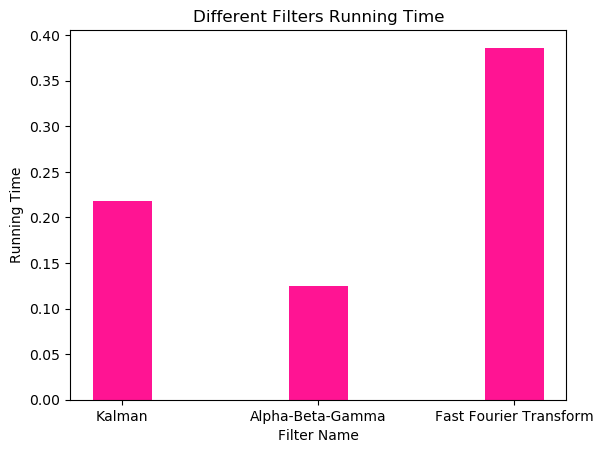

In [27]:
filters = ('Kalman', 'Alpha-Beta-Gamma', 'Fast Fourier Transform')
y_pos = np.arange(len(filters))

plt.bar(y_pos, filter_times,0.3, color="deeppink" ,align='center', alpha=1)
plt.rcParams['figure.figsize'] = [10, 5]
plt.xticks(y_pos, filters)
plt.xlabel('Filter Name')
plt.ylabel('Running Time')
plt.title('Different Filters Running Time')

plt.show()

In [28]:
kshuf, ktrain, kvalidation, ktest, kX_train, ktarget_train, kX_validation, ktarget_validation, kX_test, ktarget_test = split_train_validation_test(kalman_filtered2, 0.8,0.1)


In [29]:
ashuf, atrain, avalidation, atest, aX_train, atarget_train, aX_validation, atarget_validation, aX_test, atarget_test = split_train_validation_test(alpha_filtered2, 0.8,0.1)


In [30]:
fshuf, ftrain, fvalidation, ftest, fX_train, ftarget_train, fX_validation, ftarget_validation, fX_test, ftarget_test = split_train_validation_test(fft_filtered2, 0.8,0.1)


In [31]:
def plot_measured_estimated(measured_signal, estimated_signal, title):
    signals = [{'name': 'Measured Signal', 'x': np.arange(len(measured_signal)),
             'y': measured_signal, 'color':'orange', 'linewidth':3},
            {'name': 'Estimated Signal', 'x': np.arange(len(estimated_signal)),
             'y': estimated_signal, 'color':'green', 'linewidth':3}]

    fig, ax = plt.subplots()
    for signal in signals:
        ax.plot(signal['x'], signal['y'], 
                color=signal['color'], 
                linewidth=signal['linewidth'],
                label=signal['name'])
    plt.rcParams['figure.figsize'] = [40, 20]
    ax.legend()
    ax.set_title(title)
    plt.show()
    

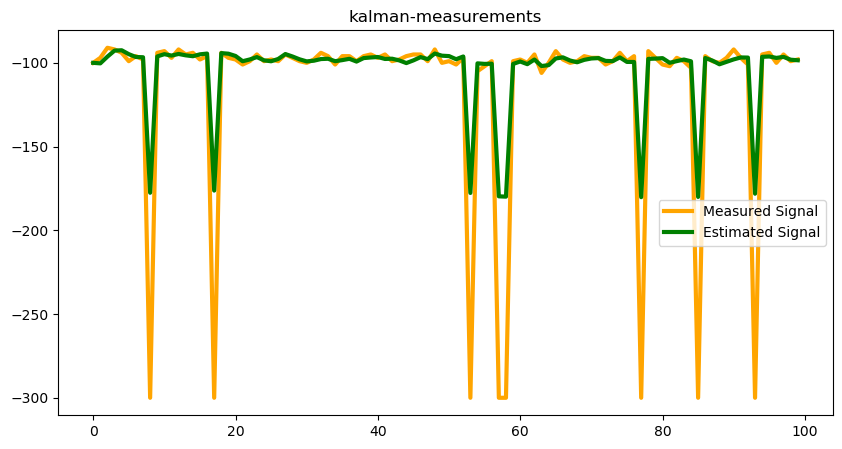

In [32]:
plot_measured_estimated(fingerprints_df['beacon1'].values.tolist()[:100],kalman_filtered2['beacon1'].values.tolist()[:100],"kalman-measurements")

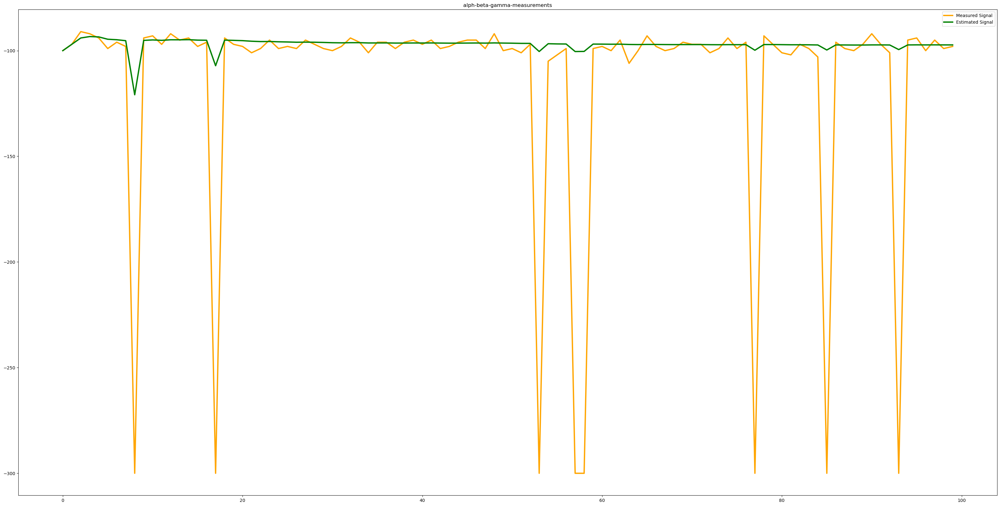

In [33]:
plot_measured_estimated(fingerprints_df['beacon1'].values.tolist()[:100],alpha_filtered2['beacon1'].values.tolist()[:100],"alph-beta-gamma-measurements")

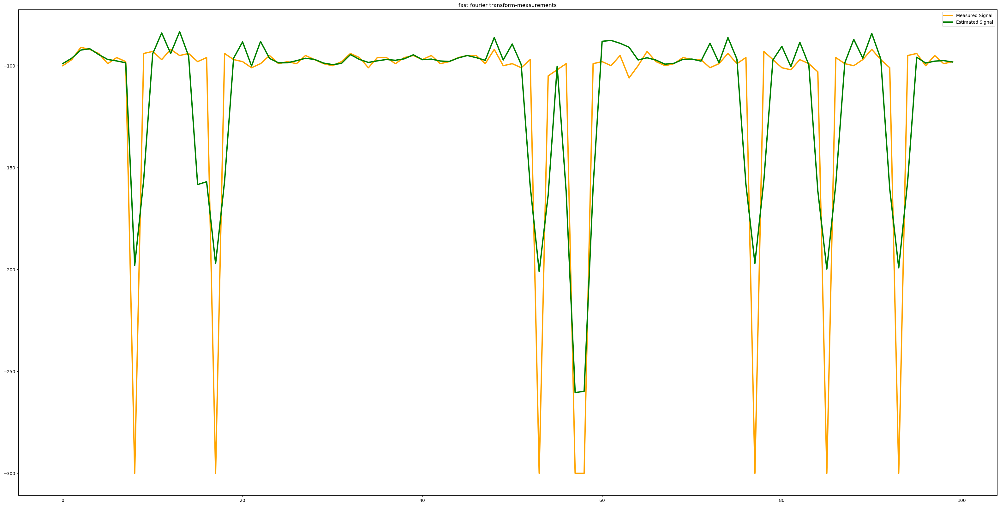

In [34]:
plot_measured_estimated(fingerprints_df['beacon1'].values.tolist()[0:100],fft_filtered2['beacon1'].values.tolist()[0:100],"fast fourier transform-measurements")

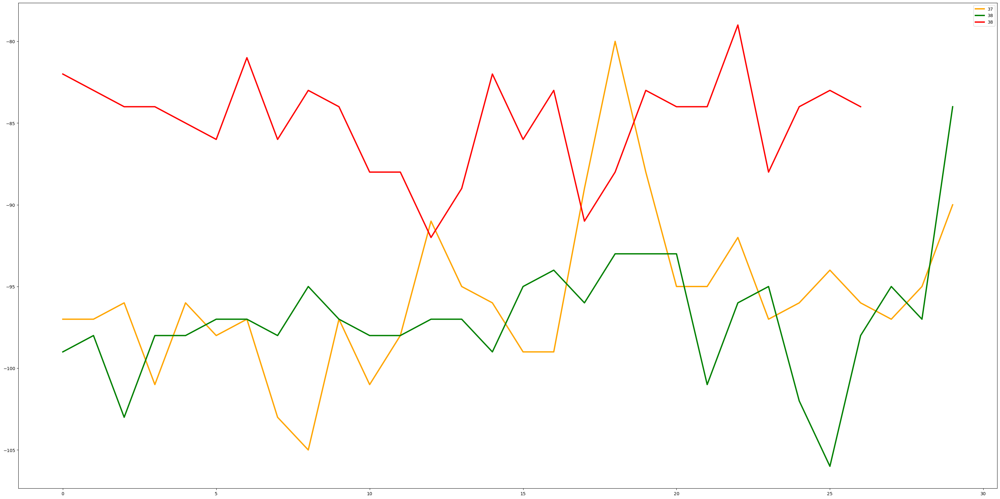

In [35]:

signals = [{'name': '37', 'x': np.arange(len(fingerprints_df[(fingerprints_df.channel5_37==1)]['beacon1'].values.tolist()[0:30])),
             'y': fingerprints_df[(fingerprints_df.channel5_37==1)]['beacon5'].values.tolist()[0:30], 'color':'orange', 'linewidth':3},
            {'name': '38', 'x': np.arange(len(fingerprints_df[(fingerprints_df.channel5_38==1)]['beacon1'].values.tolist()[0:30])),
             'y': fingerprints_df[(fingerprints_df.channel5_38==1)]['beacon5'].values.tolist()[0:30], 'color':'green', 'linewidth':3},
            {'name': '38', 'x': np.arange(len(fingerprints_df[(fingerprints_df.channel5_39==1)]['beacon1'].values.tolist()[0:30])),
             'y': fingerprints_df[(fingerprints_df.channel5_39==1)]['beacon5'].values.tolist()[0:30], 'color':'red', 'linewidth':3}]

fig, ax = plt.subplots()
for signal in signals:
        ax.plot(signal['x'], signal['y'], 
                color=signal['color'], 
                linewidth=signal['linewidth'],
                label=signal['name'])
plt.rcParams['figure.figsize'] = [40, 20]
ax.legend()
# ax.set_title(title)
plt.show()


# Artificial Intelligence Algorithms

## K Nearest Neighbours

In [36]:
def k_nearest_neighbours(X_train, target_train, X_test, target_test,title):  
    accuracies = []
    for k in range(1, 9):
        knn = KNeighborsClassifier(n_neighbors = k, metric='manhattan')
        knn.fit(X_train, target_train)
        y_pred = knn.predict(X_test)
        accuracies.append(accuracy_score(target_test, y_pred)*100)

    plt.plot(list(range(1,9)), accuracies)
    plt.xticks(range(1,9))
    plt.xlabel('k')
    plt.ylabel('accuracy')
    plt.title('K-nearest neighbours alogrithm accuracies with '+title)
    plt.show()
    print("K-nearest neighbours algorithm accuracy: "+ str(max(accuracies)))
    return max(accuracies)

In [37]:
def run_knn(X_train, target_train, X_test, target_test, k):
    knn = KNeighborsClassifier(n_neighbors = k, metric='manhattan')
    knn.fit(X_train, target_train)
    start_time = time.time()
    y_pred = knn.predict(X_test)
    runtime = round(time.time() - start_time,4)
    return y_pred, runtime

#### K-NN with the Original Data

##### Original Data without Channel Data

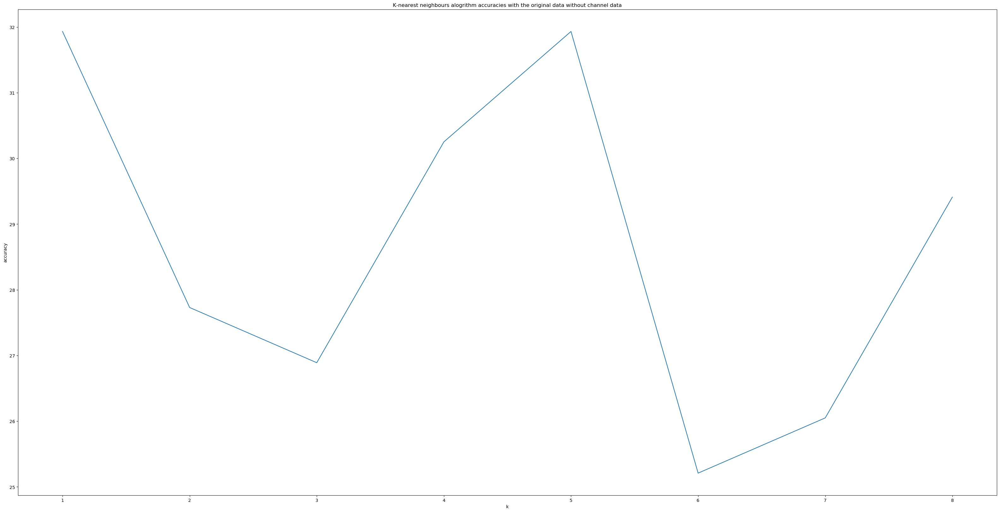

K-nearest neighbours algorithm accuracy: 31.932773109243694


31.932773109243694

In [38]:
no_channel_training_cols = ['beacon1', 'beacon2','beacon3','beacon4','beacon5','beacon6', 'beacon7', 'beacon8', 'beacon9', 'beacon10', 'beacon11', 'beacon12','beacon13','beacon14','beacon15','beacon16', 'beacon17', 'beacon18', 'beacon19', 'beacon20']
X_train_nc = X_train.loc[:, no_channel_training_cols]
X_validation_nc = X_validation.loc[:, no_channel_training_cols]
k_nearest_neighbours(X_train_nc, target_train, X_validation_nc, target_validation, "the original data without channel data")

##### Original Data with Channel Data

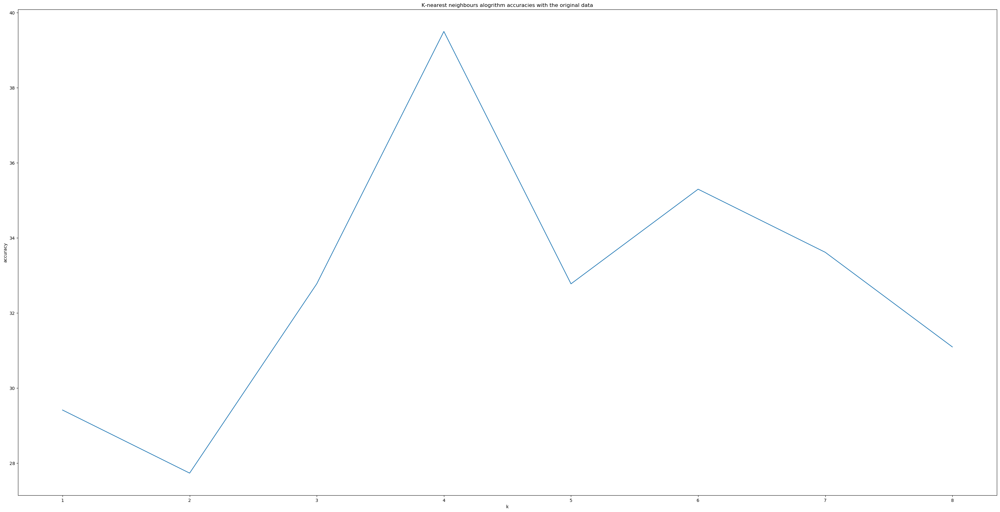

K-nearest neighbours algorithm accuracy: 39.49579831932773


In [39]:
accuracies = []
accuracies.append(k_nearest_neighbours(X_train, target_train, X_validation, target_validation, "the original data"))

#### K-NN with the Kalman Filter Preprocessing

In [40]:
def split_train_cols(dataframe):
    training_cols = [col for col in dataframe if col not in ['location']]
    train_set = dataframe.loc[:, training_cols]
    target_train = dataframe.loc[:, 'location']
    return train_set, target_train

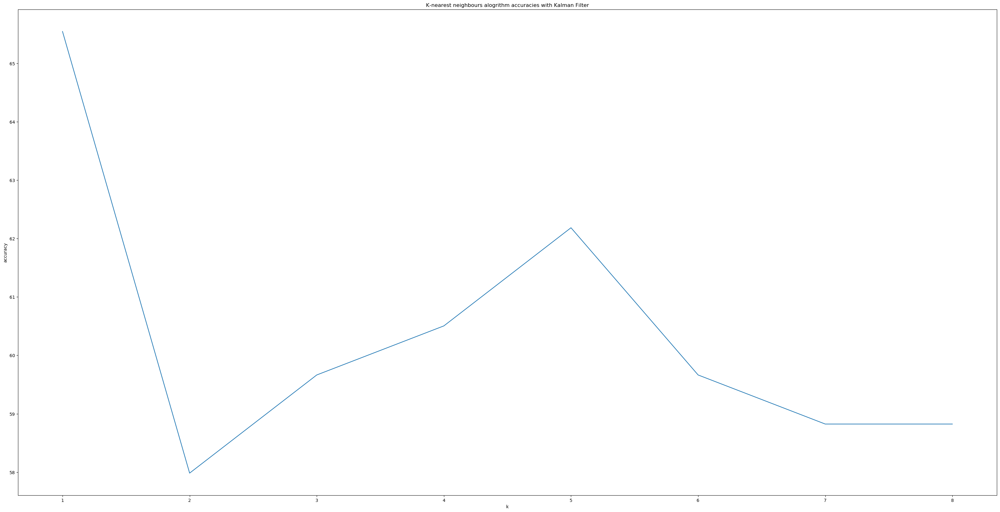

K-nearest neighbours algorithm accuracy: 65.54621848739495


In [41]:
accuracies.append(k_nearest_neighbours(kX_train, ktarget_train, kX_validation, ktarget_validation, "Kalman Filter"))

#### K-NN with the Alpha-Beta-Gamma Filter Preprocessing

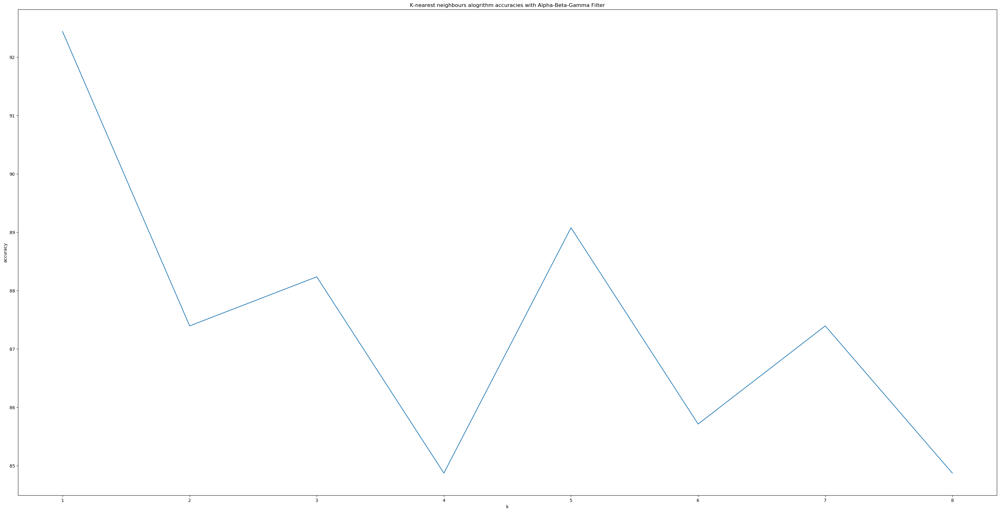

K-nearest neighbours algorithm accuracy: 92.43697478991596


In [42]:
accuracies.append(k_nearest_neighbours(aX_train, atarget_train, aX_validation, atarget_validation, "Alpha-Beta-Gamma Filter"))

#### K-NN with the Fast Fourier Transform Filter Preprocessing

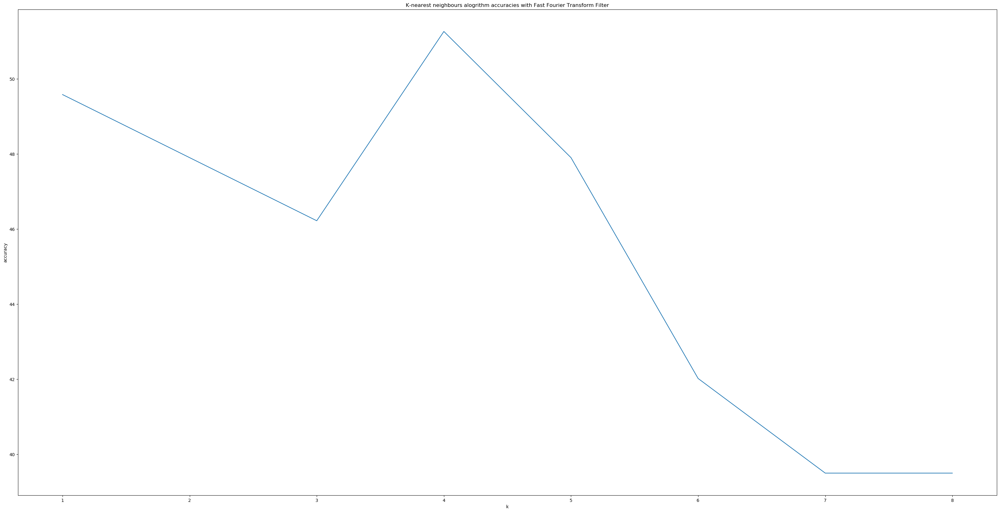

K-nearest neighbours algorithm accuracy: 51.26050420168067


In [43]:
accuracies.append(k_nearest_neighbours(fX_train, ftarget_train, fX_validation, ftarget_validation, "Fast Fourier Transform Filter"))

In [44]:
def filter_algorithm_accuracy_bardrawer(accuracies,title):
    filters = ('No filter','Kalman', 'Alpha-Beta-Gamma', 'Fast Fourier Transform')
    y_pos = np.arange(len(filters))
    print(accuracies)
    plt.bar(y_pos, accuracies,0.3, color="deeppink" ,align='center', alpha=1)
    plt.xticks(y_pos, filters)
    plt.xlabel('Filter Name')
    plt.ylabel('Accuracy')
#     plt.rcParams['figure.figsize'] = [10, 10]
    plt.title(title)

    plt.show()

#### Summary

[39.49579831932773, 65.54621848739495, 92.43697478991596, 51.26050420168067]


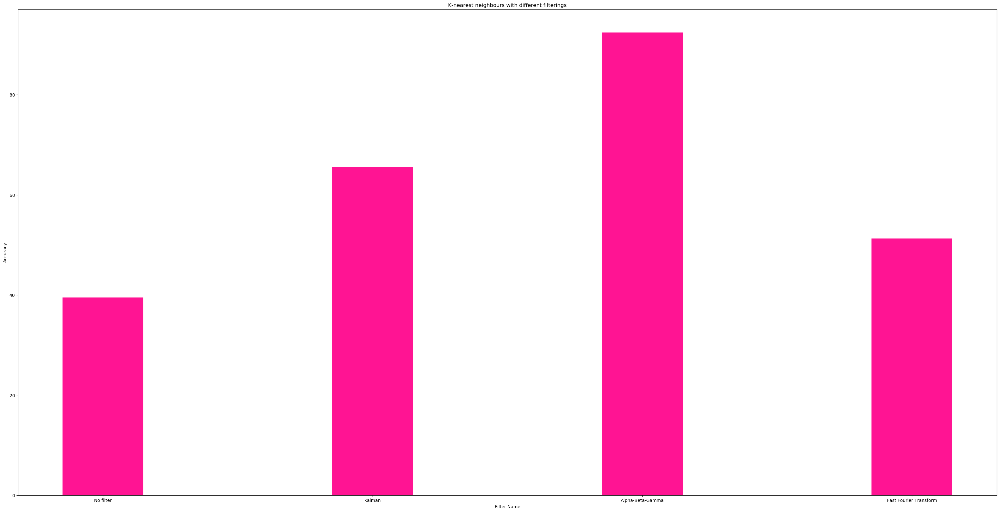

In [45]:
filter_algorithm_accuracy_bardrawer(accuracies, "K-nearest neighbours with different filterings")

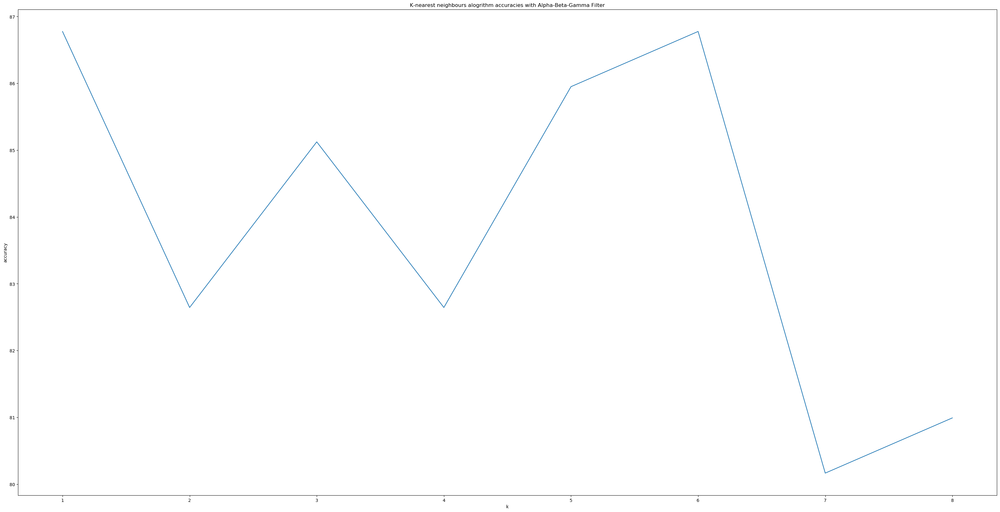

K-nearest neighbours algorithm accuracy: 86.77685950413223


86.77685950413223

In [46]:
k_nearest_neighbours(aX_train, atarget_train, aX_test, atarget_test, "Alpha-Beta-Gamma Filter")

In [47]:
prediction, run_time = run_knn(aX_train, atarget_train, aX_test, atarget_test, 6)
print(classification_report(atarget_test,prediction))
print("K nearest neighbours algorithm predication time: "+ str(run_time))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         2
           4       1.00      1.00      1.00         2
           5       1.00      1.00      1.00         1
           7       0.00      0.00      0.00         1
           8       0.50      1.00      0.67         1
           9       1.00      1.00      1.00         1
          10       0.00      0.00      0.00         0
          11       1.00      0.75      0.86         4
          12       1.00      1.00      1.00         4
          13       1.00      1.00      1.00         1
          14       1.00      1.00      1.00         3
          15       1.00      0.67      0.80         3
          16       0.00      0.00      0.00         0
          17       1.00      1.00      1.00         1
          19       1.00    

## Decision Tree

In [48]:
grid_dt_parameters = {'criterion': ["gini", "entropy", "log_loss"], 'splitter': ["best", "random"],'max_depth': [3, 5, 8, 10, 15,20]}
grid_dt = GridSearchCV(tree.DecisionTreeClassifier(),grid_dt_parameters,refit=True,verbose=2)
print(grid_dt.fit(aX_train, atarget_train))

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END .........criterion=gini, max_depth=3, splitter=best; total time=   0.0s
[CV] END .........criterion=gini, max_depth=3, splitter=best; total time=   0.0s
[CV] END .........criterion=gini, max_depth=3, splitter=best; total time=   0.0s
[CV] END .........criterion=gini, max_depth=3, splitter=best; total time=   0.0s
[CV] END .........criterion=gini, max_depth=3, splitter=best; total time=   0.0s
[CV] END .......criterion=gini, max_depth=3, splitter=random; total time=   0.0s
[CV] END .......criterion=gini, max_depth=3, splitter=random; total time=   0.0s
[CV] END .......criterion=gini, max_depth=3, splitter=random; total time=   0.0s
[CV] END .......criterion=gini, max_depth=3, splitter=random; total time=   0.0s
[CV] END .......criterion=gini, max_depth=3, splitter=random; total time=   0.0s
[CV] END .........criterion=gini, max_depth=5, splitter=best; total time=   0.0s
[CV] END .........criterion=gini, max_depth=5, 

[CV] END .....criterion=entropy, max_depth=15, splitter=best; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=15, splitter=best; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=15, splitter=best; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=15, splitter=best; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, splitter=random; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, splitter=random; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, splitter=random; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, splitter=random; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, splitter=random; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=20, splitter=best; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=20, splitter=best; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=20, splitter=best; total time=   0.0s
[CV] END .....criterion=entr

In [49]:
grid_dt.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=15)

In [50]:
start_time = time.time()
grid_dt_predictions = grid_dt.predict(aX_test)
runtime = round(time.time() - start_time,4)
print("Decision tree algorithm prediction time: "+ str(runtime))
print(classification_report(atarget_test,grid_dt_predictions))

Decision tree algorithm prediction time: 0.0032
              precision    recall  f1-score   support

           0       0.67      1.00      0.80         2
           1       1.00      0.33      0.50         3
           2       0.80      1.00      0.89         4
           3       1.00      0.50      0.67         2
           4       0.67      1.00      0.80         2
           5       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          10       0.00      0.00      0.00         0
          11       1.00      0.75      0.86         4
          12       1.00      1.00      1.00         4
          13       1.00      1.00      1.00         1
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          17       1.00      1.00      1.00         1
          18       0.00      0.00

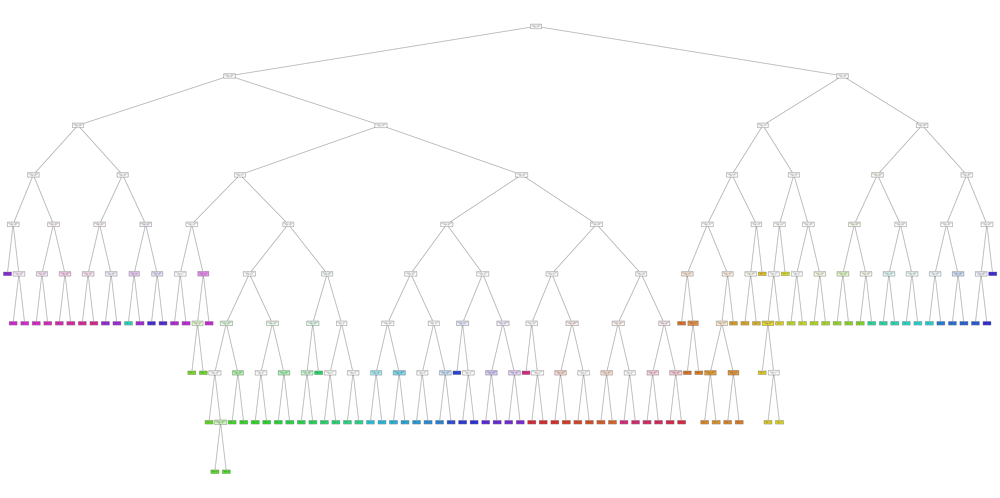

<Figure size 4000x2000 with 0 Axes>

In [51]:
fig, ax = plt.subplots(figsize=(80,40))
dfig = plt.figure()
tree.plot_tree(grid_dt.best_estimator_, 
                   feature_names=list(aX_test.columns),  
                   class_names= [str(i) for i in list(fingerprints_df.location.unique())],
                   filled=True, fontsize= 4, ax = ax)

def replace_text(obj):
    if type(obj) == mpl.text.Annotation:
        txt = obj.get_text()
        txt = re.sub("\nsamples[^$]*class","\nclass",txt)
        obj.set_text(txt)
    return obj
    
ax.properties()['children'] = [replace_text(i) for i in ax.properties()['children']]
fig.savefig('plot.png', dpi=300, bbox_inches='tight')
fig.show() 


In [52]:
fX_validation

,beacon1,beacon2,beacon3,beacon4,beacon5,beacon6,beacon7,beacon8,beacon9,beacon10,...,channel18_38,channel18_39,channel19_0,channel19_37,channel19_38,channel19_39,channel20_0,channel20_37,channel20_38,channel20_39
12,-94.000000,-84.130204,-222.314232,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-90.998214,...,0,0,1,0,0,0,1,0,0,0
23,-96.405330,-82.957107,-211.251786,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-97.508883,...,0,0,1,0,0,0,1,0,0,0
31,-98.905330,-84.000000,-300.000000,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-162.200009,...,0,0,1,0,0,0,1,0,0,0
44,-96.198223,-93.931981,-259.648232,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-86.946438,...,0,0,1,0,0,0,1,0,0,0
47,-97.344670,-84.266243,-200.000000,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-199.655330,...,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1178,-300.000000,-300.000000,-300.000000,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-300.000000,...,0,1,0,0,1,0,1,0,0,0
1184,-300.000000,-300.000000,-300.000000,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-300.000000,...,0,0,0,1,0,0,1,0,0,0
1150,-300.000000,-300.000000,-300.000000,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-300.000000,...,0,0,0,1,0,0,1,0,0,0
1155,-300.000000,-300.000000,-300.000000,-300.0,-300.0,-300.0,-300.0,-300.0,-300.0,-300.000000,...,1,0,0,0,1,0,1,0,0,0


In [53]:
tr = tree.DecisionTreeClassifier(criterion='entropy', max_depth=15)
tr.fit(fX_train, ftarget_train)
grid_dt_predictions_ff = tr.predict(fX_validation)

print(classification_report(ftarget_validation,grid_dt_predictions_ff))

              precision    recall  f1-score   support

           0       0.20      1.00      0.33         1
           1       0.00      0.00      0.00         2
           2       1.00      0.50      0.67         2
           3       0.00      0.00      0.00         0
           4       1.00      0.20      0.33         5
           5       0.50      1.00      0.67         2
           6       0.50      0.25      0.33         4
           7       0.00      0.00      0.00         3
           8       0.33      0.50      0.40         2
           9       1.00      1.00      1.00         2
          10       0.25      0.50      0.33         2
          11       0.00      0.00      0.00         1
          12       1.00      1.00      1.00         1
          13       0.60      1.00      0.75         3
          14       0.33      0.33      0.33         3
          15       0.00      0.00      0.00         2
          17       0.25      0.25      0.25         4
          18       0.00    

In [54]:
tr1 = tree.DecisionTreeClassifier(criterion='entropy', max_depth=15)
tr1.fit(kX_train, ktarget_train)
grid_dt_predictions_k = tr.predict(kX_validation)

print(classification_report(ktarget_validation,grid_dt_predictions_k))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         2
           2       0.00      0.00      0.00         2
           4       0.50      0.20      0.29         5
           5       0.40      1.00      0.57         2
           6       0.38      0.75      0.50         4
           7       0.50      0.33      0.40         3
           8       0.67      1.00      0.80         2
           9       1.00      1.00      1.00         2
          10       0.00      0.00      0.00         2
          11       0.00      0.00      0.00         1
          12       0.00      0.00      0.00         1
          13       0.00      0.00      0.00         3
          14       0.50      0.33      0.40         3
          15       0.00      0.00      0.00         2
          16       0.00      0.00      0.00         0
          17       0.40      0.50      0.44         4
          20       0.00    

In [55]:
tr2 = tree.DecisionTreeClassifier(criterion='entropy', max_depth=15)
tr2.fit(X_train_nc, target_train)
grid_dt_predictions_nc = tr2.predict(X_validation_nc)

print(classification_report(target_validation,grid_dt_predictions_nc))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         2
           2       0.20      0.50      0.29         2
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         2
           6       0.50      0.25      0.33         4
           7       0.50      0.33      0.40         3
           8       0.00      0.00      0.00         2
           9       1.00      1.00      1.00         2
          10       0.33      0.50      0.40         2
          11       0.00      0.00      0.00         1
          12       1.00      1.00      1.00         1
          13       1.00      0.33      0.50         3
          14       0.50      0.33      0.40         3
          15       0.00      0.00      0.00         2
          16       0.00      0.00      0.00         0
          17       0.33    

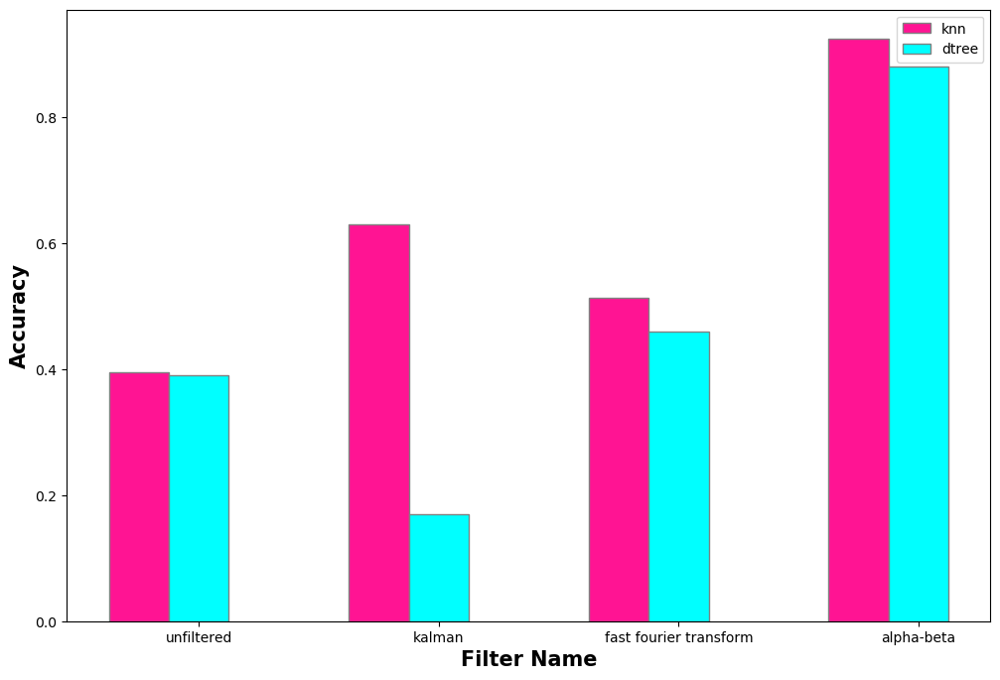

In [56]:
barWidth = 0.25
fig = plt.subplots(figsize =(12, 8))
 
knn = [0.3949579831932773, 0.6302521008403361,  0.5126050420168067,0.9243697478991596]
dtr = [0.39, 0.17, 0.46, 0.88]
 
br1 = np.arange(len(knn))
br2 = [x + barWidth for x in br1]
 
plt.bar(br1, knn, color ='deeppink', width = barWidth,
        edgecolor ='grey', label ='knn')
plt.bar(br2, dtr, color ='#00FFFF', width = barWidth,
        edgecolor ='grey', label ='dtree')


plt.xlabel('Filter Name', fontweight ='bold', fontsize = 15)
plt.ylabel('Accuracy', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(knn))],
        ['unfiltered', 'kalman', 'fast fourier transform', 'alpha-beta'])
 
plt.legend()
plt.show()

## Random Forest

In [57]:
rfc = RandomForestClassifier()
forest_params = [{'criterion': ["gini", "entropy", "log_loss"], 'max_depth':[5,8,10,12,15], 'max_features': [10,15,20,25,30,35,40]}]
clf = GridSearchCV(rfc, forest_params, cv = 5, scoring='accuracy',refit=True,verbose=2)
print(clf.fit(aX_train, atarget_train))

Fitting 5 folds for each of 105 candidates, totalling 525 fits
[CV] END .......criterion=gini, max_depth=5, max_features=10; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=10; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=10; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=10; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=10; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=15; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=15; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=15; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=15; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=15; total time=   0.2s
[CV] END .......criterion=gini, max_depth=5, max_features=20; total time=   0.3s
[CV] END .......criterion=gini, max_depth=5, m

[CV] END ......criterion=gini, max_depth=10, max_features=40; total time=   0.6s
[CV] END ......criterion=gini, max_depth=10, max_features=40; total time=   0.6s
[CV] END ......criterion=gini, max_depth=10, max_features=40; total time=   0.5s
[CV] END ......criterion=gini, max_depth=10, max_features=40; total time=   0.5s
[CV] END ......criterion=gini, max_depth=12, max_features=10; total time=   0.3s
[CV] END ......criterion=gini, max_depth=12, max_features=10; total time=   0.3s
[CV] END ......criterion=gini, max_depth=12, max_features=10; total time=   0.3s
[CV] END ......criterion=gini, max_depth=12, max_features=10; total time=   0.3s
[CV] END ......criterion=gini, max_depth=12, max_features=10; total time=   0.3s
[CV] END ......criterion=gini, max_depth=12, max_features=15; total time=   0.3s
[CV] END ......criterion=gini, max_depth=12, max_features=15; total time=   0.4s
[CV] END ......criterion=gini, max_depth=12, max_features=15; total time=   0.4s
[CV] END ......criterion=gin

[CV] END ....criterion=entropy, max_depth=5, max_features=35; total time=   0.6s
[CV] END ....criterion=entropy, max_depth=5, max_features=35; total time=   0.6s
[CV] END ....criterion=entropy, max_depth=5, max_features=40; total time=   0.7s
[CV] END ....criterion=entropy, max_depth=5, max_features=40; total time=   0.7s
[CV] END ....criterion=entropy, max_depth=5, max_features=40; total time=   0.7s
[CV] END ....criterion=entropy, max_depth=5, max_features=40; total time=   0.7s
[CV] END ....criterion=entropy, max_depth=5, max_features=40; total time=   0.7s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.3s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.3s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.3s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.3s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.3s
[CV] END ....criterion=entro

[CV] END ...criterion=entropy, max_depth=12, max_features=35; total time=   0.8s
[CV] END ...criterion=entropy, max_depth=12, max_features=35; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=12, max_features=35; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=12, max_features=35; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=12, max_features=35; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=12, max_features=40; total time=   1.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=40; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=12, max_features=40; total time=   0.8s
[CV] END ...criterion=entropy, max_depth=12, max_features=40; total time=   0.8s
[CV] END ...criterion=entropy, max_depth=12, max_features=40; total time=   0.8s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.3s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.4s
[CV] END ...criterion=entrop

[CV] END ...criterion=log_loss, max_depth=8, max_features=30; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=35; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=35; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=35; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=35; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=35; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=40; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=40; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=40; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=40; total time=   0.0s
[CV] END ...criterion=log_loss, max_depth=8, max_features=40; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=10, max_features=10; total time=   0.0s
[CV] END ..criterion=log_los

[CV] END ..criterion=log_loss, max_depth=15, max_features=35; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=35; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=35; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=35; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=35; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=40; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=40; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=40; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=40; total time=   0.0s
[CV] END ..criterion=log_loss, max_depth=15, max_features=40; total time=   0.0s
GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid=[{'criterion': ['gini', 'entropy', 'log_loss'],
                          'max_depth': [5, 8, 10, 12, 15],
    

In [58]:
clf.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=12, max_features=15)

In [59]:
start_time = time.time()
grid_rforest_predictions = clf.predict(aX_test)
runtime = round(time.time() - start_time,4)
print("Random Forest algorithm prediction time: "+ str(runtime))
print(classification_report(atarget_test,grid_rforest_predictions))

Random Forest algorithm prediction time: 0.0228
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         3
           2       1.00      0.75      0.86         4
           3       0.50      0.50      0.50         2
           4       0.67      1.00      0.80         2
           5       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          10       0.00      0.00      0.00         0
          11       1.00      0.75      0.86         4
          12       1.00      1.00      1.00         4
          13       1.00      1.00      1.00         1
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          17       1.00      1.00      1.00         1
          19       1.00      1.00

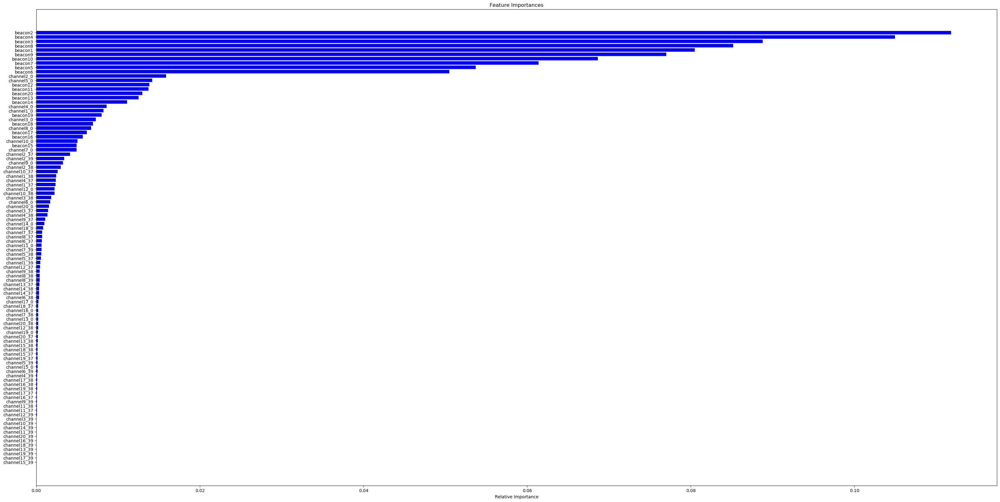

In [60]:
features = aX_train.columns
importances = clf.best_estimator_.feature_importances_
indices = np.argsort(importances) 
indices
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

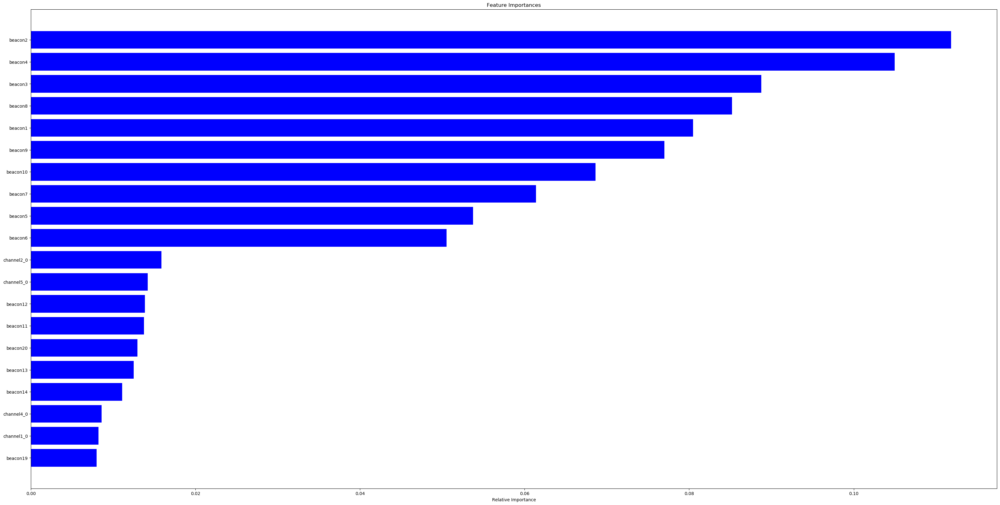

In [61]:
indices2 = indices[-20:]
plt.title('Feature Importances')
plt.barh(range(len(indices2)), importances[indices2], color='b', align='center')
plt.yticks(range(len(indices2)), [features[i] for i in indices2])
plt.xlabel('Relative Importance')
plt.show()

In [62]:
indices = np.flip(indices, axis=None)

In [63]:
selected_col_count = 40
counter = 0
selected_columns = []
for ind in indices:
    if counter< selected_col_count:
        selected_columns.append(features[ind])
        counter+= 1
    else:
        break
selected_columns

['beacon2',
 'beacon4',
 'beacon3',
 'beacon8',
 'beacon1',
 'beacon9',
 'beacon10',
 'beacon7',
 'beacon5',
 'beacon6',
 'channel2_0',
 'channel5_0',
 'beacon12',
 'beacon11',
 'beacon20',
 'beacon13',
 'beacon14',
 'channel4_0',
 'channel1_0',
 'beacon19',
 'channel3_0',
 'beacon18',
 'channel8_0',
 'beacon17',
 'beacon16',
 'channel10_0',
 'beacon15',
 'channel7_0',
 'channel2_37',
 'channel2_39',
 'channel9_0',
 'channel2_38',
 'channel10_37',
 'channel1_38',
 'channel4_37',
 'channel1_37',
 'channel12_0',
 'channel10_38',
 'channel3_38',
 'channel6_0']

## Support Vector Machine 

In [64]:
min_max_scaler = MinMaxScaler()
scaled_aXtrain = aX_train.copy()
scaled_aXtrain[:] = min_max_scaler.fit_transform(scaled_aXtrain[:])
scaled_aXtrain

,beacon1,beacon2,beacon3,beacon4,beacon5,beacon6,beacon7,beacon8,beacon9,beacon10,...,channel18_38,channel18_39,channel19_0,channel19_37,channel19_38,channel19_39,channel20_0,channel20_37,channel20_38,channel20_39
17,0.471856,0.703556,0.676671,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.841694,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.819877,0.328059,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.900201,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
10,0.891011,0.764821,0.491994,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.337487,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.940068,0.664030,0.272919,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.893614,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,0.894281,0.720025,0.479864,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1160,0.950802,0.015442,0.999138,0.999138,0.999138,0.999138,0.999138,0.999138,0.999138,0.988873,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1167,0.950838,0.015564,0.999143,0.999143,0.999143,0.999143,0.999143,0.999143,0.999143,0.988901,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1164,0.950823,0.015512,0.999141,0.999141,0.999141,0.999141,0.999141,0.999141,0.999141,0.988889,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
1168,0.950844,0.015581,0.999144,0.999144,0.999144,0.999144,0.999144,0.999144,0.999144,0.988905,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [65]:
# aX_train_feature_selected =aX_train.loc[:, selected_columns]
grid_svm_parameters = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001],'kernel': ['poly','rbf', 'sigmoid','linear']}
grid = GridSearchCV(SVC(),grid_svm_parameters,refit=True,verbose=2)
print(grid.fit(scaled_aXtrain.loc[:, selected_columns], atarget_train))

Fitting 5 folds for each of 64 candidates, totalling 320 fits
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=0.1, gamma=1, k

[CV] END ........................C=1, gamma=0.1, kernel=poly; total time=   0.1s
[CV] END ........................C=1, gamma=0.1, kernel=poly; total time=   0.1s
[CV] END ........................C=1, gamma=0.1, kernel=poly; total time=   0.1s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.1s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.1s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.1s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.1s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.1s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END ...................

[CV] END ......................C=10, gamma=0.01, kernel=poly; total time=   0.1s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ....................C=10, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ...................

[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.1s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.1s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ..................C

In [66]:
grid.best_estimator_

SVC(C=10, gamma=1, kernel='poly')

In [67]:
scaled_aXtest = aX_test.copy()
scaled_aXtest[:] = min_max_scaler.fit_transform(scaled_aXtest[:])
start_time = time.time()
svm_grid_predictions = grid.predict(scaled_aXtest.loc[:, selected_columns])
runtime = round(time.time() - start_time,4)
print("Support Vector Machine algorithm prediction time: "+ str(runtime))
print(classification_report(atarget_test,svm_grid_predictions))

Support Vector Machine algorithm prediction time: 0.0163
              precision    recall  f1-score   support

           0       0.18      1.00      0.31         2
           1       0.00      0.00      0.00         3
           2       0.00      0.00      0.00         4
           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00         2
           5       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         1
           8       1.00      1.00      1.00         1
           9       0.00      0.00      0.00         1
          10       0.00      0.00      0.00         0
          11       0.43      0.75      0.55         4
          12       0.00      0.00      0.00         4
          13       0.00      0.00      0.00         1
          14       0.33      0.33      0.33         3
          15       1.00      0.33      0.50         3
          16       0.00 

In [68]:
fingerprints_df2 = fingerprints_df_from_file.iloc[: , 2:]
for col in channel_cols:
    fingerprints_df2[col] = fingerprints_df2[col].map(str)
alpha_filtered3 = apply_filter_to_whole(fingerprints_df2, "alpha_beta_gamma","alpha_3.csv")
ashuf2, atrain2, avalidation2, atest2, aX_train2, atarget_train2, aX_validation2, atarget_validation2, aX_test2, atarget_test2 = split_train_validation_test(alpha_filtered3, 0.8,0.1)
grid = GridSearchCV(SVC(),grid_svm_parameters,refit=True,verbose=2)
print(grid.fit(aX_train2, atarget_train2))

Fitting 5 folds for each of 64 candidates, totalling 320 fits
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=0.1, gamma=1, k

[CV] END ........................C=1, gamma=0.1, kernel=poly; total time=   0.1s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.2s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.2s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.2s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.2s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.2s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END ......................C=1, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END ...................

[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ....................C=10, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ....................C=10, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ....................C=10, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ....................C=10, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ...................

[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001]

In [69]:
grid.best_estimator_

SVC(C=0.1, gamma=0.001, kernel='poly')

In [70]:
start_time = time.time()
svm_grid_predictions2 = grid.predict(aX_test2)
runtime = round(time.time() - start_time,4)
print("Support Vector Machine algorithm prediction time: "+ str(runtime))
print(classification_report(atarget_test2,svm_grid_predictions2))

Support Vector Machine algorithm prediction time: 0.0121
              precision    recall  f1-score   support

          b1       1.00      1.00      1.00         2
          b2       1.00      1.00      1.00         3
          b3       0.80      1.00      0.89         4
          b4       0.00      0.00      0.00         2
          b5       0.67      1.00      0.80         2
          b6       1.00      1.00      1.00         1
          b8       1.00      1.00      1.00         1
          b9       1.00      1.00      1.00         1
         be1       1.00      1.00      1.00         1
         be2       0.00      0.00      0.00         0
         be3       0.75      0.75      0.75         4
         be4       1.00      0.75      0.86         4
         be5       1.00      1.00      1.00         1
         be6       0.75      1.00      0.86         3
         be7       1.00      0.33      0.50         3
         be8       0.00      0.00      0.00         0
         be9       1.00 

## Artificial Neural Network

In [71]:
ann_model = keras.Sequential()
ann_model.add(keras.layers.InputLayer(input_shape = (100,)))
ann_model.add(keras.layers.Dense(120, activation ='elu'))
ann_model.add(keras.layers.Dropout(0.3))
ann_model.add(keras.layers.Dense(100, activation ='elu'))
ann_model.add(keras.layers.Dropout(0.3))
ann_model.add(keras.layers.Dense(96))
ann_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 120)               12120     
_________________________________________________________________
dropout_1 (Dropout)          (None, 120)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               12100     
_________________________________________________________________
dropout_2 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 96)                9696      
Total params: 33,916
Trainable params: 33,916
Non-trainable params: 0
_________________________________________________________________


2023-07-10 12:28:45.556931: I tensorflow/core/platform/cpu_feature_guard.cc:145] This TensorFlow binary is optimized with Intel(R) MKL-DNN to use the following CPU instructions in performance critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in non-MKL-DNN operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-10 12:28:45.557302: I tensorflow/core/common_runtime/process_util.cc:115] Creating new thread pool with default inter op setting: 12. Tune using inter_op_parallelism_threads for best performance.


In [72]:
ann_model.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),optimizer='adam', metrics=['accuracy'])

In [73]:
one_hot_channel_cols = [col for col in fingerprints_df.columns if col not in no_channel_training_cols+['location']]
scaled_aXtrain_np = scaled_aXtrain.copy()
#scaled_aXtrain_np.loc[:, one_hot_channel_cols] = scaled_aXtrain_np.loc[:, one_hot_channel_cols].replace(0.0, -1)
#scaled_aXtrain_np = scaled_aXtrain_np.loc[:, selected_columns]
scaled_aXtrain_np = scaled_aXtrain_np.to_numpy()
scaled_aXtest_np = scaled_aXtest.copy()
#scaled_aXtest_np.loc[:, one_hot_channel_cols] = scaled_aXtest_np.loc[:, one_hot_channel_cols].replace(0, -1)
#scaled_aXtest_np = scaled_aXtest_np.loc[:, selected_columns]
scaled_aXtest_np = scaled_aXtest_np.to_numpy()
encoded_train_labels = atarget_train.to_numpy()
encoded_test_labels = atarget_test.to_numpy()

In [74]:
history = ann_model.fit(scaled_aXtrain_np, encoded_train_labels , epochs=100)

Epoch 1/100
959/959 [==============================] - 1s 843us/step - loss: 4.4720 - accuracy: 0.0240
Epoch 2/100
959/959 [==============================] - 0s 180us/step - loss: 3.9616 - accuracy: 0.0563
Epoch 3/100
959/959 [==============================] - 0s 181us/step - loss: 3.5205 - accuracy: 0.0813
Epoch 4/100
959/959 [==============================] - 0s 183us/step - loss: 3.2283 - accuracy: 0.1084
Epoch 5/100
959/959 [==============================] - 0s 199us/step - loss: 3.0600 - accuracy: 0.1522
Epoch 6/100
959/959 [==============================] - 0s 182us/step - loss: 2.8752 - accuracy: 0.1721
Epoch 7/100
959/959 [==============================] - 0s 185us/step - loss: 2.7514 - accuracy: 0.2013
Epoch 8/100
959/959 [==============================] - 0s 186us/step - loss: 2.6371 - accuracy: 0.2367
Epoch 9/100
959/959 [==============================] - 0s 184us/step - loss: 2.5191 - accuracy: 0.2482
Epoch 10/100
959/959 [==============================] - 0s 180us/step - l

959/959 [==============================] - 0s 197us/step - loss: 0.9494 - accuracy: 0.6663
Epoch 80/100
959/959 [==============================] - 0s 192us/step - loss: 0.9459 - accuracy: 0.6653
Epoch 81/100
959/959 [==============================] - 0s 193us/step - loss: 0.8844 - accuracy: 0.6903
Epoch 82/100
959/959 [==============================] - 0s 191us/step - loss: 0.9310 - accuracy: 0.6767
Epoch 83/100
959/959 [==============================] - 0s 192us/step - loss: 0.9329 - accuracy: 0.6736
Epoch 84/100
959/959 [==============================] - 0s 193us/step - loss: 0.9009 - accuracy: 0.6767
Epoch 85/100
959/959 [==============================] - 0s 192us/step - loss: 0.9422 - accuracy: 0.6580
Epoch 86/100
959/959 [==============================] - 0s 192us/step - loss: 0.9146 - accuracy: 0.6757
Epoch 87/100
959/959 [==============================] - 0s 194us/step - loss: 0.8978 - accuracy: 0.6736
Epoch 88/100
959/959 [==============================] - 0s 194us/step - loss:

In [75]:
start_time = time.time()
test_loss, test_acc = ann_model.evaluate(scaled_aXtest_np,  encoded_test_labels, verbose=2)
runtime = round(time.time() - start_time,4)
print("Neural Network algorithm prediction time: "+ str(runtime))
test_acc

Neural Network algorithm prediction time: 0.2547


0.4793388545513153

In [76]:
def plot_loss_acc_rate(history):    
#     plt.plot(history.history['val_loss'])
#     plt.title('Model \'s loss')
#     plt.ylabel('loss')
#     plt.xlabel('epoch')
#     plt.show()
#     plt.plot(history.history['val_accuracy'])
    plt.plot(history.history['accuracy'])
    plt.title('Model \'s accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.show()

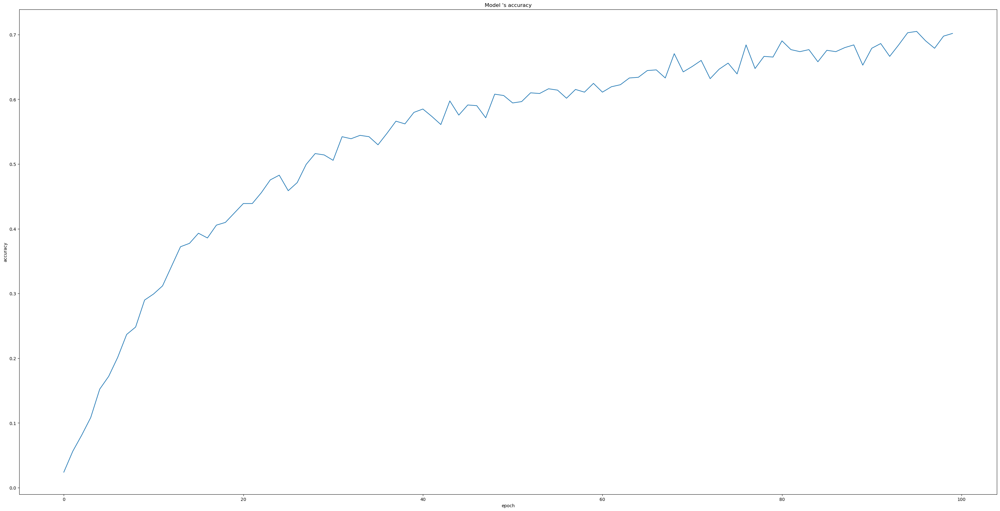

In [77]:
plot_loss_acc_rate(history)

### Unfiltered Data

In [78]:
scaled_Xtrain = X_train.copy()
scaled_Xtrain[:] = min_max_scaler.fit_transform(scaled_Xtrain[:])
scaled_Xtest = X_test.copy()
scaled_Xtest[:] = min_max_scaler.fit_transform(scaled_Xtest[:])
scaled_Xtrain_np = scaled_Xtrain.to_numpy()
scaled_Xtest_np = scaled_Xtest.to_numpy()
train_labels = target_train.to_numpy()
test_labels = target_test.to_numpy()

In [79]:
ann_model2 = keras.Sequential()
ann_model2.add(keras.layers.InputLayer(input_shape = (100,)))
ann_model2.add(keras.layers.Dense(120, activation ='elu'))
ann_model2.add(keras.layers.Dropout(0.3))
ann_model2.add(keras.layers.Dense(100, activation ='elu'))
ann_model2.add(keras.layers.Dropout(0.3))
ann_model2.add(keras.layers.Dense(96))
ann_model2.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 120)               12120     
_________________________________________________________________
dropout_3 (Dropout)          (None, 120)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)               12100     
_________________________________________________________________
dropout_4 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 96)                9696      
Total params: 33,916
Trainable params: 33,916
Non-trainable params: 0
_________________________________________________________________


In [80]:
ann_model2.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),optimizer='adam', metrics=['accuracy'])
history2 = ann_model.fit(scaled_Xtrain_np, train_labels , epochs=15)

Epoch 1/15
959/959 [==============================] - 0s 181us/step - loss: 5.3968 - accuracy: 0.2482
Epoch 2/15
959/959 [==============================] - 0s 198us/step - loss: 2.2275 - accuracy: 0.3535
Epoch 3/15
959/959 [==============================] - 0s 201us/step - loss: 1.9188 - accuracy: 0.3858
Epoch 4/15
959/959 [==============================] - 0s 201us/step - loss: 1.8078 - accuracy: 0.4181
Epoch 5/15
959/959 [==============================] - 0s 201us/step - loss: 1.7884 - accuracy: 0.4098
Epoch 6/15
959/959 [==============================] - 0s 205us/step - loss: 1.7380 - accuracy: 0.4307
Epoch 7/15
959/959 [==============================] - 0s 204us/step - loss: 1.6729 - accuracy: 0.4338
Epoch 8/15
959/959 [==============================] - 0s 201us/step - loss: 1.7005 - accuracy: 0.4286
Epoch 9/15
959/959 [==============================] - 0s 200us/step - loss: 1.6576 - accuracy: 0.4546
Epoch 10/15
959/959 [==============================] - 0s 201us/step - loss: 1.639

In [81]:
start_time = time.time()
test_loss, test_acc = ann_model2.evaluate(scaled_Xtest_np, test_labels, verbose=2)
runtime = round(time.time() - start_time,4)
print("Neural Network algorithm prediction time: "+ str(runtime))
test_acc

Neural Network algorithm prediction time: 0.2506


0.0

## XGBoost Algorithm

In [82]:
xgb_param = {
    'learning_rate': [0.02, 0.05, 0.1, 0.3],
    'max_depth': [6, 8, 10],
    'n_estimators': [50, 80, 100],
    'colsample_bytree' : [0.4, 0.6,0.8]
}
model_xgb_hyper = GridSearchCV(estimator= xgb.XGBClassifier(eval_metric = 'auc', subsample = 0.5),
                              param_grid = xgb_param, cv = 3,
                              return_train_score= True, verbose = 4)
model_xgb_hyper.fit(aX_train,  atarget_train)

Fitting 3 folds for each of 108 candidates, totalling 324 fits
[CV 1/3] END colsample_bytree=0.4, learning_rate=0.02, max_depth=6, n_estimators=50;, score=(train=0.782, test=0.738) total time=   1.2s
[CV 2/3] END colsample_bytree=0.4, learning_rate=0.02, max_depth=6, n_estimators=50;, score=(train=0.776, test=0.684) total time=   1.1s
[CV 3/3] END colsample_bytree=0.4, learning_rate=0.02, max_depth=6, n_estimators=50;, score=(train=0.744, test=0.633) total time=   1.1s
[CV 1/3] END colsample_bytree=0.4, learning_rate=0.02, max_depth=6, n_estimators=80;, score=(train=0.837, test=0.784) total time=   1.8s
[CV 2/3] END colsample_bytree=0.4, learning_rate=0.02, max_depth=6, n_estimators=80;, score=(train=0.829, test=0.759) total time=   1.8s
[CV 3/3] END colsample_bytree=0.4, learning_rate=0.02, max_depth=6, n_estimators=80;, score=(train=0.831, test=0.740) total time=   2.3s
[CV 1/3] END colsample_bytree=0.4, learning_rate=0.02, max_depth=6, n_estimators=100;, score=(train=0.861, test=0.7

[CV 1/3] END colsample_bytree=0.4, learning_rate=0.1, max_depth=6, n_estimators=100;, score=(train=0.980, test=0.887) total time=   2.5s
[CV 2/3] END colsample_bytree=0.4, learning_rate=0.1, max_depth=6, n_estimators=100;, score=(train=0.975, test=0.903) total time=   2.2s
[CV 3/3] END colsample_bytree=0.4, learning_rate=0.1, max_depth=6, n_estimators=100;, score=(train=0.970, test=0.850) total time=   2.2s
[CV 1/3] END colsample_bytree=0.4, learning_rate=0.1, max_depth=8, n_estimators=50;, score=(train=0.926, test=0.838) total time=   1.1s
[CV 2/3] END colsample_bytree=0.4, learning_rate=0.1, max_depth=8, n_estimators=50;, score=(train=0.934, test=0.838) total time=   1.2s
[CV 3/3] END colsample_bytree=0.4, learning_rate=0.1, max_depth=8, n_estimators=50;, score=(train=0.934, test=0.818) total time=   1.6s
[CV 1/3] END colsample_bytree=0.4, learning_rate=0.1, max_depth=8, n_estimators=80;, score=(train=0.975, test=0.884) total time=   2.0s
[CV 2/3] END colsample_bytree=0.4, learning_r

[CV 1/3] END colsample_bytree=0.6, learning_rate=0.02, max_depth=8, n_estimators=80;, score=(train=0.845, test=0.762) total time=   2.4s
[CV 2/3] END colsample_bytree=0.6, learning_rate=0.02, max_depth=8, n_estimators=80;, score=(train=0.831, test=0.769) total time=   2.4s
[CV 3/3] END colsample_bytree=0.6, learning_rate=0.02, max_depth=8, n_estimators=80;, score=(train=0.836, test=0.724) total time=   2.4s
[CV 1/3] END colsample_bytree=0.6, learning_rate=0.02, max_depth=8, n_estimators=100;, score=(train=0.862, test=0.775) total time=   3.0s
[CV 2/3] END colsample_bytree=0.6, learning_rate=0.02, max_depth=8, n_estimators=100;, score=(train=0.858, test=0.794) total time=   3.1s
[CV 3/3] END colsample_bytree=0.6, learning_rate=0.02, max_depth=8, n_estimators=100;, score=(train=0.856, test=0.752) total time=   3.1s
[CV 1/3] END colsample_bytree=0.6, learning_rate=0.02, max_depth=10, n_estimators=50;, score=(train=0.767, test=0.716) total time=   1.6s
[CV 2/3] END colsample_bytree=0.6, le

[CV 1/3] END colsample_bytree=0.6, learning_rate=0.1, max_depth=10, n_estimators=50;, score=(train=0.931, test=0.828) total time=   2.0s
[CV 2/3] END colsample_bytree=0.6, learning_rate=0.1, max_depth=10, n_estimators=50;, score=(train=0.928, test=0.847) total time=   2.0s
[CV 3/3] END colsample_bytree=0.6, learning_rate=0.1, max_depth=10, n_estimators=50;, score=(train=0.930, test=0.812) total time=   2.0s
[CV 1/3] END colsample_bytree=0.6, learning_rate=0.1, max_depth=10, n_estimators=80;, score=(train=0.977, test=0.866) total time=   2.9s
[CV 2/3] END colsample_bytree=0.6, learning_rate=0.1, max_depth=10, n_estimators=80;, score=(train=0.959, test=0.878) total time=   2.8s
[CV 3/3] END colsample_bytree=0.6, learning_rate=0.1, max_depth=10, n_estimators=80;, score=(train=0.956, test=0.809) total time=   2.7s
[CV 1/3] END colsample_bytree=0.6, learning_rate=0.1, max_depth=10, n_estimators=100;, score=(train=0.981, test=0.875) total time=   3.2s
[CV 2/3] END colsample_bytree=0.6, learn

[CV 1/3] END colsample_bytree=0.8, learning_rate=0.02, max_depth=10, n_estimators=100;, score=(train=0.865, test=0.778) total time=   2.9s
[CV 2/3] END colsample_bytree=0.8, learning_rate=0.02, max_depth=10, n_estimators=100;, score=(train=0.861, test=0.781) total time=   3.1s
[CV 3/3] END colsample_bytree=0.8, learning_rate=0.02, max_depth=10, n_estimators=100;, score=(train=0.864, test=0.749) total time=   3.2s
[CV 1/3] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=50;, score=(train=0.870, test=0.784) total time=   1.6s
[CV 2/3] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=50;, score=(train=0.872, test=0.816) total time=   1.6s
[CV 3/3] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=50;, score=(train=0.869, test=0.743) total time=   1.6s
[CV 1/3] END colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=80;, score=(train=0.917, test=0.791) total time=   2.6s
[CV 2/3] END colsample_bytree=0.8, 

[CV 1/3] END colsample_bytree=0.8, learning_rate=0.3, max_depth=6, n_estimators=80;, score=(train=0.994, test=0.869) total time=   2.3s
[CV 2/3] END colsample_bytree=0.8, learning_rate=0.3, max_depth=6, n_estimators=80;, score=(train=0.987, test=0.897) total time=   2.3s
[CV 3/3] END colsample_bytree=0.8, learning_rate=0.3, max_depth=6, n_estimators=80;, score=(train=0.992, test=0.809) total time=   2.1s
[CV 1/3] END colsample_bytree=0.8, learning_rate=0.3, max_depth=6, n_estimators=100;, score=(train=0.995, test=0.872) total time=   2.7s
[CV 2/3] END colsample_bytree=0.8, learning_rate=0.3, max_depth=6, n_estimators=100;, score=(train=0.994, test=0.909) total time=   2.5s
[CV 3/3] END colsample_bytree=0.8, learning_rate=0.3, max_depth=6, n_estimators=100;, score=(train=0.995, test=0.821) total time=   2.6s
[CV 1/3] END colsample_bytree=0.8, learning_rate=0.3, max_depth=8, n_estimators=50;, score=(train=0.987, test=0.875) total time=   1.4s
[CV 2/3] END colsample_bytree=0.8, learning_r

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     enable_categorical=False,
                                     eval_metric='auc', gamma=None, gpu_id=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone...
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                             

In [83]:
model_xgb_hyper.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.4,
              enable_categorical=False, eval_metric='auc', gamma=0, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=12, num_parallel_tree=1,
              objective='multi:softprob', predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=None, subsample=0.5,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [84]:
start_time = time.time()
grid_xgb_predictions = model_xgb_hyper.predict(aX_test)
runtime = round(time.time() - start_time,4)
print("XGBoost algorithm prediction time: "+ str(runtime))
print(classification_report(atarget_test,grid_xgb_predictions))

XGBoost algorithm prediction time: 0.0104
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00         3
           2       1.00      0.50      0.67         4
           3       0.50      1.00      0.67         2
           4       1.00      1.00      1.00         2
           5       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
           8       1.00      1.00      1.00         1
           9       1.00      1.00      1.00         1
          11       1.00      1.00      1.00         4
          12       1.00      1.00      1.00         4
          13       1.00      1.00      1.00         1
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          17       1.00      1.00      1.00         1
          19       1.00      1.00      1.00         1
          21       0.67      1.00      

## Data Generation

### Variational Autoencoder Definition

In [85]:
def sample(means_log_var):
    means, log_var = means_log_var
    epsilon = K.random_normal(shape=(K.shape(means)[0], latent_dim), mean=0, stddev=0.1)
    return means + K.exp(log_var) * epsilon

In [86]:
data_shape = (20,)
latent_dim = 8
input_layer = keras.Input(shape=data_shape)
x = keras.layers.Dense(18, activation ='relu')(input_layer)
x = keras.layers.Dense(15, activation ='relu')(x)
x = keras.layers.Dense(10, activation ='relu')(x)
means = keras.layers.Dense(latent_dim)(x)
log_var = keras.layers.Dense(latent_dim)(x)

z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

encoder = keras.models.Model(input_layer, [means, log_var, z])
print(encoder.summary())

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 20)           0                                            
__________________________________________________________________________________________________
dense_7 (Dense)                 (None, 18)           378         input_3[0][0]                    
__________________________________________________________________________________________________
dense_8 (Dense)                 (None, 15)           285         dense_7[0][0]                    
__________________________________________________________________________________________________
dense_9 (Dense)                 (None, 10)           160         dense_8[0][0]                    
____________________________________________________________________________________________

In [87]:
decoder_input = keras.layers.Input(shape =(latent_dim,))
x = keras.layers.Dense(10, activation ='relu')(decoder_input)
x = keras.layers.Dense(15, activation ='relu')(x)
x = keras.layers.Dense(18, activation ='relu')(x)
outputs = keras.layers.Dense(20, activation ='sigmoid')(x)

decoder = keras.models.Model(decoder_input, outputs)
print(decoder.summary())
x_prime = decoder(z)

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 8)                 0         
_________________________________________________________________
dense_12 (Dense)             (None, 10)                90        
_________________________________________________________________
dense_13 (Dense)             (None, 15)                165       
_________________________________________________________________
dense_14 (Dense)             (None, 18)                288       
_________________________________________________________________
dense_15 (Dense)             (None, 20)                380       
Total params: 923
Trainable params: 923
Non-trainable params: 0
_________________________________________________________________
None


In [88]:
def my_loss(x, x_prime):
#     x = K.flatten(x)
#     x_prime = K.flatten(x_prime)
    reconstruct_loss = 20*keras.metrics.binary_crossentropy(x, x_prime)
    kl_loss = -0.5* K.sum(1 + log_var - K.square(means) - K.exp(log_var), axis = -1)
    return K.mean(reconstruct_loss + kl_loss)


In [89]:
outputs = decoder(encoder(input_layer)[2])
vae = keras.models.Model(input_layer, outputs, name='vae')    
vae.compile(loss=my_loss,optimizer="adam")
print(vae.summary())  

Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 20)                0         
_________________________________________________________________
model_1 (Model)              [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_2 (Model)              (None, 20)                923       
Total params: 1,922
Trainable params: 1,922
Non-trainable params: 0
_________________________________________________________________
None


In [90]:
def create_vae():
    data_shape = (20,)
    latent_dim = 8
    input_layer = keras.Input(shape=data_shape)
    x = keras.layers.Dense(18, activation ='relu')(input_layer)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(10, activation ='relu')(x)
    means = keras.layers.Dense(latent_dim)(x)
    log_var = keras.layers.Dense(latent_dim)(x)

    z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

    encoder = keras.models.Model(input_layer, [means, log_var, z])
    
    decoder_input = keras.layers.Input(shape =(latent_dim,))
    x = keras.layers.Dense(10, activation ='relu')(decoder_input)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(18, activation ='relu')(x)
    outputs = keras.layers.Dense(20, activation ='sigmoid')(x)

    decoder = keras.models.Model(decoder_input, outputs)
    x_prime = decoder(z)
    outputs = decoder(encoder(input_layer)[2])
    vae = keras.models.Model(input_layer, outputs, name='vae')    
    vae.compile(loss=my_loss,optimizer="adam")
    print(vae.summary())
    return vae, encoder

### Data preparation

In [91]:
def data_split_for_syn(dataframe, train_size):
  
    shuffled_df = dataframe.sample(frac=1, random_state = 37)
    train_num = int(train_size * len(dataframe))
    
    train_set_with_label = shuffled_df[:train_num]
    test_set_with_label = shuffled_df[train_num:]
    
    train_set_with_label = train_set_with_label.sort_values('location')
    test_set_with_label = test_set_with_label.sort_values('location')
    
    train_set_with_label.reset_index(inplace=True, drop=True)
    test_set_with_label.reset_index(inplace=True, drop=True)
    
#     train_set_with_label.loc[:, no_channel_training_cols] =  min_max_scaler.fit_transform(train_set_with_label.loc[:, no_channel_training_cols])
#     test_set_with_label.loc[:, no_channel_training_cols] =  min_max_scaler.fit_transform(test_set_with_label.loc[:, no_channel_training_cols])
    return train_set_with_label, test_set_with_label

In [96]:
def prep_data_for_synthesis(dataframe, percentage):
    if percentage <= 0.5:
        frac = int(1/percentage)
    else:
        frac = int(1/(1-percentage))
#     dataframe = dataframe.sample(frac=1, random_state = 37)
#     dataframe.reset_index(inplace=True, drop=True)
    part_df = dataframe.loc[:, no_channel_training_cols + ['location']].iloc[::frac]
    indices = part_df.index
    test_df = dataframe.drop(indices, axis=0).loc[:, no_channel_training_cols + ['location']]

    
    part_locations = part_df.loc[:, ['location']]
#     part_df[:] = min_max_scaler.fit_transform(part_df[:])
    part_df = part_df.loc[:, no_channel_training_cols]
    
    test_locations = test_df.loc[:, ['location']]
#     test_df[:] = min_max_scaler.fit_transform(test_df[:])
    test_df = test_df.loc[:, no_channel_training_cols]
    
    if percentage <= 0.5:
        return part_df, part_locations, test_df, test_locations
    
    return   test_df, test_locations, part_df, part_locations
    



In [97]:
alpha_filtered2_train, alpha_filtered2_test = data_split_for_syn(alpha_filtered2.loc[:, no_channel_training_cols + ['location']],0.8)
half_df, half_locations, half_df_test, half_test_loc = prep_data_for_synthesis(alpha_filtered2_train, 0.5)
fourth_df, fourth_locations, fourth_df_test, fourth_test_loc = prep_data_for_synthesis(alpha_filtered2_train, 0.25)

In [98]:
half_df

,beacon1,beacon2,beacon3,beacon4,beacon5,beacon6,beacon7,beacon8,beacon9,beacon10,beacon11,beacon12,beacon13,beacon14,beacon15,beacon16,beacon17,beacon18,beacon19,beacon20
0,-107.134454,-83.647059,-172.931671,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-99.220588,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
2,-94.928571,-83.100000,-207.611111,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-118.357500,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
4,-94.833333,-83.500000,-209.888889,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-131.166667,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
6,-95.080357,-83.625000,-185.205376,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-99.234375,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
8,-120.875000,-83.375000,-221.152778,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-98.175000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
950,-93.186987,-89.791008,-112.376929,-145.406447,-200.161481,-211.664762,-201.389845,-185.995421,-188.564798,-93.634039,-275.911576,-274.502853,-272.353795,-269.961655,-286.048080,-284.236170,-287.030935,-284.942635,-279.243340,-270.843007
952,-93.187601,-89.791632,-112.377486,-145.406907,-200.161777,-211.665025,-201.390138,-185.995760,-188.565129,-93.634652,-275.911648,-274.502928,-272.353877,-270.551686,-286.706572,-284.935001,-287.714390,-285.615431,-279.867993,-270.843094
954,-93.187447,-89.791476,-112.377347,-145.406791,-200.161703,-211.664959,-201.390065,-185.995675,-188.565046,-93.634498,-275.911630,-274.502909,-272.353856,-270.404659,-286.539584,-284.758332,-287.544808,-285.448521,-279.712935,-270.843072
956,-93.186834,-89.790852,-112.376790,-145.406333,-200.161407,-211.664697,-201.389772,-185.995337,-188.564715,-93.633886,-275.911558,-274.502834,-272.353774,-269.811344,-285.877935,-284.065005,-286.865960,-284.766568,-279.078182,-270.842986


### Original Data Results

In [100]:
rfc_semi = RandomForestClassifier()
forest_semi_params = [{'criterion': ["entropy"], 'max_depth':[5,8,10,12,15], 'max_features': [8,10,15,20]}]
grid_clf = GridSearchCV(rfc_semi, forest_semi_params, cv = 3, scoring='accuracy',refit=True,verbose=2)
print(grid_clf.fit(alpha_filtered2_train.loc[:, no_channel_training_cols], alpha_filtered2_train.loc[:, ['location']]))

Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV] END .....criterion=entropy, max_depth=5, max_features=8; total time=   0.6s
[CV] END .....criterion=entropy, max_depth=5, max_features=8; total time=   0.6s
[CV] END .....criterion=entropy, max_depth=5, max_features=8; total time=   0.5s
[CV] END ....criterion=entropy, max_depth=5, max_features=10; total time=   0.7s
[CV] END ....criterion=entropy, max_depth=5, max_features=10; total time=   0.7s
[CV] END ....criterion=entropy, max_depth=5, max_features=10; total time=   0.8s
[CV] END ....criterion=entropy, max_depth=5, max_features=15; total time=   1.1s
[CV] END ....criterion=entropy, max_depth=5, max_features=15; total time=   0.9s
[CV] END ....criterion=entropy, max_depth=5, max_features=15; total time=   1.0s
[CV] END ....criterion=entropy, max_depth=5, max_features=20; total time=   1.3s
[CV] END ....criterion=entropy, max_depth=5, max_features=20; total time=   1.2s
[CV] END ....criterion=entropy, max_depth=5, max

In [101]:
grid_clf.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=12, max_features=10)

In [102]:
orig_predictions = grid_clf.predict(alpha_filtered2_test.loc[:, no_channel_training_cols])
accuracy_score(alpha_filtered2_test.loc[:, ['location']], orig_predictions)*100

91.66666666666666

In [103]:
room_level_mappings = {0:[0,1,2,3,4,5,6,7,8], 1:[9,10,11,12,13,14,15,16,17], 2:[36,37,38,39,40,41,42], 3:[50,51,52,53],
                      4:[58,59,60,61], 5:[66,67,68,69,70,71,72,73,74,75,76,77,78,79,80], 6:[18,19,20,21,22,23,24,25,26]
                      , 7:[27,28,29,30,31,32,33,34,35],8:[43,44,45,46,47,48,49], 9:[54,55,56,57], 10:[62,63,64,65], 
                      11:[81,82,83,84,85,86,87,88,89,90,91,92,93,94,95]}

In [ ]:
percs = [0.01,0.03, 0.05, 0.1, 0.2, 0.3,0.4, 0.5,0.6, 0.7,0.8, 0.9]
original_accs = {}
r_accs = {}
for per in percs:
    part_df, part_locations, part_df_test, part_test_loc = prep_data_for_synthesis(alpha_filtered2_train, per)
    rfc_semi = RandomForestClassifier(criterion='entropy', max_depth=10, max_features=4)
    print(rfc_semi.fit(part_df, part_locations))
    perc_predictions = rfc_semi.predict(alpha_filtered2_test.loc[:, no_channel_training_cols])
    original_accs[per] = accuracy_score(alpha_filtered2_test.loc[:, ['location']], perc_predictions)*100
    
    room_lev_atarget = []
    for i in alpha_filtered2_test.loc[:, ['location']].to_numpy():
        room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
        
    room_lev_test_semi = []
    for i in perc_predictions:
        room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
    
    r_accs[per] = accuracy_score(room_lev_atarget, room_lev_test_semi)*100

In [ ]:
original_accs

In [152]:
def prep_data_for_synthesis2(dataframe, percentage,x):
    percentage = (x*percentage)/len(dataframe)
    if percentage <= 0.5:
        frac = int(1/percentage)
    else:
        frac = int(1/(1-percentage))
    dataframe = dataframe.sample(frac=1, random_state = 37)
    dataframe.reset_index(inplace=True, drop=True)
    part_df = dataframe.loc[:, no_channel_training_cols + ['location']].iloc[::frac]
    indices = part_df.index
    test_df = dataframe.drop(indices, axis=0).loc[:, no_channel_training_cols + ['location']]

    
    part_locations = part_df.loc[:, ['location']]
#     part_df[:] = min_max_scaler.fit_transform(part_df[:])
    part_df = part_df.loc[:, no_channel_training_cols]
    
    test_locations = test_df.loc[:, ['location']]
#     test_df[:] = min_max_scaler.fit_transform(test_df[:])
    test_df = test_df.loc[:, no_channel_training_cols]
    
    if percentage <= 0.5:
        return part_df, part_locations, test_df, test_locations
    
    return   test_df, test_locations, part_df, part_locations
    



In [166]:
x = len(alpha_filtered2_train)

In [179]:
percs_rev = [0.1,0.2, 0.3, 0.4, 0.5, 0.6,0.7, 0.8,0.9, 0.95,0.97, 0.99]
percs = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4,0.3, 0.2, 0.1, 0.05, 0.03,0.01]
original_accs2 = {}
r_accs2 = {}
tx = alpha_filtered2_train
for per in percs:
    part_df, part_locations, part_df_test, part_test_loc = prep_data_for_synthesis2(tx, per,x)
    tx = part_df.copy()
    tx['location'] = part_locations
    perc_predictions,runtime = run_knn(part_df, part_locations, alpha_filtered2_test.loc[:, no_channel_training_cols],[],5)
    original_accs2[per] = accuracy_score(alpha_filtered2_test.loc[:, ['location']], perc_predictions)*100
    
    room_lev_atarget = []
    for i in alpha_filtered2_test.loc[:, ['location']].to_numpy():
        room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
        
    room_lev_test_semi = []
    for i in perc_predictions:
        room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
    
    r_accs2[per] = accuracy_score(room_lev_atarget, room_lev_test_semi)*100

In [180]:
original_accs2

{0.9: 88.75,
 0.8: 84.58333333333333,
 0.7: 81.66666666666667,
 0.6: 78.75,
 0.5: 72.91666666666666,
 0.4: 69.58333333333333,
 0.3: 60.0,
 0.2: 49.166666666666664,
 0.1: 26.25,
 0.05: 14.583333333333334,
 0.03: 9.583333333333334,
 0.01: 1.25}

### Model Training

In [156]:
def k_nearest_neigh(X_train, target_train, X_test, target_test):  
    accuracies = []
    for k in range(1, 9):
        knn = KNeighborsClassifier(n_neighbors = k, metric='manhattan')
        knn.fit(X_train, target_train)
        y_pred = knn.predict(X_test)
        accuracies.append(accuracy_score(target_test, y_pred)*100)
    big_k = accuracies.index(max(accuracies))
    
    knn = KNeighborsClassifier(n_neighbors = big_k, metric='manhattan')
    knn.fit(X_train, target_train)
    y_pred = knn.predict(X_test)
    return y_pred

In [181]:
data_shape = (20,)
latent_dim = 8
input_layer = keras.Input(shape=data_shape)
x = keras.layers.Dense(15, activation ='relu')(input_layer)
x = keras.layers.Dense(10, activation ='relu')(x)
means = keras.layers.Dense(latent_dim)(x)
log_var = keras.layers.Dense(latent_dim)(x)

z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

encoder = keras.models.Model(input_layer, [means, log_var, z])
    
decoder_input = keras.layers.Input(shape =(latent_dim,))
x = keras.layers.Dense(10, activation ='relu')(decoder_input)
x = keras.layers.Dense(15, activation ='relu')(x)
outputs = keras.layers.Dense(20, activation ='sigmoid')(x)
decoder = keras.models.Model(decoder_input, outputs)
x_prime = decoder(z)
outputs = decoder(encoder(input_layer)[2])
vae = keras.models.Model(input_layer, outputs, name='vae')    
vae.compile(loss=my_loss,optimizer="adam",metrics=["accuracy"])
print(vae.summary())

his = vae.fit(min_max_scaler.fit_transform(alpha_filtered2_train.loc[:, no_channel_training_cols]), min_max_scaler.fit_transform(alpha_filtered2_train.loc[:, no_channel_training_cols]) , epochs = 200, batch_size = 16, validation_split= 0.2)

Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        (None, 20)                0         
_________________________________________________________________
model_9 (Model)              [(None, 8), (None, 8), (N 651       
_________________________________________________________________
model_10 (Model)             (None, 20)                575       
Total params: 1,226
Trainable params: 1,226
Non-trainable params: 0
_________________________________________________________________
None
Train on 767 samples, validate on 192 samples
Epoch 1/200
767/767 [==============================] - 2s 2ms/step - loss: 13.4954 - accuracy: 0.1160 - val_loss: 13.2571 - val_accuracy: 0.0000e+00
Epoch 2/200
767/767 [==============================] - 0s 241us/step - loss: 10.7414 - accuracy: 0.2386 - val_loss: 11.5014 - val_accuracy: 0.0000e+00
Epoch 3/200
767/767 [===================

767/767 [==============================] - 0s 198us/step - loss: 3.2627 - accuracy: 0.5893 - val_loss: 5.2845 - val_accuracy: 0.6927
Epoch 52/200
767/767 [==============================] - 0s 190us/step - loss: 3.2593 - accuracy: 0.5893 - val_loss: 4.9062 - val_accuracy: 0.6198
Epoch 53/200
767/767 [==============================] - 0s 182us/step - loss: 3.2635 - accuracy: 0.5958 - val_loss: 5.6040 - val_accuracy: 0.7708
Epoch 54/200
767/767 [==============================] - 0s 184us/step - loss: 3.2625 - accuracy: 0.5984 - val_loss: 4.9088 - val_accuracy: 0.6250
Epoch 55/200
767/767 [==============================] - 0s 197us/step - loss: 3.2622 - accuracy: 0.5919 - val_loss: 4.8726 - val_accuracy: 0.6302
Epoch 56/200
767/767 [==============================] - 0s 191us/step - loss: 3.2618 - accuracy: 0.6063 - val_loss: 4.8805 - val_accuracy: 0.6302
Epoch 57/200
767/767 [==============================] - 0s 196us/step - loss: 3.2570 - accuracy: 0.5971 - val_loss: 4.8176 - val_accuracy

767/767 [==============================] - 0s 197us/step - loss: 3.2082 - accuracy: 0.6232 - val_loss: 4.6250 - val_accuracy: 0.5990
Epoch 108/200
767/767 [==============================] - 0s 189us/step - loss: 3.2055 - accuracy: 0.6349 - val_loss: 4.6092 - val_accuracy: 0.5990
Epoch 109/200
767/767 [==============================] - 0s 186us/step - loss: 3.2147 - accuracy: 0.6141 - val_loss: 4.6366 - val_accuracy: 0.6042
Epoch 110/200
767/767 [==============================] - 0s 180us/step - loss: 3.2087 - accuracy: 0.6154 - val_loss: 4.5492 - val_accuracy: 0.5885
Epoch 111/200
767/767 [==============================] - 0s 191us/step - loss: 3.1961 - accuracy: 0.6284 - val_loss: 4.6027 - val_accuracy: 0.5625
Epoch 112/200
767/767 [==============================] - 0s 195us/step - loss: 3.2117 - accuracy: 0.6219 - val_loss: 4.6736 - val_accuracy: 0.6146
Epoch 113/200
767/767 [==============================] - 0s 187us/step - loss: 3.2093 - accuracy: 0.6154 - val_loss: 4.5921 - val_ac

Epoch 163/200
767/767 [==============================] - 0s 218us/step - loss: 3.1988 - accuracy: 0.6701 - val_loss: 4.4575 - val_accuracy: 0.7552
Epoch 164/200
767/767 [==============================] - 0s 191us/step - loss: 3.1912 - accuracy: 0.6728 - val_loss: 4.5364 - val_accuracy: 0.7969
Epoch 165/200
767/767 [==============================] - 0s 190us/step - loss: 3.1980 - accuracy: 0.6819 - val_loss: 4.5975 - val_accuracy: 0.7396
Epoch 166/200
767/767 [==============================] - 0s 201us/step - loss: 3.1839 - accuracy: 0.6884 - val_loss: 4.5469 - val_accuracy: 0.6771
Epoch 167/200
767/767 [==============================] - 0s 197us/step - loss: 3.1984 - accuracy: 0.7171 - val_loss: 4.5678 - val_accuracy: 0.8958
Epoch 168/200
767/767 [==============================] - 0s 194us/step - loss: 3.1911 - accuracy: 0.7027 - val_loss: 4.5130 - val_accuracy: 0.8802
Epoch 169/200
767/767 [==============================] - 0s 203us/step - loss: 3.1936 - accuracy: 0.6623 - val_loss: 4

0.9
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   2.0s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   2.9s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   1.9s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   2.8s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   1.9s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   2.7s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'criterion': ['entropy'], 'max_depth': [10, 12, 15],
          

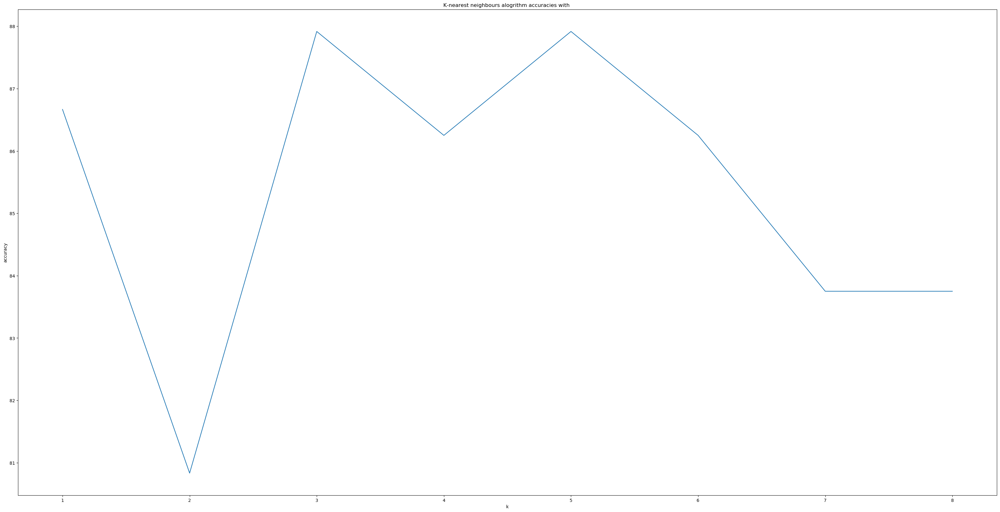

K-nearest neighbours algorithm accuracy: 87.91666666666667
0.8
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   1.9s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   2.5s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   1.8s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   2.4s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   1.7s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   2.4s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'cri

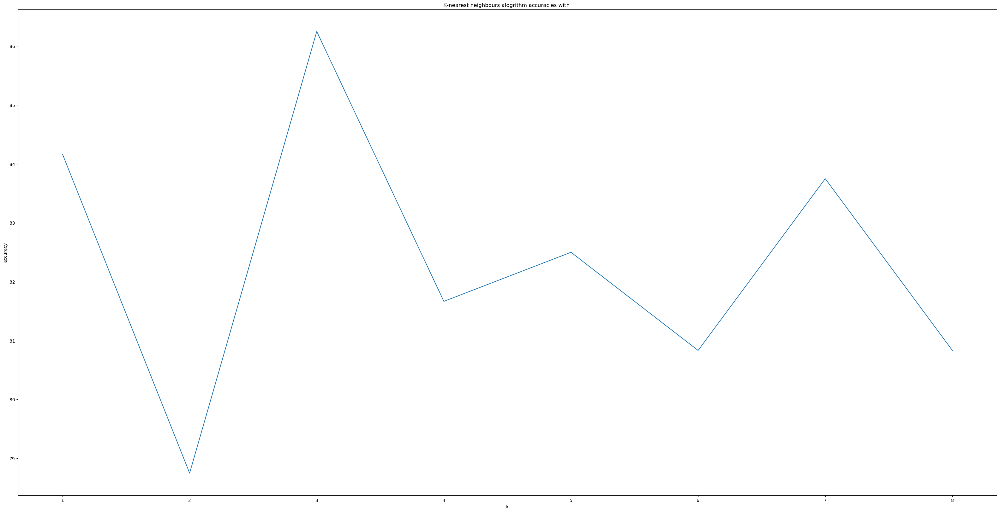

K-nearest neighbours algorithm accuracy: 86.25
0.7
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   1.6s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   2.1s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   1.4s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   2.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   1.4s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   2.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'criterion': ['e

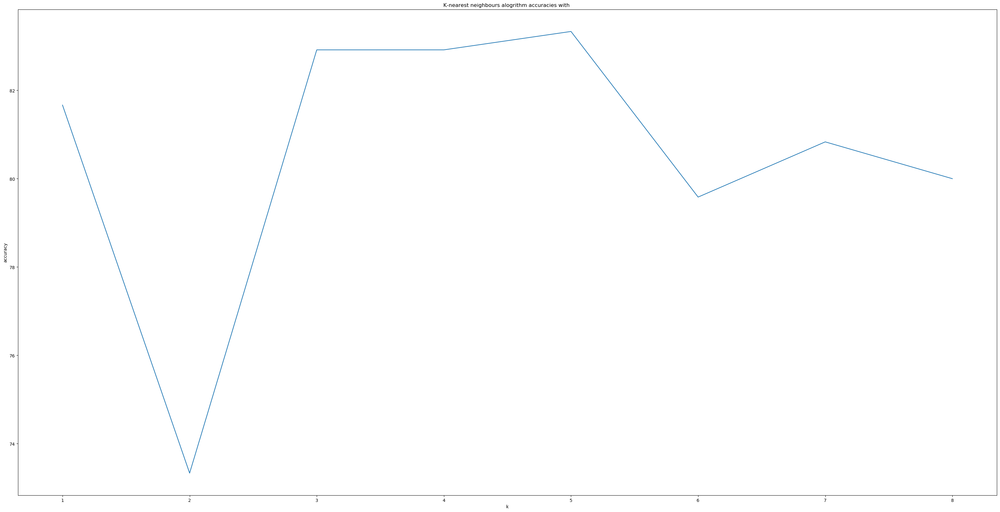

K-nearest neighbours algorithm accuracy: 83.33333333333334
0.6
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   1.2s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   1.7s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   1.2s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   1.7s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   1.2s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   1.7s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'cri

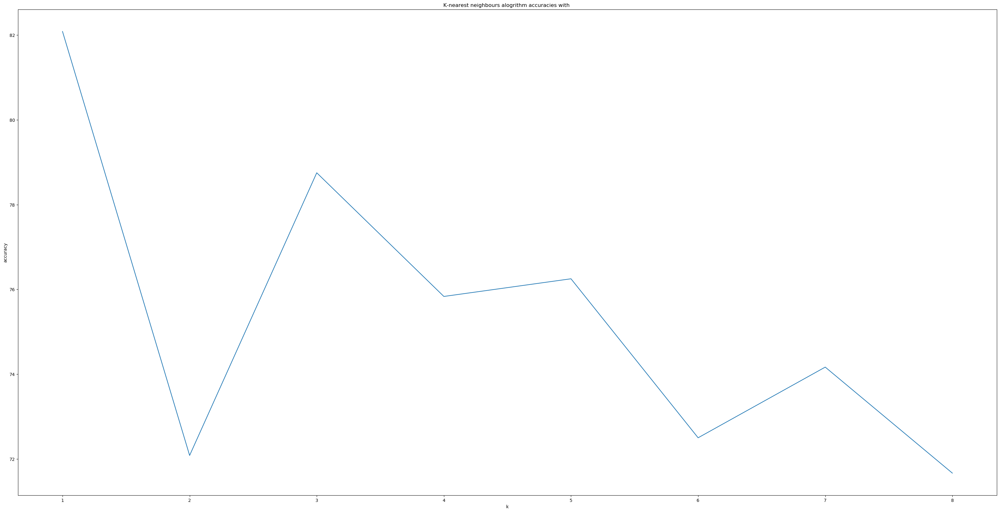

K-nearest neighbours algorithm accuracy: 82.08333333333333
0.5
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   1.3s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   1.3s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   1.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   1.3s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'cri

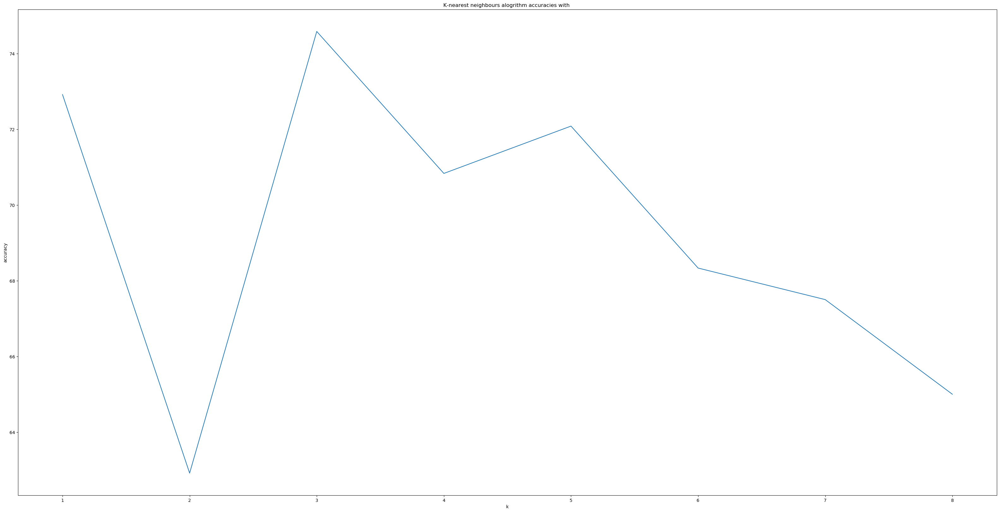

K-nearest neighbours algorithm accuracy: 74.58333333333333
0.4
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.7s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   1.0s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   0.7s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   1.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.7s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   1.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'cri

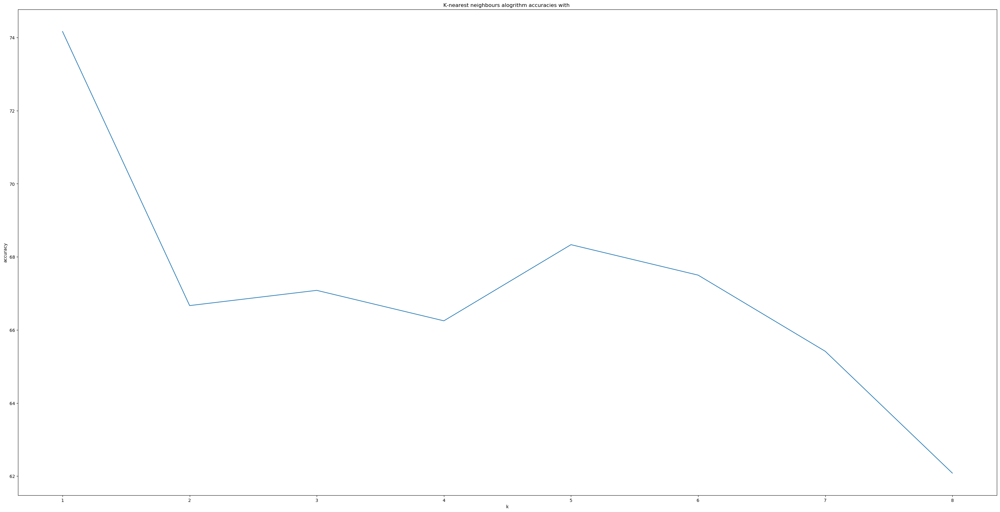

K-nearest neighbours algorithm accuracy: 74.16666666666667
0.3
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.5s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   0.7s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   0.5s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   0.7s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.5s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   0.7s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'cri

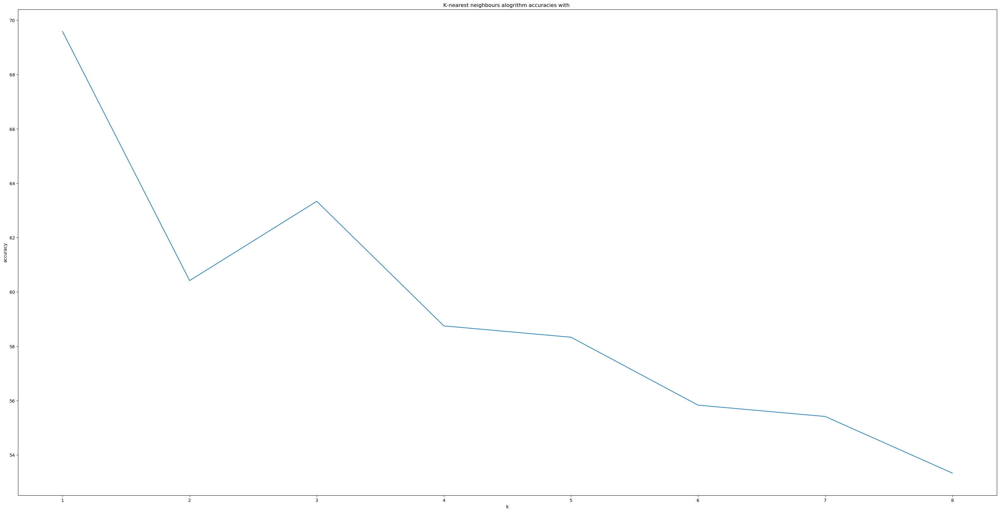

K-nearest neighbours algorithm accuracy: 69.58333333333333
0.2
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.4s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   0.5s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   0.3s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   0.5s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.4s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   0.5s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'cri

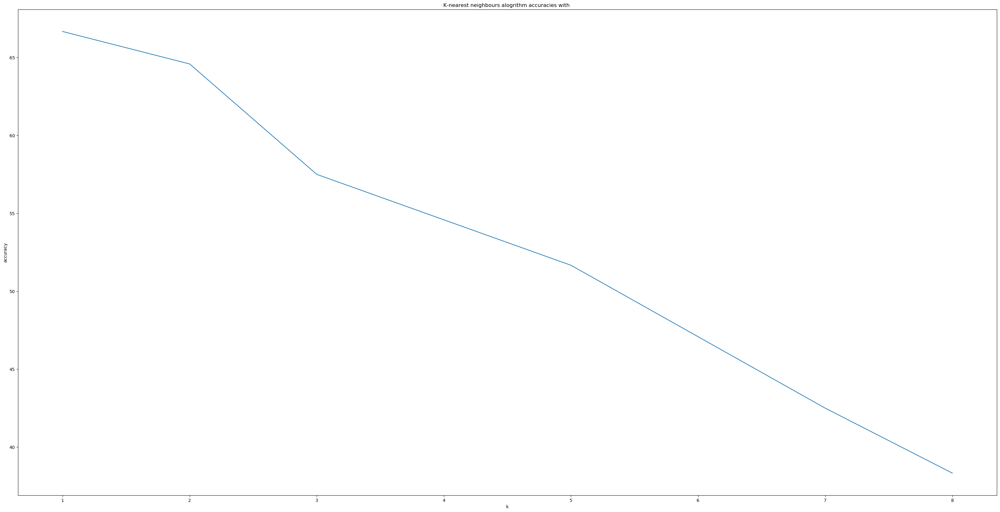

K-nearest neighbours algorithm accuracy: 66.66666666666666
0.1
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.2s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   0.2s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   0.2s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   0.2s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.2s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   0.2s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'cri

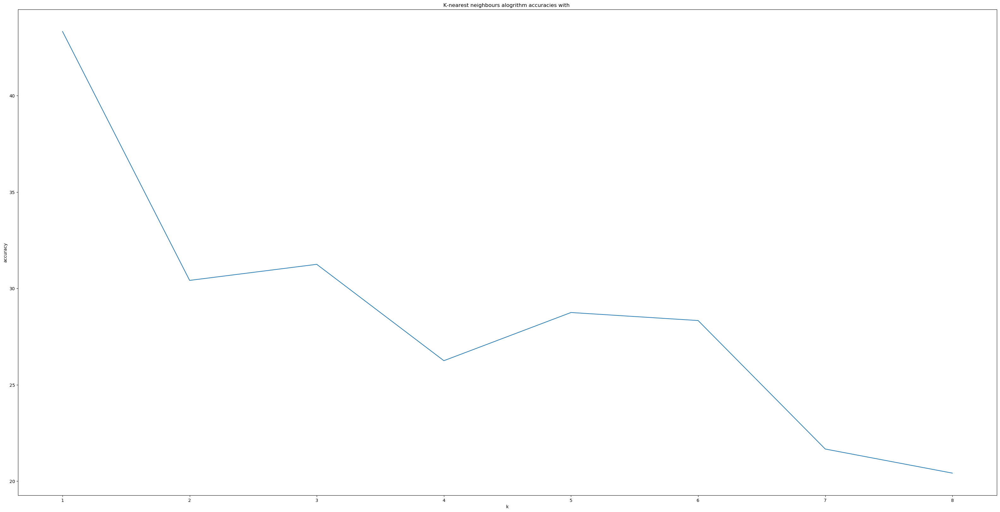

K-nearest neighbours algorithm accuracy: 43.333333333333336
0.05
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'c

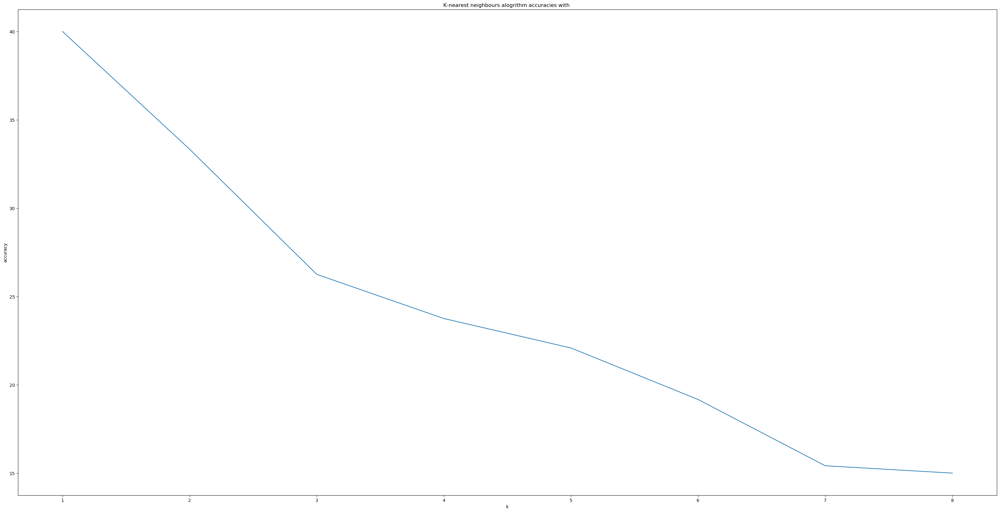

K-nearest neighbours algorithm accuracy: 40.0
0.03
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'criterion': ['e

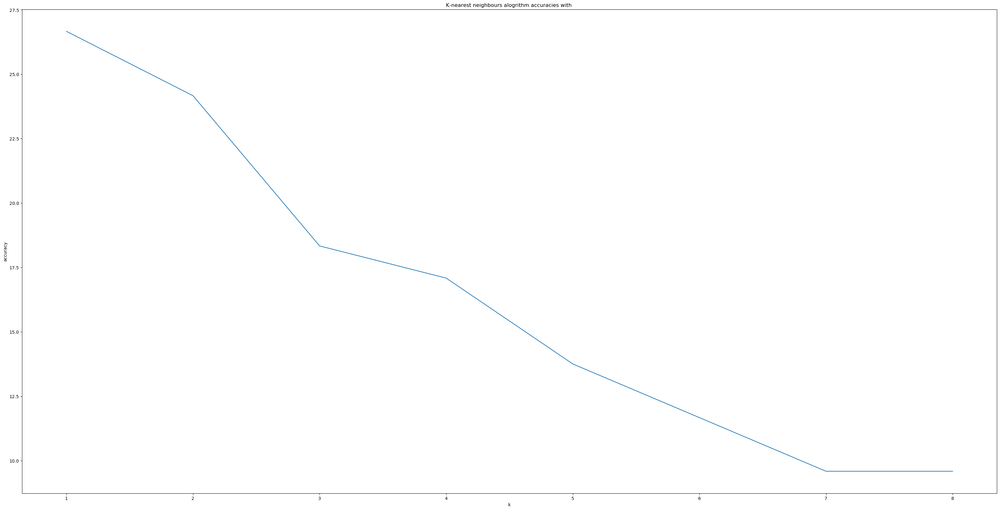

K-nearest neighbours algorithm accuracy: 26.666666666666668
0.01
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, max_features=10; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'c

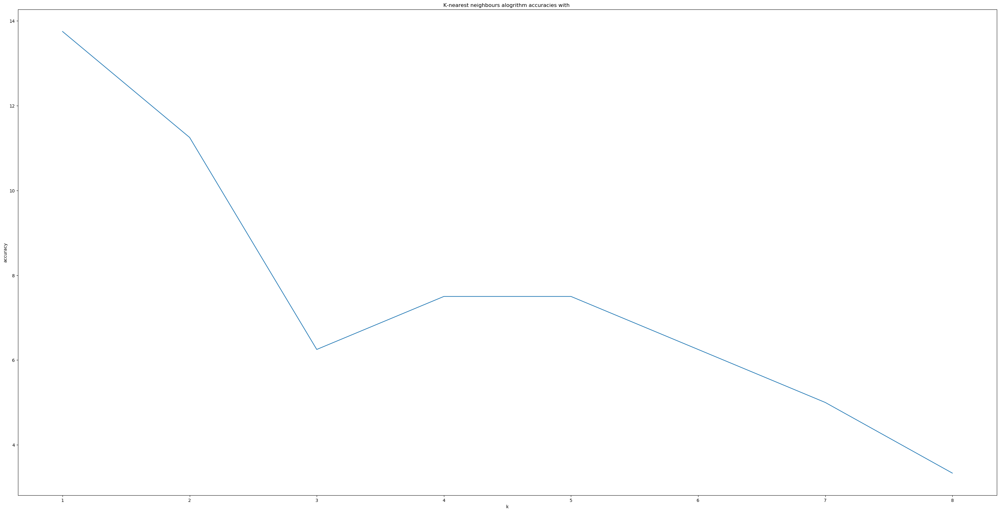

K-nearest neighbours algorithm accuracy: 13.750000000000002


In [182]:
partitions = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4,0.3, 0.2, 0.1, 0.05, 0.03,0.01]
prediction_accs = []
pred_room_axxs = []
tx = alpha_filtered2_train.copy()
x = len(alpha_filtered2_train)

for labeled_percentage in partitions:
    print(labeled_percentage)
    partial_df, partial_locations, partial_df_rest, partial_rest_loc = prep_data_for_synthesis2(tx, labeled_percentage,x)
    tx = partial_df.copy()
    tx['location'] = partial_locations
    latent_data = encoder.predict(min_max_scaler.fit_transform(partial_df))
    latent_data = np.concatenate((latent_data[0], latent_data[2]), axis=1)
    latent_test_data = encoder.predict(min_max_scaler.fit_transform(partial_df_rest))
    latent_test_data = np.concatenate((latent_test_data[0], latent_test_data[2]), axis=1)
    
    rfc_semi2 = RandomForestClassifier()
    forest_semi_params = [{'criterion': ["entropy"], 'max_depth':[10,12,15], 'max_features': [10,15,20]}]
    semi_clf2 = GridSearchCV(rfc_semi2, forest_semi_params,cv = [(slice(None), slice(None))], scoring='accuracy',refit=True,verbose=2)
    print(semi_clf2.fit(latent_data, partial_locations))
    unlabeled_data_labels = semi_clf2.predict(latent_test_data)
#     rfc_semi2 = RandomForestClassifier(criterion='entropy', max_depth=11, max_features=5)
#     print(rfc_semi2.fit(latent_data, partial_locations))
#     unlabeled_data_labels = rfc_semi2.predict(latent_test_data)
       
    frames = [partial_df, partial_df_rest]
    partial_combined = pd.concat(frames)
    
    frames = [partial_locations, pd.DataFrame(unlabeled_data_labels, columns = ['location'])]
    partial_combined_labels = pd.concat(frames)
    k_nearest_neighbours(partial_combined, partial_combined_labels, alpha_filtered2_test.loc[:, no_channel_training_cols],alpha_filtered2_test.loc[:, 'location'], "")
    if(labeled_percentage<0.5):
        k=1
    else:
        k = 5
    partial_preds,runtime = run_knn(partial_combined, partial_combined_labels, alpha_filtered2_test.loc[:, no_channel_training_cols],[],k)
    
#     rfc_semi_part = RandomForestClassifier()
#     forest_semi_params = [{'criterion': ["entropy"], 'max_depth':[10,12,15,20], 'max_features': [4,5,8]}]
#     semi_clf = GridSearchCV(rfc_semi_part, forest_semi_params, cv = 3, scoring='accuracy',refit=True,verbose=2)
#     print(semi_clf.fit(partial_combined, partial_combined_labels))

#     partial_preds = semi_clf.predict(alpha_filtered2_test.loc[:, no_channel_training_cols])
    prediction_accs.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], partial_preds)*100)
    
    room_lev_atarget = []
    for i in alpha_filtered2_test.loc[:, ['location']].to_numpy():
        room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
        
    room_lev_test_semi = []
    for i in partial_preds:
        room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
    
    pred_room_axxs.append(accuracy_score(room_lev_atarget, room_lev_test_semi)*100)
       


In [183]:
def plot_accs(original_accs, vae_accs, title):
    t = list(original_accs.keys())
    k = list(original_accs.values())
    k.reverse()

    f = vae_accs
    f.reverse()
    print(k)
    print(f)
    signals = [{'name': 'original_accuracies', 'x': t,
             'y': k, 'color':'orange', 'linewidth':6},
            {'name': 'Semi-supervised_accuracies', 'x': t,
             'y': f, 'color':'green', 'linewidth':6}]

    fig, ax = plt.subplots()
    for signal in signals:
        ax.plot(signal['x'], signal['y'], 
                color=signal['color'], 
                linewidth=signal['linewidth'],
                label=signal['name'])
    plt.rcParams['figure.figsize'] = [40, 20]
    ax.legend()
    ax.set_title(title)
    plt.show()

In [184]:
def plot_accs2(original_accs, vae_accs, title):
    t = list(original_accs.keys())
    k = list(original_accs.values())

    f = vae_accs
    print(k)
    print(f)
    signals = [{'name': 'original_accuracies', 'x': t,
             'y': k, 'color':'orange', 'linewidth':6},
            {'name': 'Semi-supervised_accuracies', 'x': t,
             'y': f, 'color':'green', 'linewidth':6}]

    fig, ax = plt.subplots()
    for signal in signals:
        ax.plot(signal['x'], signal['y'], 
                color=signal['color'], 
                linewidth=signal['linewidth'],
                label=signal['name'])
    plt.rcParams['figure.figsize'] = [40, 20]
    ax.legend()
    ax.set_title(title)
    plt.show()

[88.75, 84.58333333333333, 81.66666666666667, 78.75, 72.91666666666666, 69.58333333333333, 60.0, 49.166666666666664, 26.25, 14.583333333333334, 9.583333333333334, 1.25]
[87.91666666666667, 82.5, 83.33333333333334, 76.25, 72.08333333333333, 74.16666666666667, 69.58333333333333, 66.66666666666666, 43.333333333333336, 40.0, 26.666666666666668, 13.750000000000002]


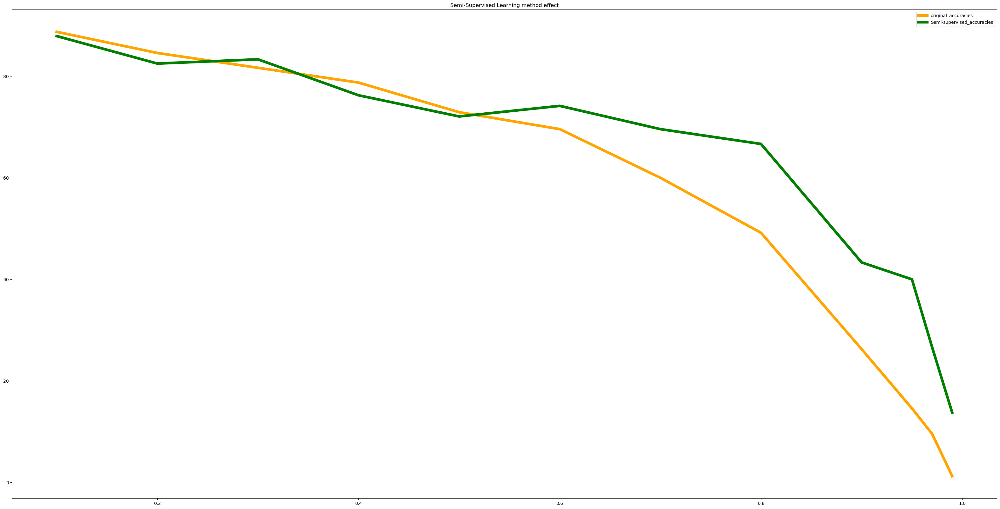

In [185]:
original_accs23 =  dict(zip(percs_rev, list(original_accs2.values())))
plot_accs2(original_accs23, prediction_accs,"Semi-Supervised Learning method effect")

[26.25, 14.583333333333334, 9.583333333333334, 1.25]
[43.333333333333336, 40.0, 26.666666666666668, 13.750000000000002]


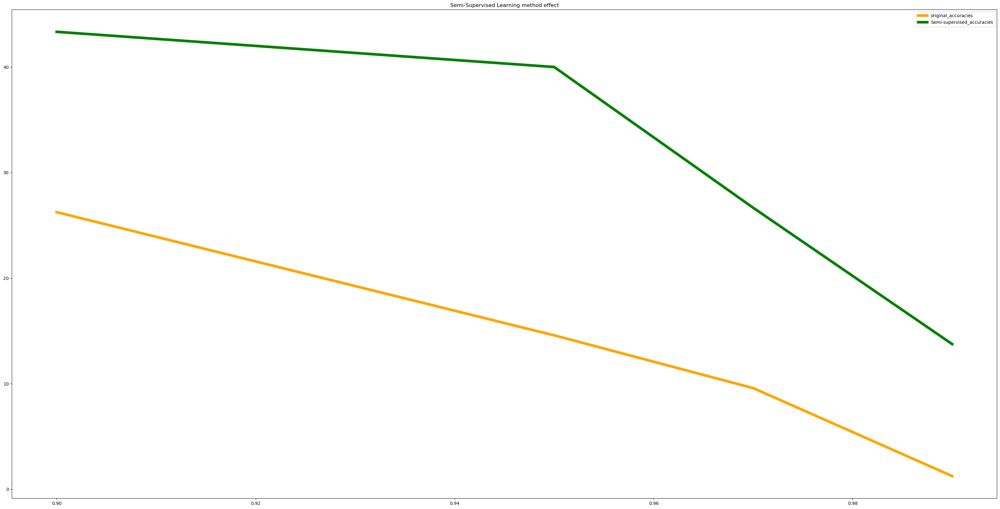

In [186]:
original_accs23 =  dict(zip(percs_rev[-4:], list(original_accs2.values())[-4:]))
plot_accs2(original_accs23, prediction_accs[-4:],"Semi-Supervised Learning method effect")

[99.58333333333333, 98.75, 99.16666666666667, 98.33333333333333, 98.33333333333333, 98.33333333333333, 95.41666666666667, 95.41666666666667, 77.5, 66.25, 65.41666666666667, 19.166666666666668]
[100.0, 98.33333333333333, 98.75, 99.16666666666667, 96.66666666666667, 97.91666666666666, 97.08333333333333, 91.25, 88.75, 77.08333333333334, 71.66666666666667, 55.833333333333336]


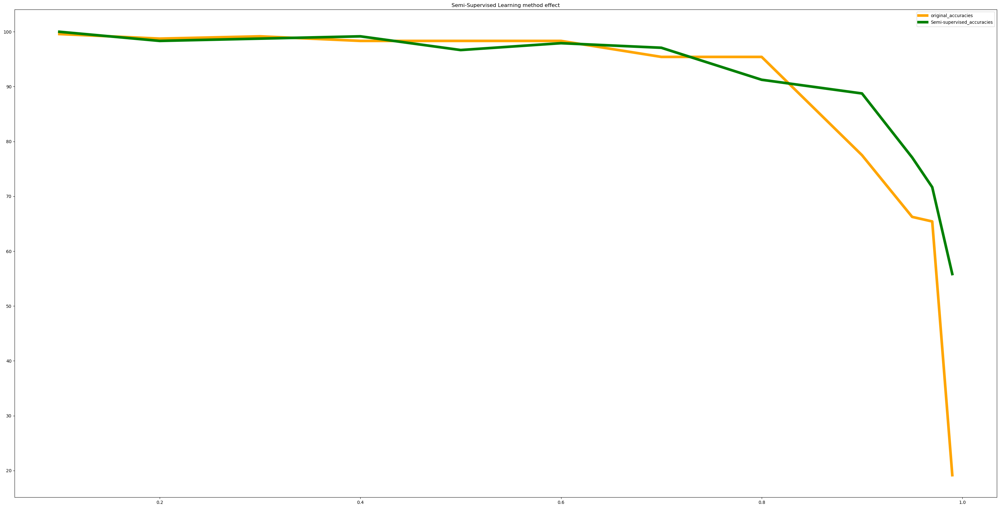

In [187]:
r_accs23 =  dict(zip(percs_rev, list(r_accs2.values())))
plot_accs2(r_accs23, pred_room_axxs,"Semi-Supervised Learning method effect")

[77.5, 66.25, 65.41666666666667, 19.166666666666668]
[88.75, 77.08333333333334, 71.66666666666667, 55.833333333333336]


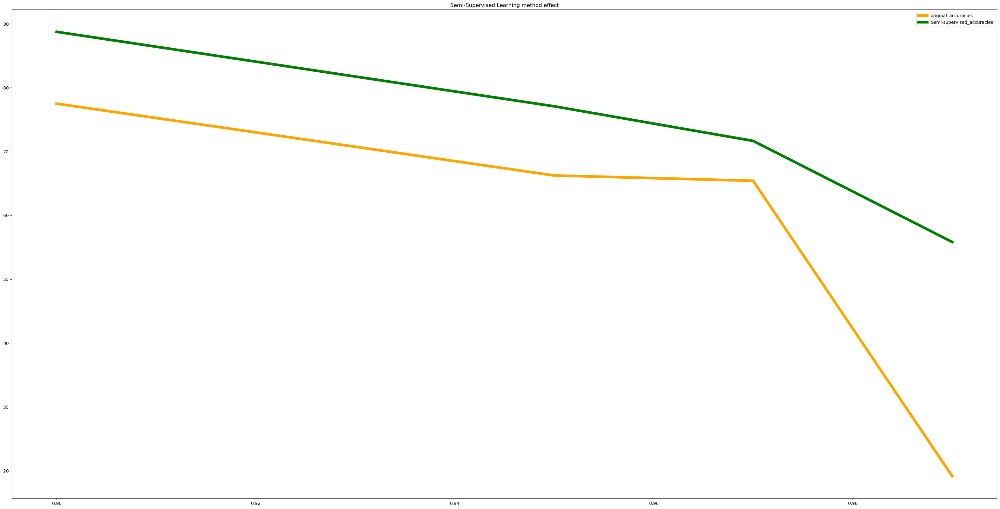

In [188]:
r_accs23 =  dict(zip(percs_rev[-4:], list(r_accs2.values())[-4:]))
plot_accs2(r_accs23, pred_room_axxs[-4:],"Semi-Supervised Learning method effect")

## Using Synthesized Data

In [189]:
one_ten_df, one_ten_locations, one_ten_df_test, one_ten__test_loc = prep_data_for_synthesis(alpha_filtered2_train, 0.2)


In [190]:
data_shape = (20,)
latent_dim = 8
input_layer = keras.Input(shape=data_shape)
x = keras.layers.Dense(18, activation ='relu')(input_layer)
x = keras.layers.Dense(15, activation ='relu')(x)
x = keras.layers.Dense(10, activation ='relu')(x)
means = keras.layers.Dense(latent_dim)(x)
log_var = keras.layers.Dense(latent_dim)(x)

z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

encoder = keras.models.Model(input_layer, [means, log_var, z])
    
decoder_input = keras.layers.Input(shape =(latent_dim,))
x = keras.layers.Dense(10, activation ='relu')(decoder_input)
x = keras.layers.Dense(15, activation ='relu')(x)
x = keras.layers.Dense(18, activation ='relu')(x)
outputs = keras.layers.Dense(20, activation ='sigmoid')(x)
decoder = keras.models.Model(decoder_input, outputs)
x_prime = decoder(z)
outputs = decoder(encoder(input_layer)[2])
vae = keras.models.Model(input_layer, outputs, name='vae')    
vae.compile(loss=my_loss,optimizer="adam",metrics=["accuracy"])
print(vae.summary())



Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        (None, 20)                0         
_________________________________________________________________
model_11 (Model)             [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_12 (Model)             (None, 20)                923       
Total params: 1,922
Trainable params: 1,922
Non-trainable params: 0
_________________________________________________________________
None


In [191]:
his2 = vae.fit(min_max_scaler.fit_transform(one_ten_df), min_max_scaler.fit_transform(one_ten_df) , epochs = 100, batch_size = 32, validation_split= 0.2)


Train on 153 samples, validate on 39 samples
Epoch 1/100
153/153 [==============================] - 2s 12ms/step - loss: 14.0442 - accuracy: 0.1895 - val_loss: 13.9507 - val_accuracy: 0.0000e+00
Epoch 2/100
153/153 [==============================] - 0s 191us/step - loss: 13.8716 - accuracy: 0.1830 - val_loss: 13.8680 - val_accuracy: 0.0000e+00
Epoch 3/100
153/153 [==============================] - 0s 225us/step - loss: 13.7606 - accuracy: 0.2157 - val_loss: 13.8063 - val_accuracy: 0.0256
Epoch 4/100
153/153 [==============================] - 0s 211us/step - loss: 13.6785 - accuracy: 0.2026 - val_loss: 13.7411 - val_accuracy: 0.0000e+00
Epoch 5/100
153/153 [==============================] - 0s 223us/step - loss: 13.5978 - accuracy: 0.1961 - val_loss: 13.6848 - val_accuracy: 0.0000e+00
Epoch 6/100
153/153 [==============================] - 0s 209us/step - loss: 13.5119 - accuracy: 0.2092 - val_loss: 13.6028 - val_accuracy: 0.0000e+00
Epoch 7/100
153/153 [==============================] -

Epoch 56/100
153/153 [==============================] - 0s 175us/step - loss: 4.0360 - accuracy: 0.3856 - val_loss: 6.4862 - val_accuracy: 0.6667
Epoch 57/100
153/153 [==============================] - 0s 177us/step - loss: 4.0266 - accuracy: 0.4314 - val_loss: 6.4925 - val_accuracy: 0.6410
Epoch 58/100
153/153 [==============================] - 0s 166us/step - loss: 4.0170 - accuracy: 0.3987 - val_loss: 6.4937 - val_accuracy: 0.6410
Epoch 59/100
153/153 [==============================] - 0s 172us/step - loss: 4.0546 - accuracy: 0.4575 - val_loss: 6.4471 - val_accuracy: 0.6410
Epoch 60/100
153/153 [==============================] - 0s 167us/step - loss: 4.0405 - accuracy: 0.4510 - val_loss: 6.4824 - val_accuracy: 0.6667
Epoch 61/100
153/153 [==============================] - 0s 163us/step - loss: 3.9536 - accuracy: 0.4183 - val_loss: 6.4710 - val_accuracy: 0.6667
Epoch 62/100
153/153 [==============================] - 0s 174us/step - loss: 3.9674 - accuracy: 0.4967 - val_loss: 6.4888 -

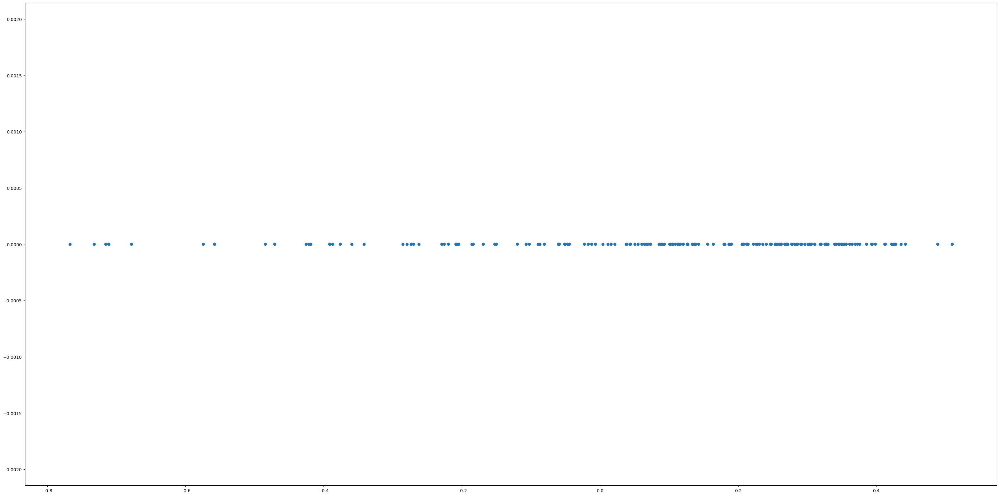

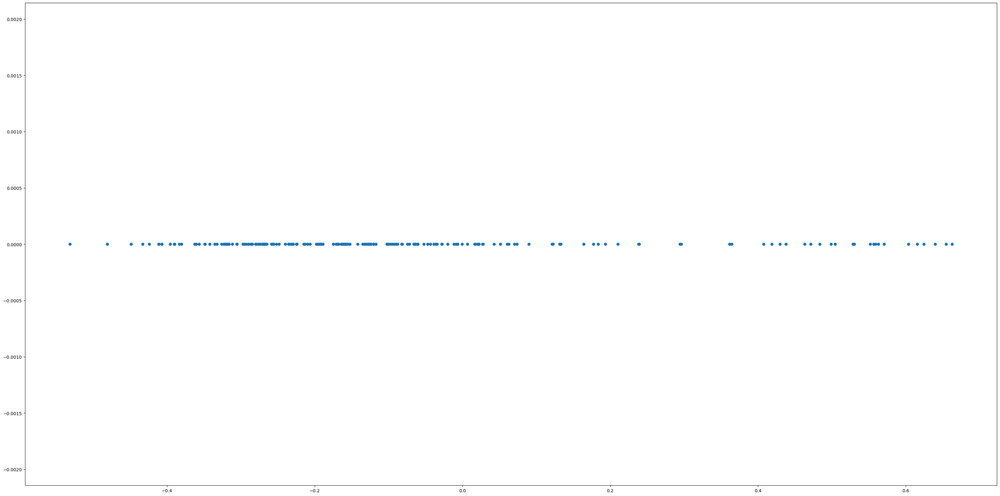

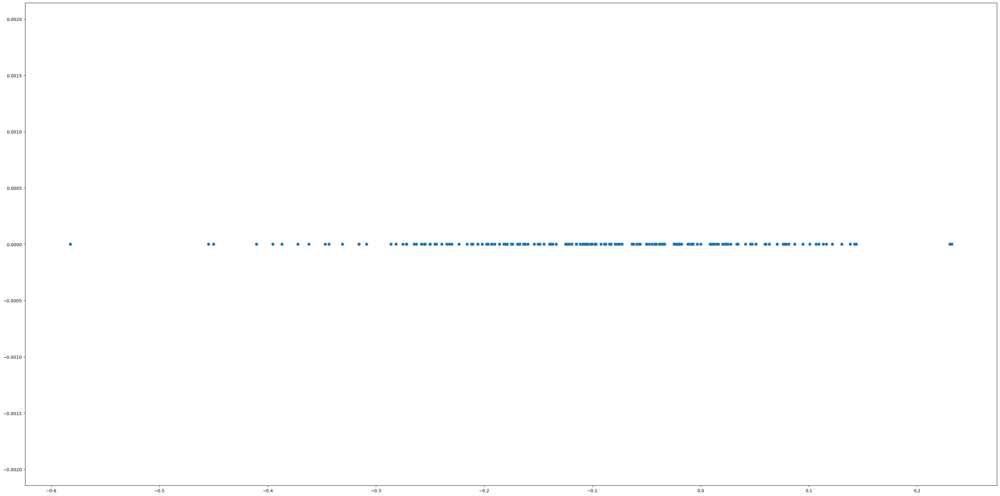

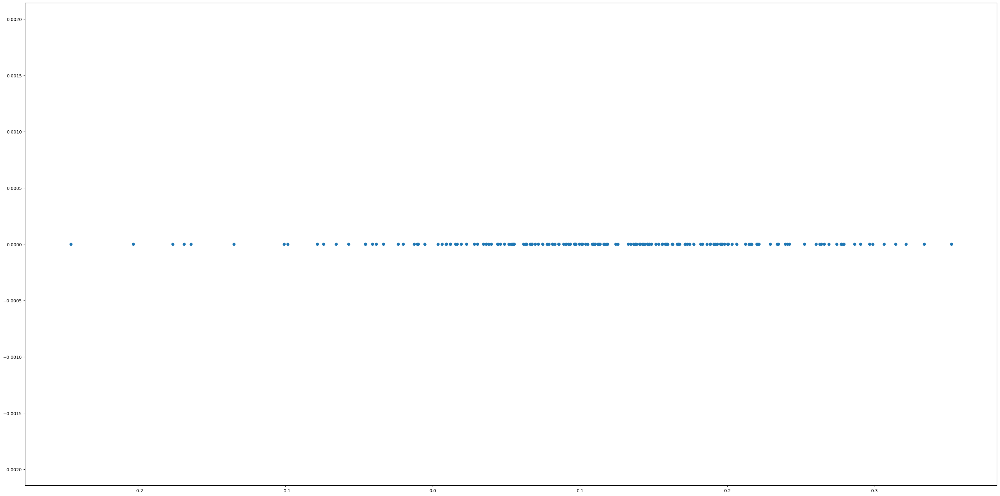

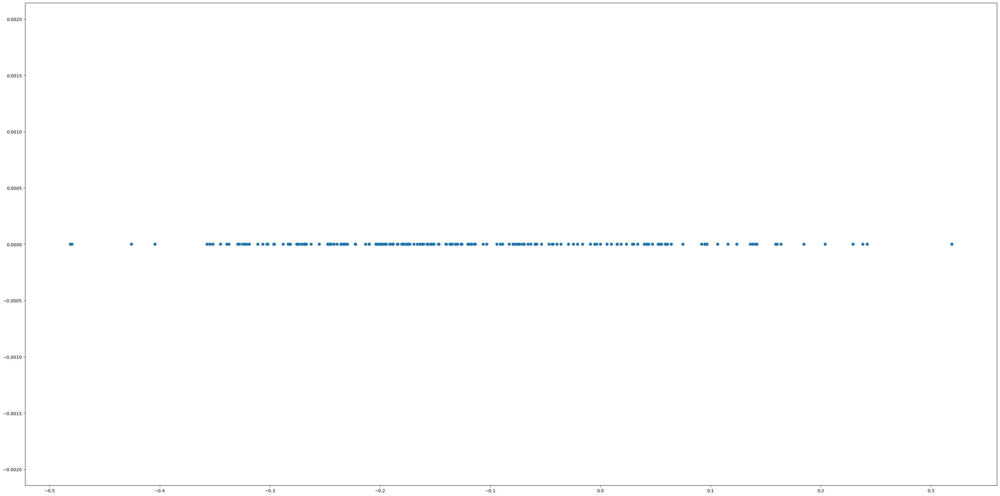

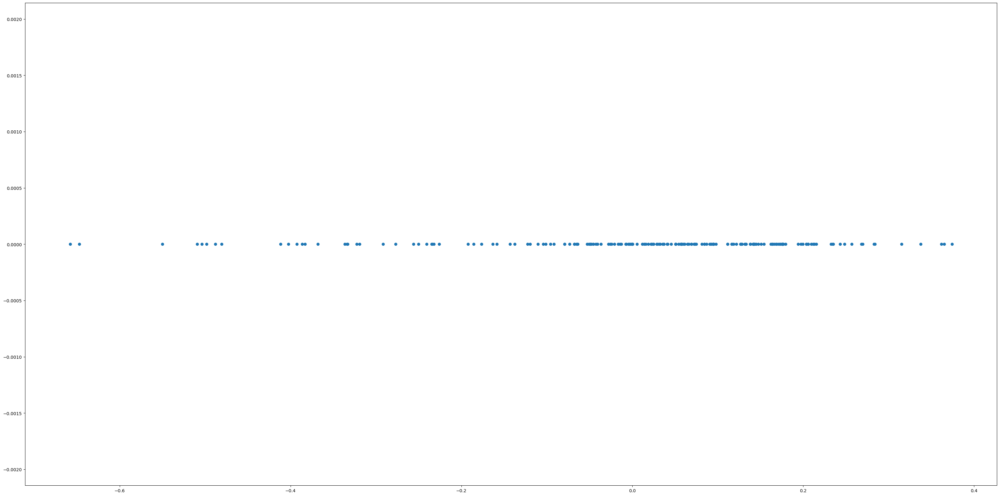

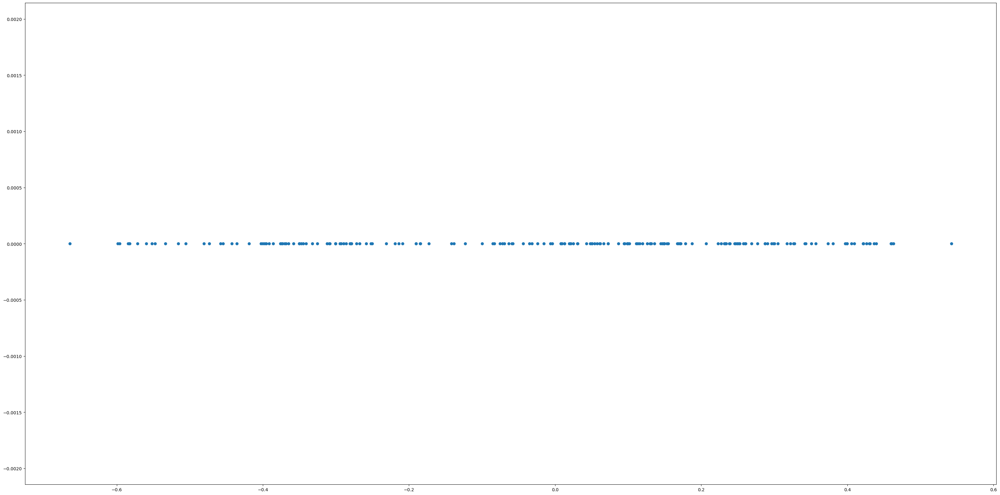

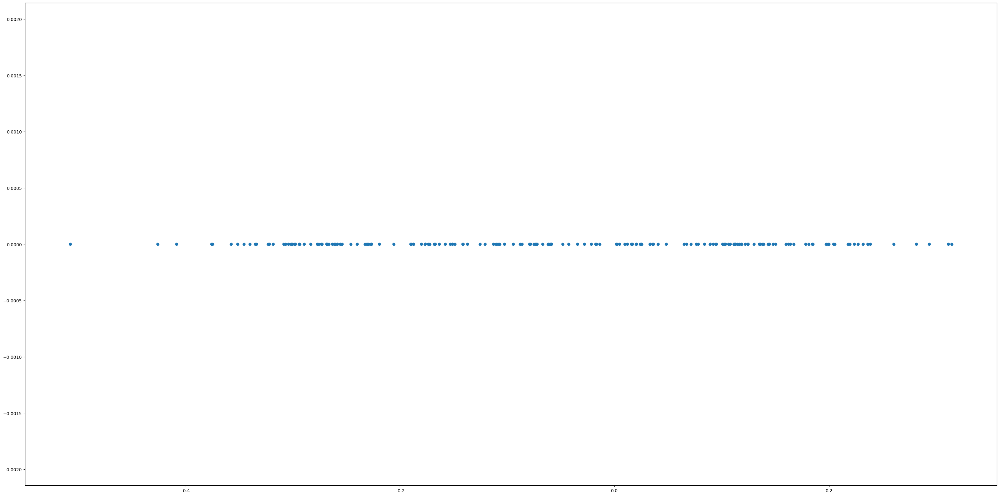

In [192]:
t = encoder.predict(min_max_scaler.fit_transform(one_ten_df))[2]
for i in range(8):
    fig, ax = plt.subplots()
    plt.scatter(t[:,i],np.zeros_like(t[:,i]))
    plt.show()

In [193]:
outs = encoder.predict(min_max_scaler.fit_transform(one_ten_df))
print(np.min(outs[2],axis=0))
print(np.max(outs[2],axis=0))


[-0.8481776  -0.51202464 -0.6071461  -0.1580824  -0.43832013 -0.66874313
 -0.5899096  -0.505869  ]
[0.58281636 0.64557153 0.26701033 0.3905011  0.23965581 0.40604228
 0.51802707 0.43807983]


### Data Generation

In [194]:
def generate_data(count):
    ax = []
    mins = np.min(outs[2],axis=0)
    maxs = np.max(outs[2],axis=0)
    for i in range(count):
        t = []
        for j in range(8):
            center = (mins[j] +maxs[j])/2
            t.append(np.random.normal(center, (maxs[j]-center)/1.2))
        ax.append(np.array(t))
    for i in ax:
        i = i[:, np.newaxis]
    ax =  np.array(ax)   

    new_records = decoder.predict(ax)
    new_records = new_records.reshape(count, 20)
    return new_records

In [195]:
new = generate_data(700)

In [196]:
generated_df = pd.DataFrame(new, columns = no_channel_training_cols)

In [197]:
generated_df

,beacon1,beacon2,beacon3,beacon4,beacon5,beacon6,beacon7,beacon8,beacon9,beacon10,beacon11,beacon12,beacon13,beacon14,beacon15,beacon16,beacon17,beacon18,beacon19,beacon20
0,0.943471,0.006303,0.997002,0.996667,0.986535,0.989208,0.988887,0.993834,0.980522,0.981893,0.247057,0.212062,0.211453,0.064743,0.012617,0.009933,0.008186,0.011229,2.629933e-02,0.229925
1,0.737177,0.145928,0.911838,0.905449,0.834342,0.846999,0.845269,0.881550,0.801739,0.796539,0.480389,0.458274,0.421760,0.324212,0.184875,0.192515,0.170406,0.185821,2.273828e-01,0.444646
2,0.788446,0.863141,0.788644,0.049178,0.000622,0.000655,0.000709,0.001228,0.001105,0.349465,0.000007,0.000002,0.000008,0.000023,0.000037,0.000063,0.000043,0.000011,1.370907e-06,0.000005
3,0.909610,0.089780,0.969300,0.872666,0.482859,0.442580,0.533127,0.575238,0.552863,0.924503,0.003207,0.002248,0.005124,0.002468,0.000960,0.001019,0.000920,0.000751,5.654097e-04,0.003545
4,0.815923,0.083844,0.953428,0.934567,0.852611,0.852613,0.859931,0.892595,0.845265,0.874277,0.208573,0.189360,0.203501,0.111876,0.055648,0.050879,0.042337,0.049894,6.586987e-02,0.190233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
695,0.738243,0.396734,0.801654,0.539935,0.229637,0.236720,0.273660,0.288937,0.269671,0.701125,0.028270,0.021438,0.032285,0.032285,0.020635,0.026037,0.024846,0.018049,1.117241e-02,0.030006
696,0.720535,0.152400,0.923256,0.921100,0.849157,0.899592,0.875634,0.898718,0.804315,0.827521,0.663243,0.673852,0.512782,0.533083,0.256137,0.297145,0.309947,0.310071,3.298515e-01,0.644436
697,0.643027,0.330519,0.754863,0.662440,0.531073,0.554560,0.559954,0.570488,0.570519,0.679245,0.273729,0.264211,0.250452,0.244125,0.189446,0.198459,0.191253,0.185567,1.610759e-01,0.269730
698,0.898748,0.016218,0.994760,0.995466,0.984961,0.990155,0.986930,0.992363,0.970095,0.968171,0.658530,0.644278,0.445293,0.323421,0.049568,0.063391,0.064131,0.075163,1.171432e-01,0.594914


## Random Forest with Synthesized Data

### Labeling Model Definition

In [198]:
rfc_syn = RandomForestClassifier()
forest_syn_params = [{'criterion': ["entropy"], 'max_depth':[8,10,12,15], 'max_features': [8,10,15,20]}]
clf2 = GridSearchCV(rfc_syn, forest_syn_params, cv = 3, scoring='accuracy',refit=True,verbose=2)
print(clf2.fit(min_max_scaler.fit_transform(one_ten_df), one_ten_locations))

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] END .....criterion=entropy, max_depth=8, max_features=8; total time=   0.2s
[CV] END .....criterion=entropy, max_depth=8, max_features=8; total time=   0.2s
[CV] END .....criterion=entropy, max_depth=8, max_features=8; total time=   0.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   0.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   0.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   0.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   0.3s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   0.3s
[CV] END ....criterion=entropy, max_depth=8, max

In [199]:
clf2.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=8, max_features=10)

In [200]:
syn_rforest_predictions = clf2.predict(generated_df)

### Testing the generated plus ground data

In [201]:
one_ten_df

,beacon1,beacon2,beacon3,beacon4,beacon5,beacon6,beacon7,beacon8,beacon9,beacon10,beacon11,beacon12,beacon13,beacon14,beacon15,beacon16,beacon17,beacon18,beacon19,beacon20
0,-107.134454,-83.647059,-172.931671,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-99.220588,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
5,-94.600000,-84.000000,-245.333333,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-97.400000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
10,-95.285714,-83.714286,-222.761905,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-97.914286,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
15,-95.020337,-83.666667,-168.991023,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-99.152778,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
20,-95.894643,-84.520000,-171.435235,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-99.070000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000,-300.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,-93.190101,-89.794173,-112.379754,-145.408775,-200.162984,-211.666093,-201.391330,-185.997138,-188.566476,-93.637146,-275.911939,-274.503236,-272.354211,-272.830298,-289.417250,-287.715368,-290.431301,-288.386076,-282.451447,-270.843446
940,-93.189943,-89.794012,-112.379611,-145.408657,-200.162908,-211.666025,-201.391255,-185.997051,-188.566390,-93.636988,-275.911920,-274.503217,-272.354190,-272.680096,-289.249927,-287.541666,-290.261344,-288.215284,-282.284969,-270.843424
945,-93.188842,-89.792894,-112.378612,-145.407834,-200.162377,-211.665555,-201.390730,-185.996444,-188.565797,-93.635890,-275.911792,-274.503081,-272.354043,-271.762297,-288.069433,-286.322038,-289.075567,-286.977658,-281.151177,-270.843269
950,-93.186987,-89.791008,-112.376929,-145.406447,-200.161481,-211.664762,-201.389845,-185.995421,-188.564798,-93.634039,-275.911576,-274.502853,-272.353795,-269.961655,-286.048080,-284.236170,-287.030935,-284.942635,-279.243340,-270.843007


In [202]:
pd.DataFrame(min_max_scaler.fit_transform(one_ten_df), columns= no_channel_training_cols)

,beacon1,beacon2,beacon3,beacon4,beacon5,beacon6,beacon7,beacon8,beacon9,beacon10,beacon11,beacon12,beacon13,beacon14,beacon15,beacon16,beacon17,beacon18,beacon19,beacon20
0,0.000000,0.999668,0.543948,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.293707,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.815001,0.943489,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.508811,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.770415,0.988967,0.169577,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.448047,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.787671,0.996547,0.573554,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.301719,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.730822,0.860719,0.555190,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.311499,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,0.906674,0.021212,0.998869,0.999491,0.999966,0.999966,0.999966,0.999966,0.999966,0.953394,0.999966,0.999966,0.989379,0.810250,0.579641,0.612112,0.557458,0.597048,0.706028,0.999966
188,0.906684,0.021237,0.998871,0.999492,0.999967,0.999967,0.999967,0.999967,0.999967,0.953413,0.999967,0.999967,0.989379,0.814729,0.588805,0.620767,0.567360,0.605828,0.712725,0.999967
189,0.906756,0.021415,0.998878,0.999498,0.999972,0.999972,0.999972,0.999972,0.999972,0.953543,0.999972,0.999972,0.989385,0.842099,0.653464,0.681538,0.636442,0.669452,0.758341,0.999972
190,0.906877,0.021716,0.998891,0.999507,0.999981,0.999981,0.999981,0.999981,0.999981,0.953762,0.999981,0.999981,0.989394,0.895798,0.764178,0.785472,0.755559,0.774068,0.835099,0.999981


In [203]:
frames = [pd.DataFrame(min_max_scaler.fit_transform(one_ten_df), columns= no_channel_training_cols), generated_df]
train_combined = pd.concat(frames)

frames = [one_ten_locations, pd.DataFrame(syn_rforest_predictions, columns = ['location'])]
label_combined2 = pd.concat(frames)

rfc_syn_tester = RandomForestClassifier()
forest_syn_params = [{'criterion': ["entropy"], 'max_depth':[8,10,12], 'max_features': [10,15,20]}]
clf3 = GridSearchCV(rfc_syn_tester, forest_syn_params, cv = 3, scoring='accuracy',refit=True,verbose=2)
print(clf3.fit(train_combined , label_combined2))


Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   1.1s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.9s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.9s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   1.4s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   1.3s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   1.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   1.9s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   1.6s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   1.5s
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   1.0s
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=10, max_

In [204]:
clf3.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=10, max_features=10)

In [205]:
syn_rforest_predictions_clf = clf3.predict(pd.DataFrame(min_max_scaler.fit_transform(one_ten_df_test), columns= no_channel_training_cols))
accuracy_score(one_ten__test_loc, syn_rforest_predictions_clf)*100


31.94263363754889

### Room level accuracy

In [206]:
room_lev_atarget = []
for i in one_ten__test_loc.to_numpy():
    room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

In [207]:
room_lev_test_pred_rf = []
for i in syn_rforest_predictions_clf:
    room_lev_test_pred_rf.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
    
accuracy_score(room_lev_atarget, room_lev_test_pred_rf)*100

47.327249022164274

### Label Propagation 

In [208]:
nolabel = [-1 for _ in range(len(generated_df))]
nolabel = pd.DataFrame(nolabel, columns = ['location'])

In [209]:
semi_combined_labels = pd.concat([one_ten_locations, nolabel])
label_propagator = LabelPropagation()
label_propagator.fit(train_combined, semi_combined_labels)
all_labels = label_propagator.transduction_



In [210]:
rfc_semi_tester = RandomForestClassifier()
forest_syn_params = [{'criterion': ["entropy"], 'max_depth':[8,10,12], 'max_features': [10,15,20]}]
clf_sem = GridSearchCV(rfc_semi_tester, forest_syn_params, cv = 3, scoring='accuracy',refit=True,verbose=2)
print(clf_sem.fit(train_combined , all_labels))

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.9s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.8s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.8s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   1.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   1.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   1.2s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   1.6s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   1.5s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   1.5s
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.9s
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   0.8s
[CV] END ...criterion=entropy, max_depth=10, max_

In [211]:
clf_sem.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=8, max_features=10)

In [212]:
syn_semi_predictions_clf = clf_sem.predict(pd.DataFrame(min_max_scaler.fit_transform(one_ten_df_test), columns= no_channel_training_cols))
accuracy_score(one_ten__test_loc, syn_semi_predictions_clf)*100

40.28683181225554

In [213]:
room_lev_test_semi = []
for i in syn_semi_predictions_clf:
    room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
    
accuracy_score(room_lev_atarget, room_lev_test_semi)*100

70.14341590612777

## Accuracies with real Data

In [214]:
without_syn_predictions = clf2.predict(pd.DataFrame(min_max_scaler.fit_transform(one_ten_df_test), columns= no_channel_training_cols))
accuracy_score(one_ten__test_loc, without_syn_predictions)*100

45.11082138200782

In [215]:
room_lev_test_without_pred_rf = []
for i in without_syn_predictions:
    room_lev_test_without_pred_rf.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())
    
accuracy_score(room_lev_atarget, room_lev_test_without_pred_rf)*100

74.1851368970013

### Experiments

In [216]:
def generate_new_data(count, outs):
    ax = []
    mins = np.min(outs[2],axis=0)
    maxs = np.max(outs[2],axis=0)
    for i in range(count):
        t = []
        for j in range(8):
            center = (mins[j] +maxs[j])/2
            t.append(np.random.normal(center, (maxs[j]-center)/1.2))
        ax.append(np.array(t))
    for i in ax:
        i = i[:, np.newaxis]
    ax =  np.array(ax)   

    new_records = decoder.predict(ax)
    new_records = new_records.reshape(count, 20)
    return new_records

In [217]:
parts_rev = [0.1,0.2, 0.3,0.4, 0.5, 0.7, 0.9]
parts = [0.9,0.8, 0.7,0.6, 0.5, 0.3, 0.1]

### RFC with Generated Data

In [219]:
method_accs = []
org_comp_accs = []
method_accs_room = []
org_comp_accs_room = []

tx = alpha_filtered2_train.copy()

        
for par in parts:
    print(par)
    data_shape = (20,)
    latent_dim = 8
    input_layer = keras.Input(shape=data_shape)
    x = keras.layers.Dense(18, activation ='relu')(input_layer)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(10, activation ='relu')(x)
    means = keras.layers.Dense(latent_dim)(x)
    log_var = keras.layers.Dense(latent_dim)(x)

    z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

    encoder = keras.models.Model(input_layer, [means, log_var, z])

    decoder_input = keras.layers.Input(shape =(latent_dim,))
    x = keras.layers.Dense(10, activation ='relu')(decoder_input)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(18, activation ='relu')(x)
    outputs = keras.layers.Dense(20, activation ='sigmoid')(x)
    decoder = keras.models.Model(decoder_input, outputs)
    x_prime = decoder(z)
    outputs = decoder(encoder(input_layer)[2])
    vae = keras.models.Model(input_layer, outputs, name='vae')    
    vae.compile(loss=my_loss,optimizer="adam",metrics=["accuracy"])
    print(vae.summary())
    x = len(alpha_filtered2_train)
    par_df, par_locations, par_df_test, par_test_loc = prep_data_for_synthesis2(tx, par, x)
    tx = par_df.copy()
    tx['location'] = par_locations
    his3 = vae.fit(min_max_scaler.fit_transform(par_df), min_max_scaler.fit_transform(par_df) , epochs = 100, batch_size = 8, validation_split= 0.2)

    outps = encoder.predict(min_max_scaler.fit_transform(par_df))

    new = generate_new_data((1500-len(par_df)), outps)
    generated_dataframe = pd.DataFrame(new, columns = no_channel_training_cols)

    nolabels = [-1 for _ in range(len(generated_dataframe))]
    nolabels = pd.DataFrame(nolabels, columns = ['location'])
    frames = [pd.DataFrame(min_max_scaler.fit_transform(par_df), columns= no_channel_training_cols), generated_dataframe]
    train_combined = pd.concat(frames)

    semi_combined_lbs = pd.concat([par_locations, nolabels])
    label_propagator = LabelPropagation()
    label_propagator.fit(train_combined, semi_combined_lbs)
    all_labels = label_propagator.transduction_

  
    rfc_semi_tester = RandomForestClassifier()
    forest_syn_params = [{'criterion': ["entropy"], 'max_depth':[8,10,12], 'max_features': [10,15,20]}]
    clf_sem = GridSearchCV(rfc_semi_tester, forest_syn_params, cv = [(slice(None), slice(None))], scoring='accuracy',refit=True,verbose=2)
    print(clf_sem.fit(train_combined , all_labels))

    syn_semi_predictions_clf = clf_sem.predict(pd.DataFrame(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]), columns= no_channel_training_cols))

    method_accs.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], syn_semi_predictions_clf)*100)

    room_lev_atarget = []
    for i in alpha_filtered2_test.loc[:, ['location']].to_numpy():
        room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    room_lev_test_semi = []
    for i in syn_semi_predictions_clf:
        room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    method_accs_room.append(accuracy_score(room_lev_atarget, room_lev_test_semi)*100)


    rfc_syn = RandomForestClassifier()
    forest_syn_params = [{'criterion': ["entropy"], 'max_depth':[8,10,12,15], 'max_features': [8,10,15,20]}]
    clf2 = GridSearchCV(rfc_syn, forest_syn_params, cv = [(slice(None), slice(None))], scoring='accuracy',refit=True,verbose=2)
    print(clf2.fit(min_max_scaler.fit_transform(par_df), par_locations))

    without_syn_predictions = clf2.predict(pd.DataFrame(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]), columns= no_channel_training_cols))

   

    org_comp_accs.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], without_syn_predictions)*100)

    room_lev_test_without_pred_rf = []
    for i in without_syn_predictions:
        room_lev_test_without_pred_rf.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    org_comp_accs_room.append(accuracy_score(room_lev_atarget, room_lev_test_without_pred_rf)*100)


0.9
Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        (None, 20)                0         
_________________________________________________________________
model_15 (Model)             [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_16 (Model)             (None, 20)                923       
Total params: 1,922
Trainable params: 1,922
Non-trainable params: 0
_________________________________________________________________
None
Train on 690 samples, validate on 173 samples
Epoch 1/100
690/690 [==============================] - 2s 3ms/step - loss: 12.9596 - accuracy: 0.1362 - val_loss: 10.7208 - val_accuracy: 0.1908
Epoch 2/100
690/690 [==============================] - 0s 505us/step - loss: 8.3615 - accuracy: 0.2188 - val_loss: 7.3078 - val_accuracy: 0.2428
Epoch 3/100
690/690 [=========================

Epoch 52/100
690/690 [==============================] - 0s 644us/step - loss: 3.4055 - accuracy: 0.7565 - val_loss: 3.5572 - val_accuracy: 0.7630
Epoch 53/100
690/690 [==============================] - 0s 635us/step - loss: 3.3918 - accuracy: 0.7638 - val_loss: 3.5176 - val_accuracy: 0.7861
Epoch 54/100
690/690 [==============================] - 0s 607us/step - loss: 3.3791 - accuracy: 0.7609 - val_loss: 3.5082 - val_accuracy: 0.7919
Epoch 55/100
690/690 [==============================] - 0s 616us/step - loss: 3.3972 - accuracy: 0.7681 - val_loss: 3.5006 - val_accuracy: 0.7746
Epoch 56/100
690/690 [==============================] - 0s 520us/step - loss: 3.3822 - accuracy: 0.7768 - val_loss: 3.5145 - val_accuracy: 0.7572
Epoch 57/100
690/690 [==============================] - 0s 445us/step - loss: 3.4080 - accuracy: 0.7739 - val_loss: 3.5346 - val_accuracy: 0.7803
Epoch 58/100
690/690 [==============================] - 0s 585us/step - loss: 3.3921 - accuracy: 0.7739 - val_loss: 3.5091 -

[CV] END .....criterion=entropy, max_depth=8, max_features=8; total time=   0.8s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   1.0s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   1.4s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   1.8s
[CV] END ....criterion=entropy, max_depth=10, max_features=8; total time=   0.8s
[CV] END ...criterion=entropy, max_depth=10, max_features=10; total time=   1.1s
[CV] END ...criterion=entropy, max_depth=10, max_features=15; total time=   1.4s
[CV] END ...criterion=entropy, max_depth=10, max_features=20; total time=   1.9s
[CV] END ....criterion=entropy, max_depth=12, max_features=8; total time=   0.8s
[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   1.0s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   1.5s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   2.1s
[CV] END ....criterion=entro

613/613 [==============================] - 0s 591us/step - loss: 3.4330 - accuracy: 0.7553 - val_loss: 3.3439 - val_accuracy: 0.7078
Epoch 41/100
613/613 [==============================] - 0s 618us/step - loss: 3.4398 - accuracy: 0.7439 - val_loss: 3.3901 - val_accuracy: 0.7078
Epoch 42/100
613/613 [==============================] - 0s 633us/step - loss: 3.4314 - accuracy: 0.7537 - val_loss: 3.3584 - val_accuracy: 0.7662
Epoch 43/100
613/613 [==============================] - 0s 603us/step - loss: 3.4611 - accuracy: 0.7471 - val_loss: 3.3759 - val_accuracy: 0.7532
Epoch 44/100
613/613 [==============================] - 0s 620us/step - loss: 3.4677 - accuracy: 0.7439 - val_loss: 3.3764 - val_accuracy: 0.7403
Epoch 45/100
613/613 [==============================] - 0s 612us/step - loss: 3.4294 - accuracy: 0.7390 - val_loss: 3.3599 - val_accuracy: 0.6948
Epoch 46/100
613/613 [==============================] - 0s 511us/step - loss: 3.4527 - accuracy: 0.7357 - val_loss: 3.3369 - val_accuracy

613/613 [==============================] - 0s 530us/step - loss: 3.3645 - accuracy: 0.7210 - val_loss: 3.2976 - val_accuracy: 0.6883
Epoch 97/100
613/613 [==============================] - 0s 464us/step - loss: 3.4088 - accuracy: 0.7129 - val_loss: 3.3390 - val_accuracy: 0.7013
Epoch 98/100
613/613 [==============================] - 0s 546us/step - loss: 3.4048 - accuracy: 0.7064 - val_loss: 3.3039 - val_accuracy: 0.6948
Epoch 99/100
613/613 [==============================] - 0s 646us/step - loss: 3.3908 - accuracy: 0.7064 - val_loss: 3.3225 - val_accuracy: 0.6688
Epoch 100/100
613/613 [==============================] - 0s 655us/step - loss: 3.3964 - accuracy: 0.7178 - val_loss: 3.2862 - val_accuracy: 0.7013
Fitting 1 folds for each of 9 candidates, totalling 9 fits
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   2.6s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   3.8s
[CV] END ....criterion=entropy, max_depth=8, max_features=20;

Epoch 28/100
536/536 [==============================] - 0s 435us/step - loss: 3.5462 - accuracy: 0.7556 - val_loss: 3.1998 - val_accuracy: 0.7407
Epoch 29/100
536/536 [==============================] - 0s 419us/step - loss: 3.5344 - accuracy: 0.7705 - val_loss: 3.1903 - val_accuracy: 0.7185
Epoch 30/100
536/536 [==============================] - 0s 456us/step - loss: 3.5185 - accuracy: 0.7575 - val_loss: 3.2251 - val_accuracy: 0.7481
Epoch 31/100
536/536 [==============================] - 0s 443us/step - loss: 3.5386 - accuracy: 0.7649 - val_loss: 3.2123 - val_accuracy: 0.7407
Epoch 32/100
536/536 [==============================] - 0s 430us/step - loss: 3.5321 - accuracy: 0.7649 - val_loss: 3.1943 - val_accuracy: 0.7407
Epoch 33/100
536/536 [==============================] - 0s 428us/step - loss: 3.5085 - accuracy: 0.7612 - val_loss: 3.1705 - val_accuracy: 0.7556
Epoch 34/100
536/536 [==============================] - 0s 435us/step - loss: 3.5137 - accuracy: 0.7724 - val_loss: 3.1904 -

536/536 [==============================] - 0s 449us/step - loss: 3.4696 - accuracy: 0.7743 - val_loss: 3.1268 - val_accuracy: 0.7407
Epoch 85/100
536/536 [==============================] - 0s 469us/step - loss: 3.4434 - accuracy: 0.7649 - val_loss: 3.1401 - val_accuracy: 0.7481
Epoch 86/100
536/536 [==============================] - 0s 487us/step - loss: 3.4504 - accuracy: 0.7631 - val_loss: 3.1211 - val_accuracy: 0.7556
Epoch 87/100
536/536 [==============================] - 0s 447us/step - loss: 3.4555 - accuracy: 0.7705 - val_loss: 3.1746 - val_accuracy: 0.7481
Epoch 88/100
536/536 [==============================] - 0s 446us/step - loss: 3.4327 - accuracy: 0.7649 - val_loss: 3.1693 - val_accuracy: 0.7407
Epoch 89/100
536/536 [==============================] - 0s 459us/step - loss: 3.4486 - accuracy: 0.7668 - val_loss: 3.1482 - val_accuracy: 0.7481
Epoch 90/100
536/536 [==============================] - 0s 479us/step - loss: 3.4665 - accuracy: 0.7854 - val_loss: 3.1544 - val_accuracy

Epoch 16/100
460/460 [==============================] - 0s 440us/step - loss: 3.5444 - accuracy: 0.5978 - val_loss: 3.4089 - val_accuracy: 0.6087
Epoch 17/100
460/460 [==============================] - 0s 433us/step - loss: 3.5567 - accuracy: 0.6435 - val_loss: 3.4247 - val_accuracy: 0.6261
Epoch 18/100
460/460 [==============================] - 0s 448us/step - loss: 3.5587 - accuracy: 0.6174 - val_loss: 3.3921 - val_accuracy: 0.6174
Epoch 19/100
460/460 [==============================] - 0s 439us/step - loss: 3.5146 - accuracy: 0.6370 - val_loss: 3.3997 - val_accuracy: 0.5913
Epoch 20/100
460/460 [==============================] - 0s 417us/step - loss: 3.5210 - accuracy: 0.6326 - val_loss: 3.3674 - val_accuracy: 0.6087
Epoch 21/100
460/460 [==============================] - 0s 439us/step - loss: 3.5262 - accuracy: 0.6543 - val_loss: 3.4332 - val_accuracy: 0.6000
Epoch 22/100
460/460 [==============================] - 0s 521us/step - loss: 3.5194 - accuracy: 0.6174 - val_loss: 3.3642 -

460/460 [==============================] - 0s 475us/step - loss: 3.4222 - accuracy: 0.5891 - val_loss: 3.3060 - val_accuracy: 0.5826
Epoch 73/100
460/460 [==============================] - 0s 466us/step - loss: 3.4086 - accuracy: 0.5957 - val_loss: 3.2568 - val_accuracy: 0.5739
Epoch 74/100
460/460 [==============================] - 0s 469us/step - loss: 3.4102 - accuracy: 0.5891 - val_loss: 3.2924 - val_accuracy: 0.5826
Epoch 75/100
460/460 [==============================] - 0s 465us/step - loss: 3.4278 - accuracy: 0.5913 - val_loss: 3.2913 - val_accuracy: 0.5652
Epoch 76/100
460/460 [==============================] - 0s 470us/step - loss: 3.4103 - accuracy: 0.5891 - val_loss: 3.2601 - val_accuracy: 0.5913
Epoch 77/100
460/460 [==============================] - 0s 463us/step - loss: 3.4258 - accuracy: 0.6000 - val_loss: 3.2723 - val_accuracy: 0.5652
Epoch 78/100
460/460 [==============================] - 0s 463us/step - loss: 3.4314 - accuracy: 0.5913 - val_loss: 3.2665 - val_accuracy

Epoch 4/100
383/383 [==============================] - 0s 473us/step - loss: 7.4378 - accuracy: 0.4909 - val_loss: 6.9893 - val_accuracy: 0.5208
Epoch 5/100
383/383 [==============================] - 0s 485us/step - loss: 6.9389 - accuracy: 0.4778 - val_loss: 6.5206 - val_accuracy: 0.4062
Epoch 6/100
383/383 [==============================] - 0s 469us/step - loss: 6.3400 - accuracy: 0.1854 - val_loss: 5.7353 - val_accuracy: 0.0521
Epoch 7/100
383/383 [==============================] - 0s 484us/step - loss: 5.1848 - accuracy: 0.0313 - val_loss: 4.3870 - val_accuracy: 0.0312
Epoch 8/100
383/383 [==============================] - 0s 482us/step - loss: 4.2238 - accuracy: 0.3133 - val_loss: 3.8939 - val_accuracy: 0.3750
Epoch 9/100
383/383 [==============================] - 0s 473us/step - loss: 3.9063 - accuracy: 0.3786 - val_loss: 3.7348 - val_accuracy: 0.4375
Epoch 10/100
383/383 [==============================] - 0s 484us/step - loss: 3.7762 - accuracy: 0.4752 - val_loss: 3.7733 - val_a

383/383 [==============================] - 0s 494us/step - loss: 3.4517 - accuracy: 0.5718 - val_loss: 3.4394 - val_accuracy: 0.5833
Epoch 61/100
383/383 [==============================] - 0s 497us/step - loss: 3.4743 - accuracy: 0.5614 - val_loss: 3.3908 - val_accuracy: 0.5938
Epoch 62/100
383/383 [==============================] - 0s 487us/step - loss: 3.4867 - accuracy: 0.5535 - val_loss: 3.4179 - val_accuracy: 0.5938
Epoch 63/100
383/383 [==============================] - 0s 494us/step - loss: 3.4621 - accuracy: 0.5849 - val_loss: 3.4315 - val_accuracy: 0.5729
Epoch 64/100
383/383 [==============================] - 0s 489us/step - loss: 3.4410 - accuracy: 0.5796 - val_loss: 3.4193 - val_accuracy: 0.5729
Epoch 65/100
383/383 [==============================] - 0s 472us/step - loss: 3.4663 - accuracy: 0.5692 - val_loss: 3.4311 - val_accuracy: 0.5729
Epoch 66/100
383/383 [==============================] - 0s 485us/step - loss: 3.4417 - accuracy: 0.5796 - val_loss: 3.4012 - val_accuracy

[CV] END ...criterion=entropy, max_depth=15, max_features=15; total time=   0.7s
[CV] END ...criterion=entropy, max_depth=15, max_features=20; total time=   0.9s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'criterion': ['entropy'],
                          'max_depth': [8, 10, 12, 15],
                          'max_features': [8, 10, 15, 20]}],
             scoring='accuracy', verbose=2)
0.3
Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        (None, 20)                0         
_________________________________________________________________
model_25 (Model)             [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_26 (Model)             (None, 20)                923       
Total params: 1,922
Trainab

191/191 [==============================] - 0s 747us/step - loss: 3.7143 - accuracy: 0.4764 - val_loss: 3.6282 - val_accuracy: 0.5208
Epoch 49/100
191/191 [==============================] - 0s 746us/step - loss: 3.7660 - accuracy: 0.5550 - val_loss: 3.5990 - val_accuracy: 0.4583
Epoch 50/100
191/191 [==============================] - 0s 749us/step - loss: 3.7224 - accuracy: 0.4974 - val_loss: 3.6349 - val_accuracy: 0.5208
Epoch 51/100
191/191 [==============================] - 0s 656us/step - loss: 3.7458 - accuracy: 0.4555 - val_loss: 3.6439 - val_accuracy: 0.5417
Epoch 52/100
191/191 [==============================] - 0s 743us/step - loss: 3.7342 - accuracy: 0.5131 - val_loss: 3.6220 - val_accuracy: 0.4583
Epoch 53/100
191/191 [==============================] - 0s 722us/step - loss: 3.7501 - accuracy: 0.5026 - val_loss: 3.6148 - val_accuracy: 0.5625
Epoch 54/100
191/191 [==============================] - 0s 746us/step - loss: 3.7088 - accuracy: 0.5445 - val_loss: 3.5900 - val_accuracy

[CV] END ...criterion=entropy, max_depth=12, max_features=10; total time=   2.6s
[CV] END ...criterion=entropy, max_depth=12, max_features=15; total time=   3.5s
[CV] END ...criterion=entropy, max_depth=12, max_features=20; total time=   4.9s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=RandomForestClassifier(),
             param_grid=[{'criterion': ['entropy'], 'max_depth': [8, 10, 12],
                          'max_features': [10, 15, 20]}],
             scoring='accuracy', verbose=2)
Fitting 1 folds for each of 16 candidates, totalling 16 fits
[CV] END .....criterion=entropy, max_depth=8, max_features=8; total time=   0.3s
[CV] END ....criterion=entropy, max_depth=8, max_features=10; total time=   0.4s
[CV] END ....criterion=entropy, max_depth=8, max_features=15; total time=   0.5s
[CV] END ....criterion=entropy, max_depth=8, max_features=20; total time=   0.5s
[CV] END ....criterion=entropy, max_depth=10, max_features=8; total time=

Epoch 37/100
96/96 [==============================] - 0s 715us/step - loss: 4.0121 - accuracy: 0.4688 - val_loss: 3.6258 - val_accuracy: 0.2083
Epoch 38/100
96/96 [==============================] - 0s 728us/step - loss: 3.9671 - accuracy: 0.4896 - val_loss: 3.6674 - val_accuracy: 0.2083
Epoch 39/100
96/96 [==============================] - 0s 669us/step - loss: 3.9810 - accuracy: 0.4688 - val_loss: 3.6488 - val_accuracy: 0.2500
Epoch 40/100
96/96 [==============================] - 0s 709us/step - loss: 3.9166 - accuracy: 0.5000 - val_loss: 3.6208 - val_accuracy: 0.2917
Epoch 41/100
96/96 [==============================] - 0s 701us/step - loss: 3.9453 - accuracy: 0.4375 - val_loss: 3.6796 - val_accuracy: 0.1667
Epoch 42/100
96/96 [==============================] - 0s 726us/step - loss: 3.9570 - accuracy: 0.5000 - val_loss: 3.7435 - val_accuracy: 0.1667
Epoch 43/100
96/96 [==============================] - 0s 717us/step - loss: 3.9795 - accuracy: 0.5104 - val_loss: 3.6331 - val_accuracy:

Epoch 94/100
96/96 [==============================] - 0s 652us/step - loss: 3.7140 - accuracy: 0.4792 - val_loss: 3.3785 - val_accuracy: 0.2083
Epoch 95/100
96/96 [==============================] - 0s 636us/step - loss: 3.7090 - accuracy: 0.5104 - val_loss: 3.4035 - val_accuracy: 0.2917
Epoch 96/100
96/96 [==============================] - 0s 657us/step - loss: 3.6932 - accuracy: 0.4896 - val_loss: 3.4075 - val_accuracy: 0.3333
Epoch 97/100
96/96 [==============================] - 0s 649us/step - loss: 3.6941 - accuracy: 0.5000 - val_loss: 3.3967 - val_accuracy: 0.3750
Epoch 98/100
96/96 [==============================] - 0s 611us/step - loss: 3.7842 - accuracy: 0.5312 - val_loss: 3.4638 - val_accuracy: 0.1667
Epoch 99/100
96/96 [==============================] - 0s 636us/step - loss: 3.6935 - accuracy: 0.4688 - val_loss: 3.4478 - val_accuracy: 0.2500
Epoch 100/100
96/96 [==============================] - 0s 910us/step - loss: 3.7439 - accuracy: 0.5000 - val_loss: 3.3867 - val_accuracy

[57.08333333333333, 61.66666666666667, 59.166666666666664, 65.83333333333333, 61.25000000000001, 62.5, 43.75]
[63.33333333333333, 61.66666666666667, 56.25, 64.58333333333334, 53.333333333333336, 55.00000000000001, 43.333333333333336]


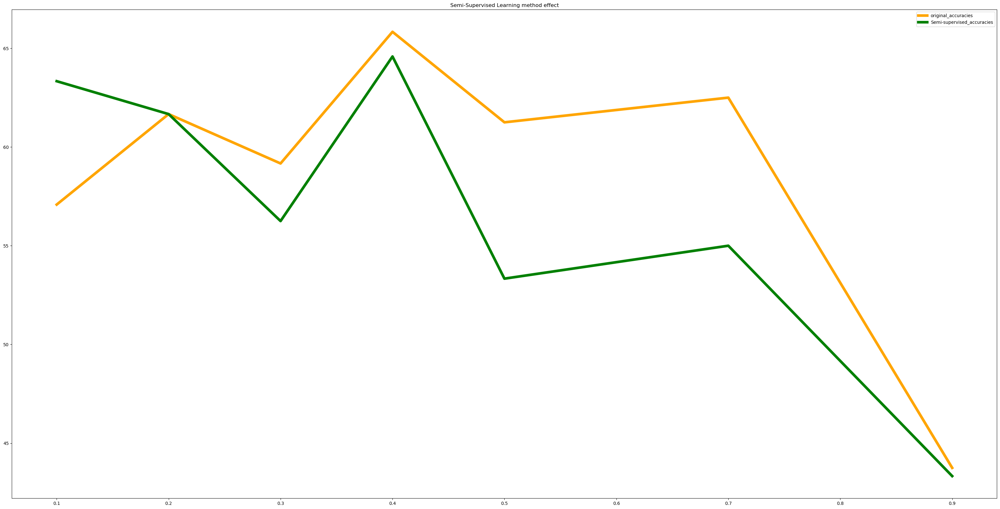

In [220]:
org_dic = res = dict(zip(parts_rev, org_comp_accs))
plot_accs2(org_dic, method_accs,"Semi-Supervised Learning method effect")

[87.5, 90.0, 90.41666666666667, 93.33333333333333, 90.83333333333333, 95.83333333333334, 92.08333333333333]
[95.41666666666667, 94.16666666666667, 93.33333333333333, 94.58333333333333, 91.66666666666666, 92.08333333333333, 90.0]


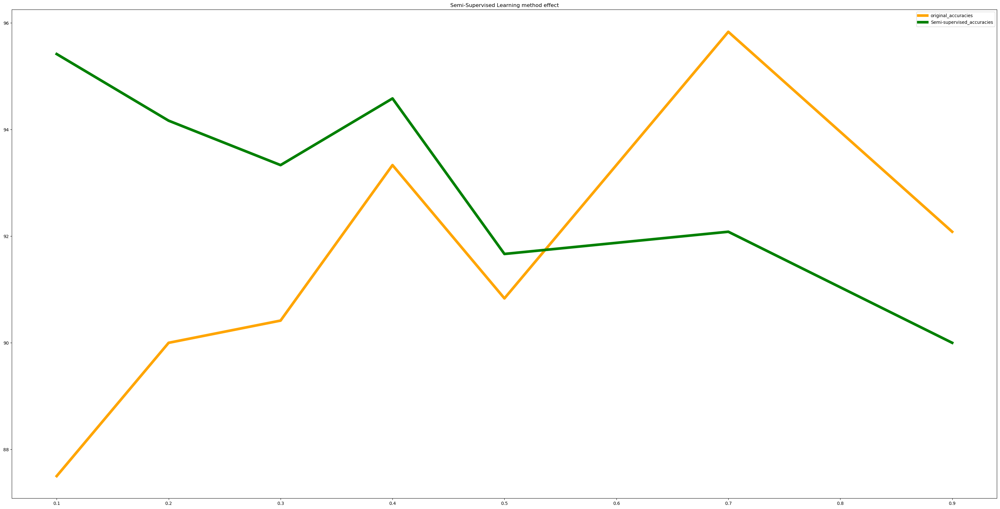

In [221]:
org_dic_room = res = dict(zip(parts_rev, org_comp_accs_room))
plot_accs2(org_dic_room, method_accs_room,"Semi-Supervised Learning method effect")

In [222]:
org_comp_accs_room

[87.5,
 90.0,
 90.41666666666667,
 93.33333333333333,
 90.83333333333333,
 95.83333333333334,
 92.08333333333333]

[92.08333333333333, 95.83333333333334]
[90.0, 92.08333333333333]


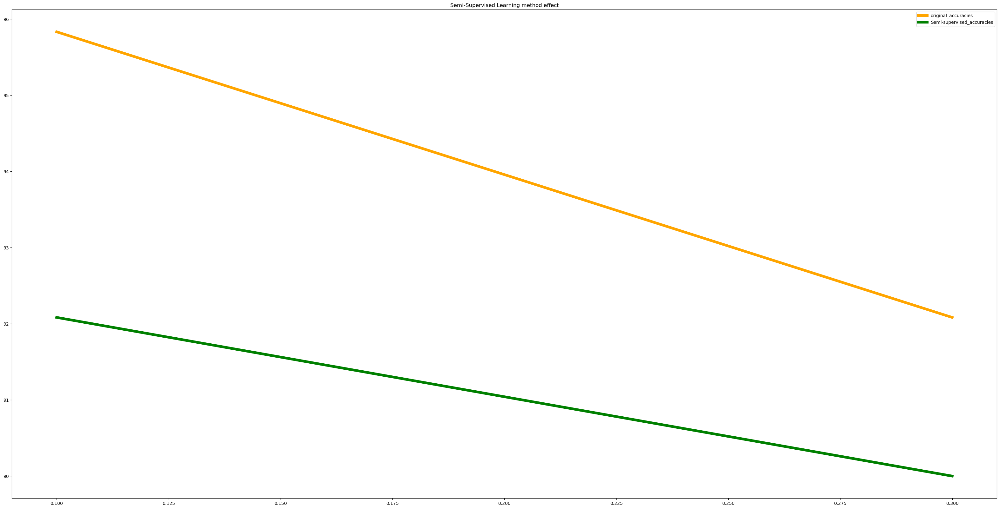

In [223]:
org_dic_room_sl = res = dict(zip(parts[5:], org_comp_accs_room[5:]))
plot_accs(org_dic_room_sl, method_accs_room[5:],"Semi-Supervised Learning method effect")

### KNN with Generated Data

In [258]:
method_accs2 = []
org_comp_accs2 = []
method_accs_room2 = []
org_comp_accs_room2 = []
tx = alpha_filtered2_train.copy()
for par in parts:
    print(par)
    data_shape = (20,)
    latent_dim = 8
    input_layer = keras.Input(shape=data_shape)
    x = keras.layers.Dense(18, activation ='relu')(input_layer)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(10, activation ='relu')(x)
    means = keras.layers.Dense(latent_dim)(x)
    log_var = keras.layers.Dense(latent_dim)(x)

    z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

    encoder = keras.models.Model(input_layer, [means, log_var, z])

    decoder_input = keras.layers.Input(shape =(latent_dim,))
    x = keras.layers.Dense(10, activation ='relu')(decoder_input)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(18, activation ='relu')(x)
    outputs = keras.layers.Dense(20, activation ='sigmoid')(x)
    decoder = keras.models.Model(decoder_input, outputs)
    x_prime = decoder(z)
    outputs = decoder(encoder(input_layer)[2])
    vae = keras.models.Model(input_layer, outputs, name='vae')    
    vae.compile(loss=my_loss,optimizer="adam",metrics=["accuracy"])
    print(vae.summary())

    x = len(alpha_filtered2_train)
    par_df, par_locations, par_df_test, par_test_loc = prep_data_for_synthesis2(tx, par, x)
    tx = par_df.copy()
    tx['location'] = par_locations

    his3 = vae.fit(min_max_scaler.fit_transform(par_df), min_max_scaler.fit_transform(par_df) , epochs = 100, batch_size = 8, validation_split= 0.2)

    outps = encoder.predict(min_max_scaler.fit_transform(par_df))

    new = generate_new_data((1500-len(par_df)), outps)
    generated_dataframe = pd.DataFrame(new, columns = no_channel_training_cols)

    nolabels = [-1 for _ in range(len(generated_dataframe))]
    nolabels = pd.DataFrame(nolabels, columns = ['location'])
    frames = [pd.DataFrame(min_max_scaler.fit_transform(par_df), columns= no_channel_training_cols), generated_dataframe]
    train_combined = pd.concat(frames)

    semi_combined_lbs = pd.concat([par_locations, nolabels])
    label_propagator = LabelPropagation()
    label_propagator.fit(train_combined, semi_combined_lbs)
    all_labels = label_propagator.transduction_

#     ann_model3 = keras.Sequential()
#     ann_model3.add(keras.layers.InputLayer(input_shape = (20,)))
#     ann_model3.add(keras.layers.Dense(60, activation ='elu'))
#     ann_model3.add(keras.layers.Dropout(0.3))
#     ann_model3.add(keras.layers.Dense(80, activation ='elu'))
#     ann_model3.add(keras.layers.Dropout(0.3))
#     ann_model3.add(keras.layers.Dense(96))
#     ann_model3.summary()
    
#     ann_model3.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),optimizer='adam', metrics=['accuracy'])
#     hist = ann_model3.fit(train_combined, all_labels , epochs=100,validation_split= 0.3)
#     test_loss, test_acc = ann_model3.evaluate(min_max_scaler.fit_transform(one_ten_df_test),  one_ten__test_loc, verbose=2)
#     pred_ann = ann_model3.predict(min_max_scaler.fit_transform(one_ten_df_test))
#     print("Neural Network algorithm prediction time: "+ str(runtime))
#     test_acc

    syn_semi_predictions_clf,runtime = run_knn(train_combined, all_labels, pd.DataFrame(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]), columns= no_channel_training_cols),[],7)

    method_accs2.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], syn_semi_predictions_clf)*100)

    room_lev_atarget = []
    for i in alpha_filtered2_test.loc[:, ['location']].to_numpy():
        room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    room_lev_test_semi = []
    for i in syn_semi_predictions_clf:
        room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    method_accs_room2.append(accuracy_score(room_lev_atarget, room_lev_test_semi)*100)


    without_syn_predictions ,runtime = run_knn(min_max_scaler.fit_transform(par_df), par_locations, pd.DataFrame(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]), columns= no_channel_training_cols),[],7)

    org_comp_accs2.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], without_syn_predictions)*100)

    room_lev_test_without_pred_rf = []
    for i in without_syn_predictions:
        room_lev_test_without_pred_rf.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    org_comp_accs_room2.append(accuracy_score(room_lev_atarget, room_lev_test_without_pred_rf)*100)


0.9
Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_129 (InputLayer)       (None, 20)                0         
_________________________________________________________________
model_113 (Model)            [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_114 (Model)            (None, 20)                923       
Total params: 1,922
Trainable params: 1,922
Non-trainable params: 0
_________________________________________________________________
None
Train on 690 samples, validate on 173 samples
Epoch 1/100
690/690 [==============================] - 2s 3ms/step - loss: 12.7236 - accuracy: 0.2217 - val_loss: 9.7841 - val_accuracy: 0.2428
Epoch 2/100
690/690 [==============================] - 0s 603us/step - loss: 7.8049 - accuracy: 0.2333 - val_loss: 7.3249 - val_accuracy: 0.2775
Epoch 3/100
690/690 [==========================

Epoch 52/100
690/690 [==============================] - 0s 696us/step - loss: 3.3990 - accuracy: 0.7739 - val_loss: 3.4903 - val_accuracy: 0.7977
Epoch 53/100
690/690 [==============================] - 0s 534us/step - loss: 3.4156 - accuracy: 0.7812 - val_loss: 3.5335 - val_accuracy: 0.7630
Epoch 54/100
690/690 [==============================] - 0s 567us/step - loss: 3.3973 - accuracy: 0.7870 - val_loss: 3.5115 - val_accuracy: 0.7688
Epoch 55/100
690/690 [==============================] - 0s 514us/step - loss: 3.3869 - accuracy: 0.7942 - val_loss: 3.5478 - val_accuracy: 0.7572
Epoch 56/100
690/690 [==============================] - 0s 468us/step - loss: 3.3939 - accuracy: 0.7783 - val_loss: 3.5020 - val_accuracy: 0.7803
Epoch 57/100
690/690 [==============================] - 0s 512us/step - loss: 3.3856 - accuracy: 0.7797 - val_loss: 3.5057 - val_accuracy: 0.7861
Epoch 58/100
690/690 [==============================] - 0s 497us/step - loss: 3.3594 - accuracy: 0.7841 - val_loss: 3.5246 -

Epoch 3/100
613/613 [==============================] - 0s 751us/step - loss: 6.9017 - accuracy: 0.5334 - val_loss: 6.2369 - val_accuracy: 0.5519
Epoch 4/100
613/613 [==============================] - 0s 755us/step - loss: 5.5865 - accuracy: 0.4046 - val_loss: 4.3899 - val_accuracy: 0.2597
Epoch 5/100
613/613 [==============================] - 0s 742us/step - loss: 4.1555 - accuracy: 0.2773 - val_loss: 3.8918 - val_accuracy: 0.4091
Epoch 6/100
613/613 [==============================] - 0s 723us/step - loss: 3.8453 - accuracy: 0.4405 - val_loss: 3.9479 - val_accuracy: 0.5519
Epoch 7/100
613/613 [==============================] - 0s 697us/step - loss: 3.8195 - accuracy: 0.5269 - val_loss: 3.5765 - val_accuracy: 0.6104
Epoch 8/100
613/613 [==============================] - 0s 698us/step - loss: 3.6877 - accuracy: 0.6623 - val_loss: 3.5510 - val_accuracy: 0.6883
Epoch 9/100
613/613 [==============================] - 0s 743us/step - loss: 3.6652 - accuracy: 0.7031 - val_loss: 3.5341 - val_ac

613/613 [==============================] - 1s 1ms/step - loss: 3.4464 - accuracy: 0.6639 - val_loss: 3.3950 - val_accuracy: 0.6623
Epoch 60/100
613/613 [==============================] - 1s 1ms/step - loss: 3.4413 - accuracy: 0.6705 - val_loss: 3.3789 - val_accuracy: 0.6688
Epoch 61/100
613/613 [==============================] - 1s 1ms/step - loss: 3.4732 - accuracy: 0.6835 - val_loss: 3.3716 - val_accuracy: 0.5844
Epoch 62/100
613/613 [==============================] - 1s 1ms/step - loss: 3.4527 - accuracy: 0.6803 - val_loss: 3.3480 - val_accuracy: 0.6558
Epoch 63/100
613/613 [==============================] - 1s 1ms/step - loss: 3.4614 - accuracy: 0.6770 - val_loss: 3.3585 - val_accuracy: 0.6623
Epoch 64/100
613/613 [==============================] - 1s 1ms/step - loss: 3.4630 - accuracy: 0.6770 - val_loss: 3.3929 - val_accuracy: 0.6364
Epoch 65/100
613/613 [==============================] - 1s 1ms/step - loss: 3.4540 - accuracy: 0.6574 - val_loss: 3.3678 - val_accuracy: 0.6753
Epoch

536/536 [==============================] - 0s 554us/step - loss: 3.8149 - accuracy: 0.7146 - val_loss: 3.4763 - val_accuracy: 0.6889
Epoch 11/100
536/536 [==============================] - 0s 601us/step - loss: 3.7796 - accuracy: 0.7257 - val_loss: 3.4219 - val_accuracy: 0.7037
Epoch 12/100
536/536 [==============================] - 0s 567us/step - loss: 3.7513 - accuracy: 0.7276 - val_loss: 3.3812 - val_accuracy: 0.7259
Epoch 13/100
536/536 [==============================] - 0s 581us/step - loss: 3.7249 - accuracy: 0.7090 - val_loss: 3.3295 - val_accuracy: 0.7111
Epoch 14/100
536/536 [==============================] - 0s 592us/step - loss: 3.7135 - accuracy: 0.7071 - val_loss: 3.3360 - val_accuracy: 0.6889
Epoch 15/100
536/536 [==============================] - 0s 576us/step - loss: 3.6660 - accuracy: 0.7146 - val_loss: 3.3102 - val_accuracy: 0.6444
Epoch 16/100
536/536 [==============================] - 0s 560us/step - loss: 3.6659 - accuracy: 0.7052 - val_loss: 3.3303 - val_accuracy

536/536 [==============================] - 0s 747us/step - loss: 3.4826 - accuracy: 0.7481 - val_loss: 3.1509 - val_accuracy: 0.7407
Epoch 67/100
536/536 [==============================] - 0s 712us/step - loss: 3.4531 - accuracy: 0.7220 - val_loss: 3.1763 - val_accuracy: 0.7259
Epoch 68/100
536/536 [==============================] - 0s 663us/step - loss: 3.4777 - accuracy: 0.7500 - val_loss: 3.1584 - val_accuracy: 0.7259
Epoch 69/100
536/536 [==============================] - 0s 722us/step - loss: 3.4767 - accuracy: 0.7239 - val_loss: 3.1536 - val_accuracy: 0.7333
Epoch 70/100
536/536 [==============================] - 0s 713us/step - loss: 3.4823 - accuracy: 0.7239 - val_loss: 3.1532 - val_accuracy: 0.7037
Epoch 71/100
536/536 [==============================] - 0s 714us/step - loss: 3.4621 - accuracy: 0.7201 - val_loss: 3.2430 - val_accuracy: 0.7037
Epoch 72/100
536/536 [==============================] - 0s 636us/step - loss: 3.4891 - accuracy: 0.7257 - val_loss: 3.1572 - val_accuracy

460/460 [==============================] - 1s 1ms/step - loss: 3.6063 - accuracy: 0.5261 - val_loss: 3.4539 - val_accuracy: 0.5652
Epoch 18/100
460/460 [==============================] - 1s 1ms/step - loss: 3.5687 - accuracy: 0.5304 - val_loss: 3.4259 - val_accuracy: 0.5478
Epoch 19/100
460/460 [==============================] - 1s 1ms/step - loss: 3.5769 - accuracy: 0.5457 - val_loss: 3.5065 - val_accuracy: 0.5304
Epoch 20/100
460/460 [==============================] - 1s 1ms/step - loss: 3.5913 - accuracy: 0.5217 - val_loss: 3.3903 - val_accuracy: 0.5391
Epoch 21/100
460/460 [==============================] - 0s 1ms/step - loss: 3.6119 - accuracy: 0.5348 - val_loss: 3.5359 - val_accuracy: 0.5391
Epoch 22/100
460/460 [==============================] - 0s 1ms/step - loss: 3.5451 - accuracy: 0.5500 - val_loss: 3.4018 - val_accuracy: 0.5217
Epoch 23/100
460/460 [==============================] - 0s 1ms/step - loss: 3.5729 - accuracy: 0.5522 - val_loss: 3.4005 - val_accuracy: 0.4870
Epoch

Epoch 74/100
460/460 [==============================] - 1s 1ms/step - loss: 3.4305 - accuracy: 0.5978 - val_loss: 3.3070 - val_accuracy: 0.5913
Epoch 75/100
460/460 [==============================] - 1s 1ms/step - loss: 3.4365 - accuracy: 0.5804 - val_loss: 3.2918 - val_accuracy: 0.5826
Epoch 76/100
460/460 [==============================] - 0s 1ms/step - loss: 3.4350 - accuracy: 0.5978 - val_loss: 3.3090 - val_accuracy: 0.5739
Epoch 77/100
460/460 [==============================] - 1s 1ms/step - loss: 3.4342 - accuracy: 0.5935 - val_loss: 3.2889 - val_accuracy: 0.5739
Epoch 78/100
460/460 [==============================] - 1s 1ms/step - loss: 3.4465 - accuracy: 0.6043 - val_loss: 3.2719 - val_accuracy: 0.5739
Epoch 79/100
460/460 [==============================] - 1s 1ms/step - loss: 3.4268 - accuracy: 0.5957 - val_loss: 3.2785 - val_accuracy: 0.5652
Epoch 80/100
460/460 [==============================] - 1s 1ms/step - loss: 3.4378 - accuracy: 0.5804 - val_loss: 3.2965 - val_accuracy:

383/383 [==============================] - 0s 1ms/step - loss: 3.5101 - accuracy: 0.4752 - val_loss: 3.4571 - val_accuracy: 0.5208
Epoch 26/100
383/383 [==============================] - 0s 1ms/step - loss: 3.5426 - accuracy: 0.5300 - val_loss: 3.4729 - val_accuracy: 0.5312
Epoch 27/100
383/383 [==============================] - 0s 1ms/step - loss: 3.5058 - accuracy: 0.4987 - val_loss: 3.5027 - val_accuracy: 0.4688
Epoch 28/100
383/383 [==============================] - 0s 989us/step - loss: 3.5238 - accuracy: 0.4961 - val_loss: 3.4873 - val_accuracy: 0.5104
Epoch 29/100
383/383 [==============================] - 0s 1ms/step - loss: 3.5103 - accuracy: 0.4987 - val_loss: 3.5393 - val_accuracy: 0.5208
Epoch 30/100
383/383 [==============================] - 0s 1ms/step - loss: 3.4872 - accuracy: 0.5170 - val_loss: 3.4518 - val_accuracy: 0.5104
Epoch 31/100
383/383 [==============================] - 0s 989us/step - loss: 3.4921 - accuracy: 0.5013 - val_loss: 3.4925 - val_accuracy: 0.5417
E

383/383 [==============================] - 0s 1ms/step - loss: 3.4282 - accuracy: 0.5379 - val_loss: 3.4122 - val_accuracy: 0.5625
Epoch 82/100
383/383 [==============================] - 0s 1ms/step - loss: 3.4465 - accuracy: 0.5509 - val_loss: 3.4987 - val_accuracy: 0.5521
Epoch 83/100
383/383 [==============================] - 0s 1ms/step - loss: 3.4541 - accuracy: 0.5431 - val_loss: 3.4423 - val_accuracy: 0.5729
Epoch 84/100
383/383 [==============================] - 0s 1ms/step - loss: 3.4116 - accuracy: 0.5248 - val_loss: 3.3650 - val_accuracy: 0.5729
Epoch 85/100
383/383 [==============================] - 0s 1ms/step - loss: 3.4309 - accuracy: 0.5692 - val_loss: 3.3995 - val_accuracy: 0.5625
Epoch 86/100
383/383 [==============================] - 0s 1ms/step - loss: 3.4176 - accuracy: 0.5666 - val_loss: 3.4179 - val_accuracy: 0.5625
Epoch 87/100
383/383 [==============================] - 0s 1ms/step - loss: 3.4373 - accuracy: 0.5379 - val_loss: 3.4956 - val_accuracy: 0.5833
Epoch

191/191 [==============================] - 0s 1ms/step - loss: 3.8649 - accuracy: 0.4764 - val_loss: 3.7820 - val_accuracy: 0.4167
Epoch 33/100
191/191 [==============================] - 0s 1ms/step - loss: 3.8867 - accuracy: 0.4921 - val_loss: 3.6886 - val_accuracy: 0.4583
Epoch 34/100
191/191 [==============================] - 0s 1ms/step - loss: 3.8495 - accuracy: 0.4607 - val_loss: 3.7119 - val_accuracy: 0.4583
Epoch 35/100
191/191 [==============================] - 0s 1ms/step - loss: 3.8728 - accuracy: 0.4921 - val_loss: 3.7803 - val_accuracy: 0.4583
Epoch 36/100
191/191 [==============================] - 0s 1ms/step - loss: 3.8644 - accuracy: 0.4712 - val_loss: 3.6663 - val_accuracy: 0.5208
Epoch 37/100
191/191 [==============================] - 0s 985us/step - loss: 3.8576 - accuracy: 0.4974 - val_loss: 3.7425 - val_accuracy: 0.4583
Epoch 38/100
191/191 [==============================] - 0s 1ms/step - loss: 3.8399 - accuracy: 0.4921 - val_loss: 3.7229 - val_accuracy: 0.4792
Epo

191/191 [==============================] - 0s 997us/step - loss: 3.6699 - accuracy: 0.5026 - val_loss: 3.5901 - val_accuracy: 0.5417
Epoch 89/100
191/191 [==============================] - 0s 1ms/step - loss: 3.6460 - accuracy: 0.5183 - val_loss: 3.4522 - val_accuracy: 0.5000
Epoch 90/100
191/191 [==============================] - 0s 999us/step - loss: 3.6824 - accuracy: 0.5079 - val_loss: 3.5160 - val_accuracy: 0.4792
Epoch 91/100
191/191 [==============================] - 0s 1ms/step - loss: 3.6652 - accuracy: 0.5236 - val_loss: 3.4817 - val_accuracy: 0.5208
Epoch 92/100
191/191 [==============================] - 0s 1ms/step - loss: 3.6716 - accuracy: 0.4869 - val_loss: 3.5144 - val_accuracy: 0.5000
Epoch 93/100
191/191 [==============================] - 0s 1ms/step - loss: 3.6725 - accuracy: 0.5079 - val_loss: 3.5695 - val_accuracy: 0.4792
Epoch 94/100
191/191 [==============================] - 0s 1ms/step - loss: 3.6772 - accuracy: 0.4817 - val_loss: 3.5289 - val_accuracy: 0.4583
E

96/96 [==============================] - 0s 1ms/step - loss: 4.1868 - accuracy: 0.4896 - val_loss: 3.8401 - val_accuracy: 0.1667
Epoch 40/100
96/96 [==============================] - 0s 881us/step - loss: 4.0832 - accuracy: 0.4479 - val_loss: 3.8102 - val_accuracy: 0.2500
Epoch 41/100
96/96 [==============================] - 0s 915us/step - loss: 4.0306 - accuracy: 0.4792 - val_loss: 3.8188 - val_accuracy: 0.2500
Epoch 42/100
96/96 [==============================] - 0s 899us/step - loss: 4.0774 - accuracy: 0.5000 - val_loss: 3.7839 - val_accuracy: 0.2917
Epoch 43/100
96/96 [==============================] - 0s 972us/step - loss: 4.0784 - accuracy: 0.4479 - val_loss: 3.7667 - val_accuracy: 0.2500
Epoch 44/100
96/96 [==============================] - 0s 957us/step - loss: 4.0314 - accuracy: 0.4583 - val_loss: 3.7646 - val_accuracy: 0.1250
Epoch 45/100
96/96 [==============================] - 0s 880us/step - loss: 3.9771 - accuracy: 0.4479 - val_loss: 3.7846 - val_accuracy: 0.1667
Epoch 4

96/96 [==============================] - 0s 1ms/step - loss: 3.7428 - accuracy: 0.4792 - val_loss: 3.4152 - val_accuracy: 0.2500
Epoch 97/100
96/96 [==============================] - 0s 906us/step - loss: 3.7325 - accuracy: 0.4479 - val_loss: 3.5183 - val_accuracy: 0.2083
Epoch 98/100
96/96 [==============================] - 0s 937us/step - loss: 3.8055 - accuracy: 0.4479 - val_loss: 3.5589 - val_accuracy: 0.2083
Epoch 99/100
96/96 [==============================] - 0s 1ms/step - loss: 3.7280 - accuracy: 0.5000 - val_loss: 3.4959 - val_accuracy: 0.2083
Epoch 100/100
96/96 [==============================] - 0s 1ms/step - loss: 3.7433 - accuracy: 0.4583 - val_loss: 3.5359 - val_accuracy: 0.2917


[64.58333333333334, 61.66666666666667, 57.49999999999999, 54.166666666666664, 50.0, 38.333333333333336, 25.416666666666664]
[62.916666666666664, 60.83333333333333, 57.08333333333333, 52.083333333333336, 47.083333333333336, 32.916666666666664, 26.25]


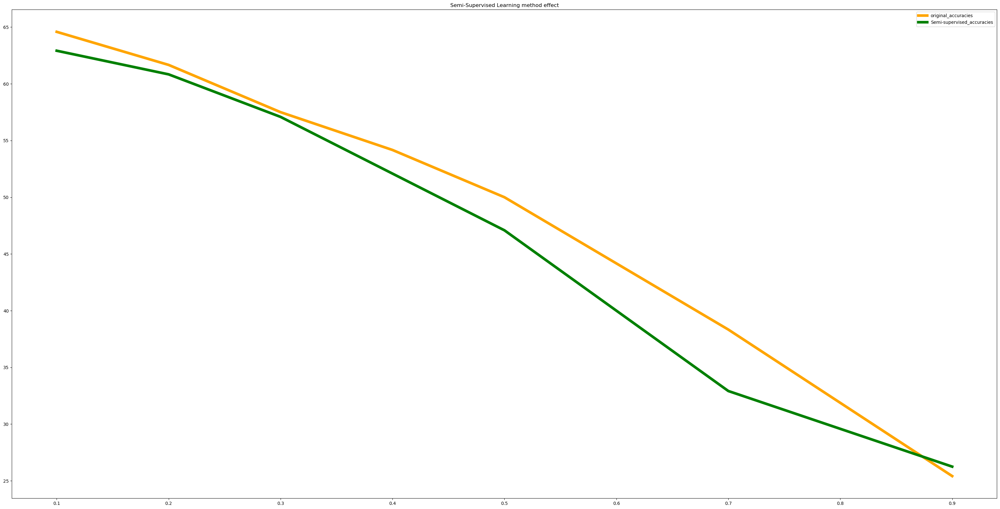

In [259]:
org_dic2 = res = dict(zip(parts_rev, org_comp_accs2))
plot_accs2(org_dic2, method_accs2,"Semi-Supervised Learning method effect")

[95.41666666666667, 95.83333333333334, 95.0, 95.0, 94.58333333333333, 89.16666666666667, 72.5]
[95.41666666666667, 92.91666666666667, 91.66666666666666, 91.66666666666666, 89.58333333333334, 84.16666666666667, 75.41666666666667]


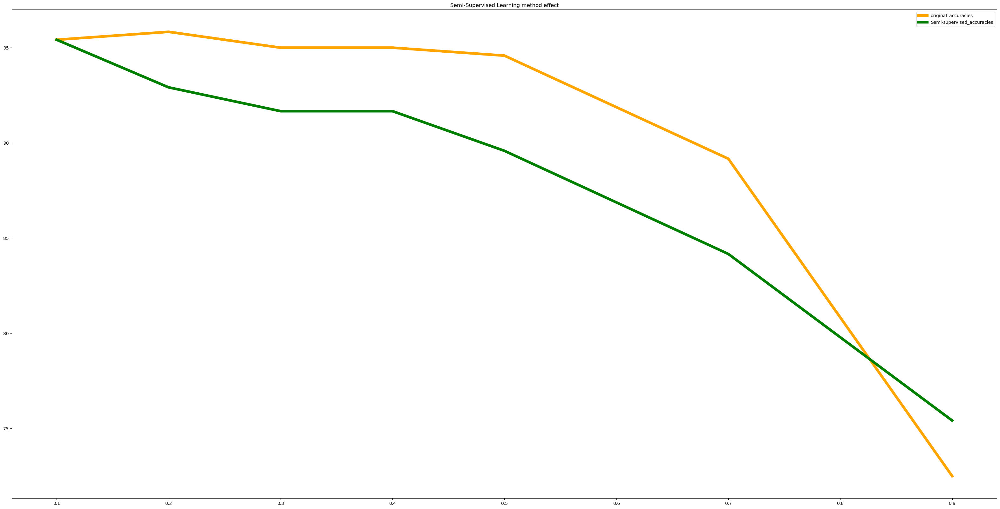

In [260]:
org_dic_room2 = res = dict(zip(parts_rev, org_comp_accs_room2))
plot_accs2(org_dic_room2, method_accs_room2,"Semi-Supervised Learning method effect")

[69.58333333333333, 64.58333333333334, 63.33333333333333, 60.83333333333333, 55.00000000000001, 44.583333333333336, 30.416666666666664]
[67.5, 63.33333333333333, 63.74999999999999, 61.66666666666667, 54.166666666666664, 39.58333333333333, 28.749999999999996]


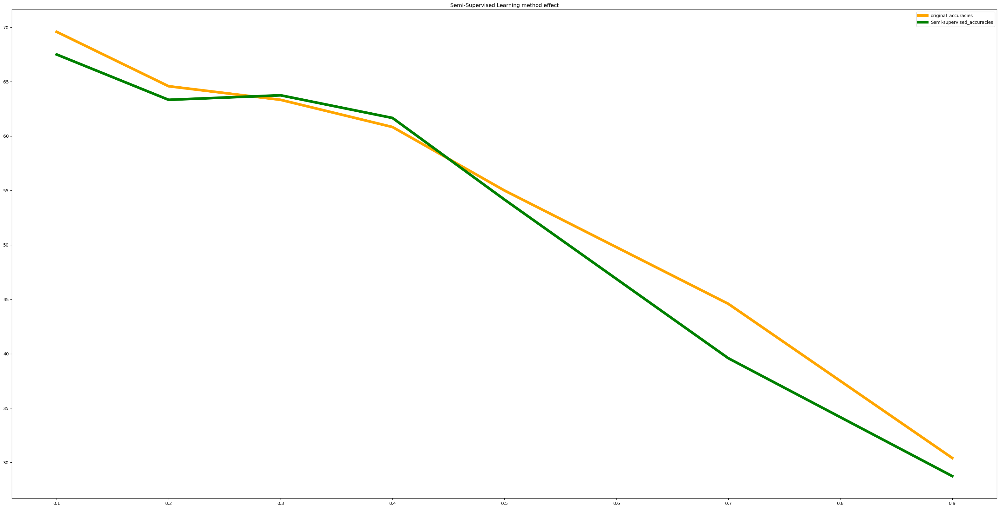

In [225]:
org_dic2 = res = dict(zip(parts_rev, org_comp_accs2))
plot_accs2(org_dic2, method_accs2,"Semi-Supervised Learning method effect")

[95.83333333333334, 95.0, 95.41666666666667, 94.58333333333333, 94.58333333333333, 89.58333333333334, 80.41666666666667]
[95.41666666666667, 92.91666666666667, 94.58333333333333, 93.33333333333333, 90.41666666666667, 85.83333333333333, 81.25]


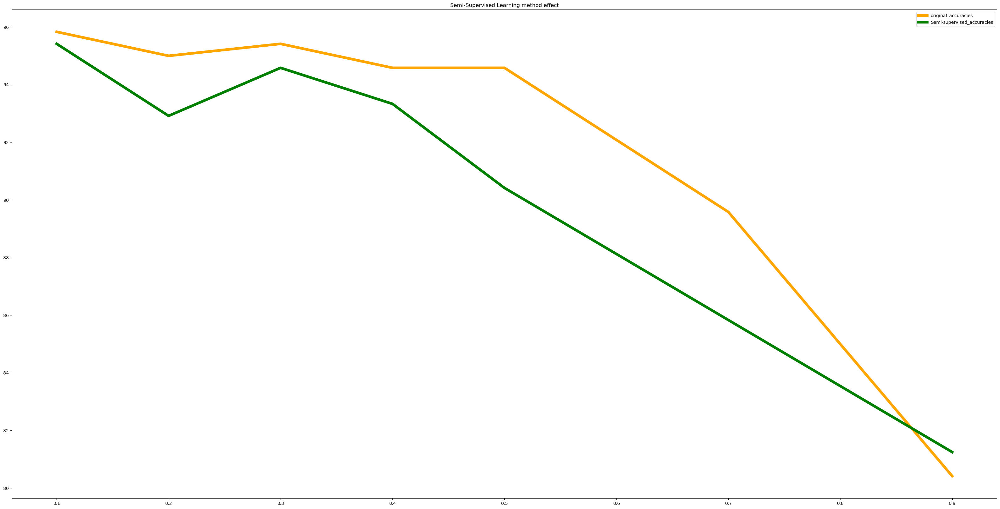

In [226]:
org_dic_room2 = res = dict(zip(parts_rev, org_comp_accs_room2))
plot_accs2(org_dic_room2, method_accs_room2,"Semi-Supervised Learning method effect")

In [ ]:
parts = [0.1,0.2, 0.3,0.4, 0.5, 0.7, 0.9]

### ANN with Generated Data

In [236]:
method_accs3 = []
org_comp_accs3 = []
method_accs_room3 = []
org_comp_accs_room3 = []
tx = alpha_filtered2_train.copy()
for par in parts:
    print(par)
    data_shape = (20,)
    latent_dim = 8
    input_layer = keras.Input(shape=data_shape)
    x = keras.layers.Dense(18, activation ='relu')(input_layer)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(10, activation ='relu')(x)
    means = keras.layers.Dense(latent_dim)(x)
    log_var = keras.layers.Dense(latent_dim)(x)

    z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

    encoder = keras.models.Model(input_layer, [means, log_var, z])

    decoder_input = keras.layers.Input(shape =(latent_dim,))
    x = keras.layers.Dense(10, activation ='relu')(decoder_input)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(18, activation ='relu')(x)
    outputs = keras.layers.Dense(20, activation ='sigmoid')(x)
    decoder = keras.models.Model(decoder_input, outputs)
    x_prime = decoder(z)
    outputs = decoder(encoder(input_layer)[2])
    vae = keras.models.Model(input_layer, outputs, name='vae')    
    vae.compile(loss=my_loss,optimizer="adam",metrics=["accuracy"])
    print(vae.summary())

    x = len(alpha_filtered2_train)
    par_df, par_locations, par_df_test, par_test_loc = prep_data_for_synthesis2(tx, par, x)
    tx = par_df.copy()
    tx['location'] = par_locations

    his3 = vae.fit(min_max_scaler.fit_transform(par_df), min_max_scaler.fit_transform(par_df) , epochs = 100, batch_size = 8, validation_split= 0.2)

    outps = encoder.predict(min_max_scaler.fit_transform(par_df))

    new = generate_new_data(1000, outps)
    generated_dataframe = pd.DataFrame(new, columns = no_channel_training_cols)

    nolabels = [-1 for _ in range(len(generated_dataframe))]
    nolabels = pd.DataFrame(nolabels, columns = ['location'])
    frames = [pd.DataFrame(min_max_scaler.fit_transform(par_df), columns= no_channel_training_cols), generated_dataframe]
    train_combined = pd.concat(frames)

    semi_combined_lbs = pd.concat([par_locations, nolabels])
    label_propagator = LabelPropagation()
    label_propagator.fit(train_combined, semi_combined_lbs)
    all_labels = label_propagator.transduction_

    ann_model3 = keras.Sequential()
    ann_model3.add(keras.layers.InputLayer(input_shape = (20,)))
    ann_model3.add(keras.layers.Dense(60, activation ='relu'))
    ann_model3.add(keras.layers.Dropout(0.1))
    ann_model3.add(keras.layers.Dense(80, activation ='relu'))
    ann_model3.add(keras.layers.Dropout(0.1))
    ann_model3.add(keras.layers.Dense(96))
    ann_model3.summary()
    
    ann_model3.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),optimizer='adam', metrics=['accuracy'])
    hist = ann_model3.fit(train_combined, all_labels , epochs=70,validation_split= 0.3)
    test_loss, test_acc = ann_model3.evaluate(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]), alpha_filtered2_test.loc[:, ['location']], verbose=2)

    method_accs3.append(test_acc*100)

#     room_lev_atarget = []
#     for i in alpha_filtered2_test.loc[:, ['location']].to_numpy():
#         room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

#     room_lev_test_semi = []
#     for i in syn_semi_predictions_clf:
#         room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

#     method_accs_room2.append(accuracy_score(room_lev_atarget, room_lev_test_semi)*100)

    ann_model3 = keras.Sequential()
    ann_model3.add(keras.layers.InputLayer(input_shape = (20,)))
    ann_model3.add(keras.layers.Dense(60, activation ='relu'))
    ann_model3.add(keras.layers.Dropout(0.1))
    ann_model3.add(keras.layers.Dense(80, activation ='relu'))
    ann_model3.add(keras.layers.Dropout(0.1))
    ann_model3.add(keras.layers.Dense(96))
    ann_model3.summary()
    
    ann_model3.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),optimizer='adam', metrics=['accuracy'])
    hist = ann_model3.fit(min_max_scaler.fit_transform(par_df), par_locations, epochs=70,validation_split= 0.3)
    test_loss, test_acc = ann_model3.evaluate(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]), alpha_filtered2_test.loc[:, ['location']], verbose=2)

    org_comp_accs3.append(test_acc*100)

#     without_syn_predictions ,runtime = run_knn(min_max_scaler.fit_transform(par_df), par_locations, pd.DataFrame(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]), columns= no_channel_training_cols),[],3)

#     org_comp_accs2.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], without_syn_predictions)*100)

#     room_lev_test_without_pred_rf = []
#     for i in without_syn_predictions:
#         room_lev_test_without_pred_rf.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

#     org_comp_accs_room2.append(accuracy_score(room_lev_atarget, room_lev_test_without_pred_rf)*100)


0.9
Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_87 (InputLayer)        (None, 20)                0         
_________________________________________________________________
model_85 (Model)             [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_86 (Model)             (None, 20)                923       
Total params: 1,922
Trainable params: 1,922
Non-trainable params: 0
_________________________________________________________________
None
Train on 690 samples, validate on 173 samples
Epoch 1/100
690/690 [==============================] - 2s 3ms/step - loss: 13.0124 - accuracy: 0.1203 - val_loss: 10.5871 - val_accuracy: 0.1040
Epoch 2/100
690/690 [==============================] - 0s 468us/step - loss: 8.5432 - accuracy: 0.0768 - val_loss: 7.8173 - val_accuracy: 0.1156
Epoch 3/100
690/690 [=========================

Epoch 52/100
690/690 [==============================] - 0s 440us/step - loss: 3.4473 - accuracy: 0.6362 - val_loss: 3.5478 - val_accuracy: 0.6301
Epoch 53/100
690/690 [==============================] - 0s 425us/step - loss: 3.4034 - accuracy: 0.6333 - val_loss: 3.5007 - val_accuracy: 0.6012
Epoch 54/100
690/690 [==============================] - 0s 435us/step - loss: 3.4301 - accuracy: 0.6406 - val_loss: 3.5620 - val_accuracy: 0.5780
Epoch 55/100
690/690 [==============================] - 0s 436us/step - loss: 3.4204 - accuracy: 0.6319 - val_loss: 3.5408 - val_accuracy: 0.5780
Epoch 56/100
690/690 [==============================] - 0s 438us/step - loss: 3.4331 - accuracy: 0.6536 - val_loss: 3.5599 - val_accuracy: 0.6243
Epoch 57/100
690/690 [==============================] - 0s 463us/step - loss: 3.4135 - accuracy: 0.6551 - val_loss: 3.5156 - val_accuracy: 0.6243
Epoch 58/100
690/690 [==============================] - 0s 583us/step - loss: 3.4297 - accuracy: 0.6536 - val_loss: 3.5456 -

1304/1304 [==============================] - 1s 1ms/step - loss: 4.4968 - accuracy: 0.0322 - val_loss: 4.2639 - val_accuracy: 0.0805
Epoch 2/70
1304/1304 [==============================] - 0s 186us/step - loss: 4.1997 - accuracy: 0.0613 - val_loss: 3.6609 - val_accuracy: 0.1145
Epoch 3/70
1304/1304 [==============================] - 0s 192us/step - loss: 3.7600 - accuracy: 0.0729 - val_loss: 3.1258 - val_accuracy: 0.1181
Epoch 4/70
1304/1304 [==============================] - 0s 186us/step - loss: 3.3997 - accuracy: 0.1051 - val_loss: 2.8244 - val_accuracy: 0.3542
Epoch 5/70
1304/1304 [==============================] - 0s 187us/step - loss: 3.2011 - accuracy: 0.1449 - val_loss: 2.6570 - val_accuracy: 0.2880
Epoch 6/70
1304/1304 [==============================] - 0s 178us/step - loss: 3.0542 - accuracy: 0.1511 - val_loss: 2.5354 - val_accuracy: 0.3023
Epoch 7/70
1304/1304 [==============================] - 0s 183us/step - loss: 2.9238 - accuracy: 0.1549 - val_loss: 2.4059 - val_accuracy

Epoch 57/70
1304/1304 [==============================] - 0s 194us/step - loss: 1.7898 - accuracy: 0.3443 - val_loss: 1.2867 - val_accuracy: 0.6816
Epoch 58/70
1304/1304 [==============================] - 0s 196us/step - loss: 1.7973 - accuracy: 0.3589 - val_loss: 1.3380 - val_accuracy: 0.6190
Epoch 59/70
1304/1304 [==============================] - 0s 198us/step - loss: 1.7715 - accuracy: 0.3489 - val_loss: 1.2643 - val_accuracy: 0.6726
Epoch 60/70
1304/1304 [==============================] - 0s 198us/step - loss: 1.7461 - accuracy: 0.3505 - val_loss: 1.2556 - val_accuracy: 0.7102
Epoch 61/70
1304/1304 [==============================] - 0s 198us/step - loss: 1.7978 - accuracy: 0.3382 - val_loss: 1.2500 - val_accuracy: 0.6780
Epoch 62/70
1304/1304 [==============================] - 0s 204us/step - loss: 1.7399 - accuracy: 0.3735 - val_loss: 1.2746 - val_accuracy: 0.6440
Epoch 63/70
1304/1304 [==============================] - 0s 200us/step - loss: 1.7539 - accuracy: 0.3428 - val_loss: 1

604/604 [==============================] - 0s 204us/step - loss: 2.4619 - accuracy: 0.1507 - val_loss: 2.5864 - val_accuracy: 0.2317
Epoch 37/70
604/604 [==============================] - 0s 201us/step - loss: 2.3778 - accuracy: 0.1854 - val_loss: 2.5644 - val_accuracy: 0.2548
Epoch 38/70
604/604 [==============================] - 0s 200us/step - loss: 2.3996 - accuracy: 0.1788 - val_loss: 2.5673 - val_accuracy: 0.2741
Epoch 39/70
604/604 [==============================] - 0s 187us/step - loss: 2.3815 - accuracy: 0.1788 - val_loss: 2.5448 - val_accuracy: 0.2278
Epoch 40/70
604/604 [==============================] - 0s 192us/step - loss: 2.3638 - accuracy: 0.1954 - val_loss: 2.5163 - val_accuracy: 0.2548
Epoch 41/70
604/604 [==============================] - 0s 202us/step - loss: 2.3679 - accuracy: 0.1821 - val_loss: 2.5023 - val_accuracy: 0.2857
Epoch 42/70
604/604 [==============================] - 0s 197us/step - loss: 2.3107 - accuracy: 0.2053 - val_loss: 2.5122 - val_accuracy: 0.22

613/613 [==============================] - 0s 498us/step - loss: 3.5121 - accuracy: 0.6623 - val_loss: 3.4554 - val_accuracy: 0.5974
Epoch 18/100
613/613 [==============================] - 0s 502us/step - loss: 3.5149 - accuracy: 0.6444 - val_loss: 3.4121 - val_accuracy: 0.5909
Epoch 19/100
613/613 [==============================] - 0s 548us/step - loss: 3.5015 - accuracy: 0.6346 - val_loss: 3.3996 - val_accuracy: 0.6623
Epoch 20/100
613/613 [==============================] - 0s 576us/step - loss: 3.5093 - accuracy: 0.6656 - val_loss: 3.4114 - val_accuracy: 0.6299
Epoch 21/100
613/613 [==============================] - 0s 681us/step - loss: 3.5125 - accuracy: 0.6542 - val_loss: 3.4014 - val_accuracy: 0.6104
Epoch 22/100
613/613 [==============================] - 0s 505us/step - loss: 3.5101 - accuracy: 0.6525 - val_loss: 3.4033 - val_accuracy: 0.6169
Epoch 23/100
613/613 [==============================] - 0s 484us/step - loss: 3.4882 - accuracy: 0.6411 - val_loss: 3.3804 - val_accuracy

613/613 [==============================] - 0s 540us/step - loss: 3.4118 - accuracy: 0.7113 - val_loss: 3.3313 - val_accuracy: 0.6948
Epoch 74/100
613/613 [==============================] - 0s 515us/step - loss: 3.4381 - accuracy: 0.6998 - val_loss: 3.3664 - val_accuracy: 0.7013
Epoch 75/100
613/613 [==============================] - 0s 508us/step - loss: 3.4104 - accuracy: 0.7145 - val_loss: 3.3693 - val_accuracy: 0.7078
Epoch 76/100
613/613 [==============================] - 0s 502us/step - loss: 3.4322 - accuracy: 0.7145 - val_loss: 3.3823 - val_accuracy: 0.6883
Epoch 77/100
613/613 [==============================] - 0s 533us/step - loss: 3.4121 - accuracy: 0.7210 - val_loss: 3.3458 - val_accuracy: 0.6948
Epoch 78/100
613/613 [==============================] - 0s 514us/step - loss: 3.4030 - accuracy: 0.7080 - val_loss: 3.3550 - val_accuracy: 0.6883
Epoch 79/100
613/613 [==============================] - 0s 501us/step - loss: 3.4070 - accuracy: 0.7178 - val_loss: 3.3756 - val_accuracy

Epoch 22/70
1236/1236 [==============================] - 0s 191us/step - loss: 2.2278 - accuracy: 0.2597 - val_loss: 1.7632 - val_accuracy: 0.4444
Epoch 23/70
1236/1236 [==============================] - 0s 189us/step - loss: 2.2173 - accuracy: 0.2605 - val_loss: 1.7576 - val_accuracy: 0.4953
Epoch 24/70
1236/1236 [==============================] - 0s 190us/step - loss: 2.1655 - accuracy: 0.2840 - val_loss: 1.7307 - val_accuracy: 0.5593
Epoch 25/70
1236/1236 [==============================] - 0s 193us/step - loss: 2.1640 - accuracy: 0.2880 - val_loss: 1.7142 - val_accuracy: 0.4482
Epoch 26/70
1236/1236 [==============================] - 0s 200us/step - loss: 2.1583 - accuracy: 0.2751 - val_loss: 1.6889 - val_accuracy: 0.5141
Epoch 27/70
1236/1236 [==============================] - 0s 196us/step - loss: 2.1577 - accuracy: 0.2848 - val_loss: 1.6666 - val_accuracy: 0.5104
Epoch 28/70
1236/1236 [==============================] - 0s 194us/step - loss: 2.1008 - accuracy: 0.2961 - val_loss: 1

Train on 536 samples, validate on 231 samples
Epoch 1/70
536/536 [==============================] - 1s 2ms/step - loss: 4.5541 - accuracy: 0.0187 - val_loss: 4.5117 - val_accuracy: 0.0303
Epoch 2/70
536/536 [==============================] - 0s 182us/step - loss: 4.4818 - accuracy: 0.0317 - val_loss: 4.4456 - val_accuracy: 0.0303
Epoch 3/70
536/536 [==============================] - 0s 192us/step - loss: 4.3810 - accuracy: 0.0410 - val_loss: 4.3450 - val_accuracy: 0.0303
Epoch 4/70
536/536 [==============================] - 0s 190us/step - loss: 4.2405 - accuracy: 0.0448 - val_loss: 4.1844 - val_accuracy: 0.0390
Epoch 5/70
536/536 [==============================] - 0s 192us/step - loss: 4.0437 - accuracy: 0.0597 - val_loss: 3.9918 - val_accuracy: 0.0649
Epoch 6/70
536/536 [==============================] - 0s 186us/step - loss: 3.8270 - accuracy: 0.0485 - val_loss: 3.7949 - val_accuracy: 0.0519
Epoch 7/70
536/536 [==============================] - 0s 184us/step - loss: 3.6230 - accurac

536/536 [==============================] - 0s 234us/step - loss: 2.1992 - accuracy: 0.2351 - val_loss: 2.2290 - val_accuracy: 0.2294
Epoch 58/70
536/536 [==============================] - 0s 248us/step - loss: 2.2123 - accuracy: 0.2332 - val_loss: 2.1982 - val_accuracy: 0.2554
Epoch 59/70
536/536 [==============================] - 0s 247us/step - loss: 2.2010 - accuracy: 0.1772 - val_loss: 2.1815 - val_accuracy: 0.2900
Epoch 60/70
536/536 [==============================] - 0s 242us/step - loss: 2.2002 - accuracy: 0.2257 - val_loss: 2.2130 - val_accuracy: 0.2078
Epoch 61/70
536/536 [==============================] - 0s 241us/step - loss: 2.1648 - accuracy: 0.2183 - val_loss: 2.1929 - val_accuracy: 0.3030
Epoch 62/70
536/536 [==============================] - 0s 242us/step - loss: 2.1897 - accuracy: 0.2388 - val_loss: 2.1728 - val_accuracy: 0.2597
Epoch 63/70
536/536 [==============================] - 0s 237us/step - loss: 2.1836 - accuracy: 0.2239 - val_loss: 2.1451 - val_accuracy: 0.31

Epoch 38/100
536/536 [==============================] - 0s 562us/step - loss: 3.6023 - accuracy: 0.5896 - val_loss: 3.2922 - val_accuracy: 0.5926
Epoch 39/100
536/536 [==============================] - 0s 627us/step - loss: 3.5969 - accuracy: 0.5933 - val_loss: 3.3129 - val_accuracy: 0.5926
Epoch 40/100
536/536 [==============================] - 0s 625us/step - loss: 3.5906 - accuracy: 0.5896 - val_loss: 3.2750 - val_accuracy: 0.6000
Epoch 41/100
536/536 [==============================] - 0s 724us/step - loss: 3.6045 - accuracy: 0.6063 - val_loss: 3.2405 - val_accuracy: 0.6593
Epoch 42/100
536/536 [==============================] - 0s 711us/step - loss: 3.5837 - accuracy: 0.5858 - val_loss: 3.2867 - val_accuracy: 0.6444
Epoch 43/100
536/536 [==============================] - 0s 707us/step - loss: 3.5777 - accuracy: 0.5896 - val_loss: 3.2783 - val_accuracy: 0.6148
Epoch 44/100
536/536 [==============================] - 0s 694us/step - loss: 3.5937 - accuracy: 0.5746 - val_loss: 3.2644 -

536/536 [==============================] - 0s 585us/step - loss: 3.5251 - accuracy: 0.6511 - val_loss: 3.2553 - val_accuracy: 0.6889
Epoch 95/100
536/536 [==============================] - 0s 522us/step - loss: 3.5224 - accuracy: 0.6604 - val_loss: 3.2396 - val_accuracy: 0.6741
Epoch 96/100
536/536 [==============================] - 0s 550us/step - loss: 3.4949 - accuracy: 0.6325 - val_loss: 3.2003 - val_accuracy: 0.6815
Epoch 97/100
536/536 [==============================] - 0s 621us/step - loss: 3.5024 - accuracy: 0.6642 - val_loss: 3.1986 - val_accuracy: 0.6815
Epoch 98/100
536/536 [==============================] - 0s 646us/step - loss: 3.5444 - accuracy: 0.6735 - val_loss: 3.1724 - val_accuracy: 0.6889
Epoch 99/100
536/536 [==============================] - 0s 642us/step - loss: 3.5197 - accuracy: 0.6735 - val_loss: 3.2486 - val_accuracy: 0.6593
Epoch 100/100
536/536 [==============================] - 0s 621us/step - loss: 3.5178 - accuracy: 0.6940 - val_loss: 3.1786 - val_accurac

Epoch 43/70
1169/1169 [==============================] - 0s 226us/step - loss: 1.8701 - accuracy: 0.3798 - val_loss: 1.3591 - val_accuracy: 0.6773
Epoch 44/70
1169/1169 [==============================] - 0s 227us/step - loss: 1.8548 - accuracy: 0.3858 - val_loss: 1.2962 - val_accuracy: 0.6833
Epoch 45/70
1169/1169 [==============================] - 0s 227us/step - loss: 1.8417 - accuracy: 0.3892 - val_loss: 1.2405 - val_accuracy: 0.6574
Epoch 46/70
1169/1169 [==============================] - 0s 226us/step - loss: 1.8138 - accuracy: 0.4080 - val_loss: 1.2918 - val_accuracy: 0.6773
Epoch 47/70
1169/1169 [==============================] - 0s 222us/step - loss: 1.8043 - accuracy: 0.3901 - val_loss: 1.2682 - val_accuracy: 0.6394
Epoch 48/70
1169/1169 [==============================] - 0s 228us/step - loss: 1.8062 - accuracy: 0.3790 - val_loss: 1.2872 - val_accuracy: 0.7351
Epoch 49/70
1169/1169 [==============================] - 0s 223us/step - loss: 1.8341 - accuracy: 0.3790 - val_loss: 1

Epoch 22/70
469/469 [==============================] - 0s 221us/step - loss: 2.6948 - accuracy: 0.1684 - val_loss: 2.7506 - val_accuracy: 0.1139
Epoch 23/70
469/469 [==============================] - 0s 218us/step - loss: 2.6936 - accuracy: 0.1642 - val_loss: 2.7117 - val_accuracy: 0.0941
Epoch 24/70
469/469 [==============================] - 0s 215us/step - loss: 2.6739 - accuracy: 0.1578 - val_loss: 2.6733 - val_accuracy: 0.1238
Epoch 25/70
469/469 [==============================] - 0s 215us/step - loss: 2.6335 - accuracy: 0.1727 - val_loss: 2.6459 - val_accuracy: 0.1485
Epoch 26/70
469/469 [==============================] - 0s 213us/step - loss: 2.6115 - accuracy: 0.1940 - val_loss: 2.6294 - val_accuracy: 0.1337
Epoch 27/70
469/469 [==============================] - 0s 216us/step - loss: 2.6184 - accuracy: 0.1876 - val_loss: 2.5917 - val_accuracy: 0.1436
Epoch 28/70
469/469 [==============================] - 0s 214us/step - loss: 2.5872 - accuracy: 0.1770 - val_loss: 2.5730 - val_ac

460/460 [==============================] - 0s 573us/step - loss: 7.6303 - accuracy: 0.3478 - val_loss: 6.3659 - val_accuracy: 0.5652
Epoch 4/100
460/460 [==============================] - 0s 567us/step - loss: 5.7759 - accuracy: 0.4717 - val_loss: 4.7805 - val_accuracy: 0.6087
Epoch 5/100
460/460 [==============================] - 0s 587us/step - loss: 4.6755 - accuracy: 0.5761 - val_loss: 4.1811 - val_accuracy: 0.5478
Epoch 6/100
460/460 [==============================] - 0s 549us/step - loss: 4.1146 - accuracy: 0.5478 - val_loss: 3.8175 - val_accuracy: 0.5130
Epoch 7/100
460/460 [==============================] - 0s 470us/step - loss: 3.8776 - accuracy: 0.5304 - val_loss: 3.7072 - val_accuracy: 0.5130
Epoch 8/100
460/460 [==============================] - 0s 537us/step - loss: 3.7639 - accuracy: 0.5174 - val_loss: 3.5744 - val_accuracy: 0.5043
Epoch 9/100
460/460 [==============================] - 0s 472us/step - loss: 3.7258 - accuracy: 0.5370 - val_loss: 3.5768 - val_accuracy: 0.49

460/460 [==============================] - 0s 531us/step - loss: 3.4242 - accuracy: 0.5717 - val_loss: 3.2999 - val_accuracy: 0.5304
Epoch 60/100
460/460 [==============================] - 0s 486us/step - loss: 3.4295 - accuracy: 0.5630 - val_loss: 3.3278 - val_accuracy: 0.5391
Epoch 61/100
460/460 [==============================] - 0s 500us/step - loss: 3.4250 - accuracy: 0.5739 - val_loss: 3.3499 - val_accuracy: 0.5565
Epoch 62/100
460/460 [==============================] - 0s 490us/step - loss: 3.4365 - accuracy: 0.5783 - val_loss: 3.2736 - val_accuracy: 0.5739
Epoch 63/100
460/460 [==============================] - 0s 499us/step - loss: 3.4544 - accuracy: 0.5587 - val_loss: 3.2879 - val_accuracy: 0.5739
Epoch 64/100
460/460 [==============================] - 0s 527us/step - loss: 3.4398 - accuracy: 0.5739 - val_loss: 3.3068 - val_accuracy: 0.5565
Epoch 65/100
460/460 [==============================] - 0s 509us/step - loss: 3.4158 - accuracy: 0.5717 - val_loss: 3.3163 - val_accuracy

Epoch 8/70
1102/1102 [==============================] - 0s 177us/step - loss: 2.7396 - accuracy: 0.2459 - val_loss: 2.1824 - val_accuracy: 0.3953
Epoch 9/70
1102/1102 [==============================] - 0s 181us/step - loss: 2.6686 - accuracy: 0.2468 - val_loss: 2.0618 - val_accuracy: 0.4693
Epoch 10/70
1102/1102 [==============================] - 0s 194us/step - loss: 2.5805 - accuracy: 0.2777 - val_loss: 1.9890 - val_accuracy: 0.4630
Epoch 11/70
1102/1102 [==============================] - 0s 187us/step - loss: 2.5218 - accuracy: 0.2904 - val_loss: 1.9551 - val_accuracy: 0.4313
Epoch 12/70
1102/1102 [==============================] - 0s 192us/step - loss: 2.4411 - accuracy: 0.2858 - val_loss: 1.8828 - val_accuracy: 0.5624
Epoch 13/70
1102/1102 [==============================] - 0s 190us/step - loss: 2.3924 - accuracy: 0.3103 - val_loss: 1.8407 - val_accuracy: 0.5370
Epoch 14/70
1102/1102 [==============================] - 0s 194us/step - loss: 2.3702 - accuracy: 0.3058 - val_loss: 1.7

Epoch 64/70
1102/1102 [==============================] - 0s 203us/step - loss: 1.6147 - accuracy: 0.4446 - val_loss: 1.0841 - val_accuracy: 0.6934
Epoch 65/70
1102/1102 [==============================] - 0s 217us/step - loss: 1.5847 - accuracy: 0.4456 - val_loss: 1.0919 - val_accuracy: 0.6850
Epoch 66/70
1102/1102 [==============================] - 0s 214us/step - loss: 1.5945 - accuracy: 0.4428 - val_loss: 1.0653 - val_accuracy: 0.6892
Epoch 67/70
1102/1102 [==============================] - 0s 214us/step - loss: 1.5908 - accuracy: 0.4474 - val_loss: 1.0341 - val_accuracy: 0.7146
Epoch 68/70
1102/1102 [==============================] - 0s 200us/step - loss: 1.5899 - accuracy: 0.4564 - val_loss: 1.0599 - val_accuracy: 0.6808
Epoch 69/70
1102/1102 [==============================] - 0s 208us/step - loss: 1.5664 - accuracy: 0.4691 - val_loss: 1.0854 - val_accuracy: 0.6702
Epoch 70/70
1102/1102 [==============================] - 0s 196us/step - loss: 1.5460 - accuracy: 0.4610 - val_loss: 1

402/402 [==============================] - 0s 216us/step - loss: 2.4472 - accuracy: 0.2015 - val_loss: 3.1014 - val_accuracy: 0.1734
Epoch 44/70
402/402 [==============================] - 0s 222us/step - loss: 2.4022 - accuracy: 0.2264 - val_loss: 3.0821 - val_accuracy: 0.1792
Epoch 45/70
402/402 [==============================] - 0s 221us/step - loss: 2.3781 - accuracy: 0.2189 - val_loss: 3.0645 - val_accuracy: 0.1908
Epoch 46/70
402/402 [==============================] - 0s 217us/step - loss: 2.3497 - accuracy: 0.2289 - val_loss: 3.0675 - val_accuracy: 0.2139
Epoch 47/70
402/402 [==============================] - 0s 224us/step - loss: 2.3403 - accuracy: 0.2114 - val_loss: 3.0542 - val_accuracy: 0.1792
Epoch 48/70
402/402 [==============================] - 0s 218us/step - loss: 2.3648 - accuracy: 0.2114 - val_loss: 3.0392 - val_accuracy: 0.1676
Epoch 49/70
402/402 [==============================] - 0s 219us/step - loss: 2.3580 - accuracy: 0.2114 - val_loss: 3.0409 - val_accuracy: 0.18

Epoch 24/100
383/383 [==============================] - 0s 593us/step - loss: 3.5980 - accuracy: 0.4961 - val_loss: 3.5668 - val_accuracy: 0.4896
Epoch 25/100
383/383 [==============================] - 0s 631us/step - loss: 3.5819 - accuracy: 0.5065 - val_loss: 3.5915 - val_accuracy: 0.5417
Epoch 26/100
383/383 [==============================] - 0s 623us/step - loss: 3.5587 - accuracy: 0.4909 - val_loss: 3.5543 - val_accuracy: 0.5625
Epoch 27/100
383/383 [==============================] - 0s 586us/step - loss: 3.5593 - accuracy: 0.4961 - val_loss: 3.5377 - val_accuracy: 0.4583
Epoch 28/100
383/383 [==============================] - 0s 650us/step - loss: 3.5839 - accuracy: 0.5013 - val_loss: 3.6057 - val_accuracy: 0.4896
Epoch 29/100
383/383 [==============================] - 0s 624us/step - loss: 3.5761 - accuracy: 0.5065 - val_loss: 3.4717 - val_accuracy: 0.5104
Epoch 30/100
383/383 [==============================] - 0s 625us/step - loss: 3.5247 - accuracy: 0.4935 - val_loss: 3.4824 -

383/383 [==============================] - 0s 708us/step - loss: 3.4494 - accuracy: 0.5274 - val_loss: 3.4123 - val_accuracy: 0.5417
Epoch 81/100
383/383 [==============================] - 0s 738us/step - loss: 3.4773 - accuracy: 0.5065 - val_loss: 3.4126 - val_accuracy: 0.4896
Epoch 82/100
383/383 [==============================] - 0s 751us/step - loss: 3.4603 - accuracy: 0.5196 - val_loss: 3.4200 - val_accuracy: 0.5104
Epoch 83/100
383/383 [==============================] - 0s 730us/step - loss: 3.4731 - accuracy: 0.4883 - val_loss: 3.4228 - val_accuracy: 0.5521
Epoch 84/100
383/383 [==============================] - 0s 742us/step - loss: 3.4437 - accuracy: 0.5065 - val_loss: 3.4005 - val_accuracy: 0.5417
Epoch 85/100
383/383 [==============================] - 0s 707us/step - loss: 3.4650 - accuracy: 0.5379 - val_loss: 3.4883 - val_accuracy: 0.5312
Epoch 86/100
383/383 [==============================] - 0s 741us/step - loss: 3.4472 - accuracy: 0.5144 - val_loss: 3.4388 - val_accuracy

Epoch 29/70
1035/1035 [==============================] - 0s 242us/step - loss: 1.9300 - accuracy: 0.4010 - val_loss: 1.2316 - val_accuracy: 0.6599
Epoch 30/70
1035/1035 [==============================] - 0s 220us/step - loss: 1.8845 - accuracy: 0.4203 - val_loss: 1.2443 - val_accuracy: 0.6982
Epoch 31/70
1035/1035 [==============================] - 0s 230us/step - loss: 1.8687 - accuracy: 0.4184 - val_loss: 1.2191 - val_accuracy: 0.6802
Epoch 32/70
1035/1035 [==============================] - 0s 231us/step - loss: 1.8528 - accuracy: 0.4193 - val_loss: 1.1875 - val_accuracy: 0.7117
Epoch 33/70
1035/1035 [==============================] - 0s 229us/step - loss: 1.8585 - accuracy: 0.4232 - val_loss: 1.1846 - val_accuracy: 0.6847
Epoch 34/70
1035/1035 [==============================] - 0s 222us/step - loss: 1.8268 - accuracy: 0.4309 - val_loss: 1.1731 - val_accuracy: 0.6959
Epoch 35/70
1035/1035 [==============================] - 0s 222us/step - loss: 1.8289 - accuracy: 0.4242 - val_loss: 1

335/335 [==============================] - 0s 205us/step - loss: 4.0644 - accuracy: 0.0776 - val_loss: 4.1748 - val_accuracy: 0.0278
Epoch 8/70
335/335 [==============================] - 0s 205us/step - loss: 3.9241 - accuracy: 0.0776 - val_loss: 4.0785 - val_accuracy: 0.0278
Epoch 9/70
335/335 [==============================] - 0s 206us/step - loss: 3.7807 - accuracy: 0.1134 - val_loss: 3.9733 - val_accuracy: 0.0417
Epoch 10/70
335/335 [==============================] - 0s 202us/step - loss: 3.6741 - accuracy: 0.1134 - val_loss: 3.8666 - val_accuracy: 0.0556
Epoch 11/70
335/335 [==============================] - 0s 204us/step - loss: 3.5451 - accuracy: 0.0925 - val_loss: 3.7794 - val_accuracy: 0.0556
Epoch 12/70
335/335 [==============================] - 0s 206us/step - loss: 3.4525 - accuracy: 0.0925 - val_loss: 3.7007 - val_accuracy: 0.0486
Epoch 13/70
335/335 [==============================] - 0s 198us/step - loss: 3.3431 - accuracy: 0.1194 - val_loss: 3.6288 - val_accuracy: 0.0486

335/335 [==============================] - 0s 240us/step - loss: 2.1899 - accuracy: 0.2418 - val_loss: 2.6613 - val_accuracy: 0.1944
Epoch 64/70
335/335 [==============================] - 0s 239us/step - loss: 2.2312 - accuracy: 0.2269 - val_loss: 2.6374 - val_accuracy: 0.1944
Epoch 65/70
335/335 [==============================] - 0s 239us/step - loss: 2.1946 - accuracy: 0.2776 - val_loss: 2.6502 - val_accuracy: 0.2083
Epoch 66/70
335/335 [==============================] - 0s 242us/step - loss: 2.1838 - accuracy: 0.2687 - val_loss: 2.6351 - val_accuracy: 0.1875
Epoch 67/70
335/335 [==============================] - 0s 240us/step - loss: 2.1588 - accuracy: 0.2567 - val_loss: 2.6417 - val_accuracy: 0.1736
Epoch 68/70
335/335 [==============================] - 0s 234us/step - loss: 2.1444 - accuracy: 0.3015 - val_loss: 2.6446 - val_accuracy: 0.1944
Epoch 69/70
335/335 [==============================] - 0s 240us/step - loss: 2.1400 - accuracy: 0.2716 - val_loss: 2.6519 - val_accuracy: 0.17

Epoch 44/100
191/191 [==============================] - 0s 603us/step - loss: 3.8332 - accuracy: 0.5131 - val_loss: 3.7455 - val_accuracy: 0.5625
Epoch 45/100
191/191 [==============================] - 0s 593us/step - loss: 3.7881 - accuracy: 0.5183 - val_loss: 3.8010 - val_accuracy: 0.5208
Epoch 46/100
191/191 [==============================] - 0s 607us/step - loss: 3.8261 - accuracy: 0.5079 - val_loss: 3.6473 - val_accuracy: 0.5833
Epoch 47/100
191/191 [==============================] - 0s 590us/step - loss: 3.8368 - accuracy: 0.5079 - val_loss: 3.6839 - val_accuracy: 0.4167
Epoch 48/100
191/191 [==============================] - 0s 592us/step - loss: 3.8420 - accuracy: 0.4869 - val_loss: 3.7456 - val_accuracy: 0.4375
Epoch 49/100
191/191 [==============================] - 0s 602us/step - loss: 3.8274 - accuracy: 0.5131 - val_loss: 3.6692 - val_accuracy: 0.5208
Epoch 50/100
191/191 [==============================] - 0s 602us/step - loss: 3.8138 - accuracy: 0.5393 - val_loss: 3.7278 -

191/191 [==============================] - 0s 628us/step - loss: 3.7292 - accuracy: 0.4921 - val_loss: 3.6045 - val_accuracy: 0.5625
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_461 (Dense)            (None, 60)                1260      
_________________________________________________________________
dropout_25 (Dropout)         (None, 60)                0         
_________________________________________________________________
dense_462 (Dense)            (None, 80)                4880      
_________________________________________________________________
dropout_26 (Dropout)         (None, 80)                0         
_________________________________________________________________
dense_463 (Dense)            (None, 96)                7776      
Total params: 13,916
Trainable params: 13,916
Non-trainable params: 0
________________________________________________

867/867 [==============================] - 0s 213us/step - loss: 1.2976 - accuracy: 0.6194 - val_loss: 0.7304 - val_accuracy: 0.8145
Epoch 50/70
867/867 [==============================] - 0s 213us/step - loss: 1.2955 - accuracy: 0.6125 - val_loss: 0.7295 - val_accuracy: 0.8253
Epoch 51/70
867/867 [==============================] - 0s 215us/step - loss: 1.2956 - accuracy: 0.6136 - val_loss: 0.7145 - val_accuracy: 0.8387
Epoch 52/70
867/867 [==============================] - 0s 214us/step - loss: 1.2672 - accuracy: 0.6171 - val_loss: 0.7290 - val_accuracy: 0.8118
Epoch 53/70
867/867 [==============================] - 0s 213us/step - loss: 1.2942 - accuracy: 0.5986 - val_loss: 0.7201 - val_accuracy: 0.8118
Epoch 54/70
867/867 [==============================] - 0s 213us/step - loss: 1.2607 - accuracy: 0.6298 - val_loss: 0.6830 - val_accuracy: 0.8414
Epoch 55/70
867/867 [==============================] - 0s 214us/step - loss: 1.2528 - accuracy: 0.6286 - val_loss: 0.6865 - val_accuracy: 0.83

167/167 [==============================] - 0s 245us/step - loss: 2.9938 - accuracy: 0.1617 - val_loss: 4.0905 - val_accuracy: 0.0694
Epoch 29/70
167/167 [==============================] - 0s 247us/step - loss: 2.9602 - accuracy: 0.1856 - val_loss: 4.0925 - val_accuracy: 0.0556
Epoch 30/70
167/167 [==============================] - 0s 241us/step - loss: 2.9278 - accuracy: 0.1737 - val_loss: 4.0668 - val_accuracy: 0.0694
Epoch 31/70
167/167 [==============================] - 0s 244us/step - loss: 2.8970 - accuracy: 0.1557 - val_loss: 4.0683 - val_accuracy: 0.0694
Epoch 32/70
167/167 [==============================] - 0s 239us/step - loss: 2.8443 - accuracy: 0.1198 - val_loss: 4.0781 - val_accuracy: 0.0694
Epoch 33/70
167/167 [==============================] - 0s 244us/step - loss: 2.8981 - accuracy: 0.1377 - val_loss: 4.0612 - val_accuracy: 0.0556
Epoch 34/70
167/167 [==============================] - 0s 245us/step - loss: 2.8665 - accuracy: 0.1916 - val_loss: 4.0391 - val_accuracy: 0.05

96/96 [==============================] - 0s 582us/step - loss: 8.9606 - accuracy: 0.3229 - val_loss: 8.7012 - val_accuracy: 0.3333
Epoch 10/100
96/96 [==============================] - 0s 567us/step - loss: 8.3164 - accuracy: 0.2708 - val_loss: 8.1050 - val_accuracy: 0.2083
Epoch 11/100
96/96 [==============================] - 0s 538us/step - loss: 7.9034 - accuracy: 0.2500 - val_loss: 7.8068 - val_accuracy: 0.2083
Epoch 12/100
96/96 [==============================] - 0s 531us/step - loss: 7.6705 - accuracy: 0.2083 - val_loss: 7.5322 - val_accuracy: 0.2083
Epoch 13/100
96/96 [==============================] - 0s 554us/step - loss: 7.5011 - accuracy: 0.1979 - val_loss: 7.2638 - val_accuracy: 0.2083
Epoch 14/100
96/96 [==============================] - 0s 561us/step - loss: 7.3383 - accuracy: 0.1979 - val_loss: 7.0533 - val_accuracy: 0.2083
Epoch 15/100
96/96 [==============================] - 0s 534us/step - loss: 7.2095 - accuracy: 0.1979 - val_loss: 6.8976 - val_accuracy: 0.2083
Epoch

Epoch 66/100
96/96 [==============================] - 0s 526us/step - loss: 3.9137 - accuracy: 0.4896 - val_loss: 3.4657 - val_accuracy: 0.3333
Epoch 67/100
96/96 [==============================] - 0s 549us/step - loss: 3.8864 - accuracy: 0.4688 - val_loss: 3.5336 - val_accuracy: 0.2500
Epoch 68/100
96/96 [==============================] - 0s 549us/step - loss: 3.8407 - accuracy: 0.5000 - val_loss: 3.4895 - val_accuracy: 0.2917
Epoch 69/100
96/96 [==============================] - 0s 556us/step - loss: 3.8790 - accuracy: 0.4896 - val_loss: 3.6195 - val_accuracy: 0.2500
Epoch 70/100
96/96 [==============================] - 0s 528us/step - loss: 3.8517 - accuracy: 0.5104 - val_loss: 3.4120 - val_accuracy: 0.3333
Epoch 71/100
96/96 [==============================] - 0s 535us/step - loss: 3.8250 - accuracy: 0.4688 - val_loss: 3.4213 - val_accuracy: 0.1667
Epoch 72/100
96/96 [==============================] - 0s 530us/step - loss: 3.8272 - accuracy: 0.5104 - val_loss: 3.4667 - val_accuracy:

784/784 [==============================] - 0s 181us/step - loss: 1.5950 - accuracy: 0.5408 - val_loss: 1.1675 - val_accuracy: 0.6667
Epoch 16/70
784/784 [==============================] - 0s 182us/step - loss: 1.5441 - accuracy: 0.5753 - val_loss: 1.1272 - val_accuracy: 0.6875
Epoch 17/70
784/784 [==============================] - 0s 185us/step - loss: 1.5213 - accuracy: 0.5714 - val_loss: 1.1020 - val_accuracy: 0.7113
Epoch 18/70
784/784 [==============================] - 0s 183us/step - loss: 1.4750 - accuracy: 0.5689 - val_loss: 1.0779 - val_accuracy: 0.7202
Epoch 19/70
784/784 [==============================] - 0s 184us/step - loss: 1.4487 - accuracy: 0.5472 - val_loss: 1.0430 - val_accuracy: 0.7173
Epoch 20/70
784/784 [==============================] - 0s 186us/step - loss: 1.3967 - accuracy: 0.5765 - val_loss: 1.0098 - val_accuracy: 0.7054
Epoch 21/70
784/784 [==============================] - 0s 186us/step - loss: 1.4076 - accuracy: 0.5906 - val_loss: 0.9855 - val_accuracy: 0.73

Train on 84 samples, validate on 36 samples
Epoch 1/70
84/84 [==============================] - 1s 13ms/step - loss: 4.5717 - accuracy: 0.0000e+00 - val_loss: 4.5561 - val_accuracy: 0.0000e+00
Epoch 2/70
84/84 [==============================] - 0s 240us/step - loss: 4.5220 - accuracy: 0.0000e+00 - val_loss: 4.5414 - val_accuracy: 0.0000e+00
Epoch 3/70
84/84 [==============================] - 0s 258us/step - loss: 4.4999 - accuracy: 0.0238 - val_loss: 4.5257 - val_accuracy: 0.0278
Epoch 4/70
84/84 [==============================] - 0s 260us/step - loss: 4.4677 - accuracy: 0.0714 - val_loss: 4.5091 - val_accuracy: 0.0278
Epoch 5/70
84/84 [==============================] - 0s 253us/step - loss: 4.4449 - accuracy: 0.0476 - val_loss: 4.4912 - val_accuracy: 0.0278
Epoch 6/70
84/84 [==============================] - 0s 263us/step - loss: 4.4136 - accuracy: 0.0714 - val_loss: 4.4729 - val_accuracy: 0.0278
Epoch 7/70
84/84 [==============================] - 0s 249us/step - loss: 4.3746 - accura

84/84 [==============================] - 0s 252us/step - loss: 2.6096 - accuracy: 0.2143 - val_loss: 3.4953 - val_accuracy: 0.0556
Epoch 58/70
84/84 [==============================] - 0s 277us/step - loss: 2.6190 - accuracy: 0.2024 - val_loss: 3.4912 - val_accuracy: 0.0556
Epoch 59/70
84/84 [==============================] - 0s 259us/step - loss: 2.5722 - accuracy: 0.2381 - val_loss: 3.4902 - val_accuracy: 0.0556
Epoch 60/70
84/84 [==============================] - 0s 263us/step - loss: 2.5971 - accuracy: 0.2143 - val_loss: 3.4809 - val_accuracy: 0.0833
Epoch 61/70
84/84 [==============================] - 0s 258us/step - loss: 2.6157 - accuracy: 0.2262 - val_loss: 3.4779 - val_accuracy: 0.0556
Epoch 62/70
84/84 [==============================] - 0s 262us/step - loss: 2.5431 - accuracy: 0.2738 - val_loss: 3.4744 - val_accuracy: 0.0556
Epoch 63/70
84/84 [==============================] - 0s 265us/step - loss: 2.6082 - accuracy: 0.1667 - val_loss: 3.4714 - val_accuracy: 0.0556
Epoch 64/70

[17.916665971279144, 22.91666716337204, 26.249998807907104, 16.66666716337204, 20.416666567325592, 9.583333134651184, 10.000000149011612]
[14.58333283662796, 18.333333730697632, 19.166666269302368, 21.250000596046448, 20.83333283662796, 21.250000596046448, 19.583334028720856]


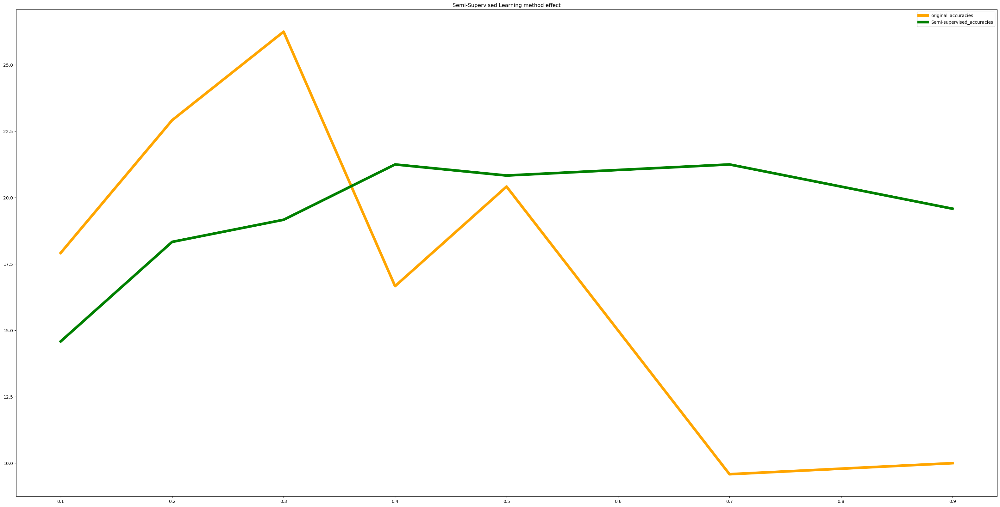

In [239]:
org_dic3 = res = dict(zip(parts_rev, org_comp_accs3))
plot_accs2(org_dic3, method_accs3,"Semi-Supervised Learning method effect")

## DTree with Generated Data

In [233]:
method_accs4 = []
org_comp_accs4 = []
method_accs_room4 = []
org_comp_accs_room4 = []
for par in parts:
    print(par)
    data_shape = (20,)
    latent_dim = 8
    input_layer = keras.Input(shape=data_shape)
    x = keras.layers.Dense(18, activation ='relu')(input_layer)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(10, activation ='relu')(x)
    means = keras.layers.Dense(latent_dim)(x)
    log_var = keras.layers.Dense(latent_dim)(x)

    z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

    encoder = keras.models.Model(input_layer, [means, log_var, z])

    decoder_input = keras.layers.Input(shape =(latent_dim,))
    x = keras.layers.Dense(10, activation ='relu')(decoder_input)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(18, activation ='relu')(x)
    outputs = keras.layers.Dense(20, activation ='sigmoid')(x)
    decoder = keras.models.Model(decoder_input, outputs)
    x_prime = decoder(z)
    outputs = decoder(encoder(input_layer)[2])
    vae = keras.models.Model(input_layer, outputs, name='vae')    
    vae.compile(loss=my_loss,optimizer="adam",metrics=["accuracy"])
    print(vae.summary())

    par_df, par_locations, par_df_test, par_test_loc = prep_data_for_synthesis(alpha_filtered2_train, par)

    his3 = vae.fit(min_max_scaler.fit_transform(par_df), min_max_scaler.fit_transform(par_df) , epochs = 100, batch_size = 8, validation_split= 0.2)

    outps = encoder.predict(min_max_scaler.fit_transform(par_df))

    new = generate_new_data((1500-len(par_df)), outps)
    generated_dataframe = pd.DataFrame(new, columns = no_channel_training_cols)

    nolabels = [-1 for _ in range(len(generated_dataframe))]
    nolabels = pd.DataFrame(nolabels, columns = ['location'])
    frames = [pd.DataFrame(min_max_scaler.fit_transform(par_df), columns= no_channel_training_cols), generated_dataframe]
    train_combined = pd.concat(frames)

    semi_combined_lbs = pd.concat([par_locations, nolabels])
    label_propagator = LabelPropagation()
    label_propagator.fit(train_combined, semi_combined_lbs)
    all_labels = label_propagator.transduction_

    grid_dt_parameters = {'criterion': ["entropy"], 'splitter': ["best", "random"],'max_depth': [3, 5, 8, 10, 15,20]}
    grid_dt = GridSearchCV(tree.DecisionTreeClassifier(),grid_dt_parameters,refit=True,verbose=2, cv = [(slice(None), slice(None))])
    print(grid_dt.fit(train_combined, all_labels))

    grid_dt_predictions = grid_dt.predict(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]))

    method_accs4.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], grid_dt_predictions)*100)

    room_lev_atarget = []
    for i in alpha_filtered2_test.loc[:, ['location']].to_numpy():
        room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    room_lev_test_semi = []
    for i in grid_dt_predictions:
        room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    method_accs_room4.append(accuracy_score(room_lev_atarget, room_lev_test_semi)*100)

    grid_dt_parameters = {'criterion': ["entropy"], 'splitter': ["best", "random"],'max_depth': [3, 5, 8, 10, 15,20]}
    grid_dt = GridSearchCV(tree.DecisionTreeClassifier(),grid_dt_parameters,refit=True,verbose=2 , cv = [(slice(None), slice(None))])
    print(grid_dt.fit(min_max_scaler.fit_transform(par_df), par_locations))

    grid_dt_predictions = grid_dt.predict(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]))

    org_comp_accs4.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], grid_dt_predictions)*100)
    

    room_lev_test_without_pred_rf = []
    for i in grid_dt_predictions:
        room_lev_test_without_pred_rf.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    org_comp_accs_room4.append(accuracy_score(room_lev_atarget, room_lev_test_without_pred_rf)*100)


0.9
Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_73 (InputLayer)        (None, 20)                0         
_________________________________________________________________
model_71 (Model)             [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_72 (Model)             (None, 20)                923       
Total params: 1,922
Trainable params: 1,922
Non-trainable params: 0
_________________________________________________________________
None
Train on 690 samples, validate on 173 samples
Epoch 1/100
690/690 [==============================] - 2s 3ms/step - loss: 12.9242 - accuracy: 0.3623 - val_loss: 11.5935 - val_accuracy: 0.0694
Epoch 2/100
690/690 [==============================] - 0s 598us/step - loss: 7.8174 - accuracy: 0.2942 - val_loss: 9.2034 - val_accuracy: 0.1676
Epoch 3/100
690/690 [=========================

Epoch 52/100
690/690 [==============================] - 0s 580us/step - loss: 3.2063 - accuracy: 0.6203 - val_loss: 4.6686 - val_accuracy: 0.6012
Epoch 53/100
690/690 [==============================] - 0s 505us/step - loss: 3.2018 - accuracy: 0.6333 - val_loss: 4.5082 - val_accuracy: 0.6012
Epoch 54/100
690/690 [==============================] - 0s 531us/step - loss: 3.1955 - accuracy: 0.6348 - val_loss: 4.6779 - val_accuracy: 0.2486
Epoch 55/100
690/690 [==============================] - 0s 564us/step - loss: 3.1890 - accuracy: 0.6319 - val_loss: 4.5809 - val_accuracy: 0.4046
Epoch 56/100
690/690 [==============================] - 0s 593us/step - loss: 3.1897 - accuracy: 0.6536 - val_loss: 4.5759 - val_accuracy: 0.5434
Epoch 57/100
690/690 [==============================] - 0s 479us/step - loss: 3.2075 - accuracy: 0.6507 - val_loss: 4.5567 - val_accuracy: 0.5954
Epoch 58/100
690/690 [==============================] - 0s 481us/step - loss: 3.2075 - accuracy: 0.6609 - val_loss: 4.5288 -

[CV] END ......criterion=entropy, max_depth=8, splitter=best; total time=   0.0s
[CV] END ....criterion=entropy, max_depth=8, splitter=random; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=10, splitter=best; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=10, splitter=random; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=15, splitter=best; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=15, splitter=random; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=20, splitter=best; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=20, splitter=random; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy'],
                         'max_depth': [3, 5, 8, 10, 15, 20],
                         'splitter': ['best', 'random']},
             verbose=2)
0.8
Model: "vae"
______________________

613/613 [==============================] - 0s 476us/step - loss: 3.2207 - accuracy: 0.6884 - val_loss: 4.7012 - val_accuracy: 0.7338
Epoch 46/100
613/613 [==============================] - 0s 476us/step - loss: 3.2256 - accuracy: 0.6656 - val_loss: 4.7052 - val_accuracy: 0.7597
Epoch 47/100
613/613 [==============================] - 0s 476us/step - loss: 3.2419 - accuracy: 0.6949 - val_loss: 4.7653 - val_accuracy: 0.9026
Epoch 48/100
613/613 [==============================] - 0s 474us/step - loss: 3.2248 - accuracy: 0.6852 - val_loss: 4.6801 - val_accuracy: 0.9026
Epoch 49/100
613/613 [==============================] - 0s 465us/step - loss: 3.2316 - accuracy: 0.6966 - val_loss: 4.7154 - val_accuracy: 0.9026
Epoch 50/100
613/613 [==============================] - 0s 466us/step - loss: 3.2388 - accuracy: 0.6966 - val_loss: 4.6798 - val_accuracy: 0.8896
Epoch 51/100
613/613 [==============================] - 0s 473us/step - loss: 3.2259 - accuracy: 0.7243 - val_loss: 4.7408 - val_accuracy

[CV] END ......criterion=entropy, max_depth=8, splitter=best; total time=   0.1s
[CV] END ....criterion=entropy, max_depth=8, splitter=random; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=10, splitter=best; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=10, splitter=random; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=15, splitter=best; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=15, splitter=random; total time=   0.0s
[CV] END .....criterion=entropy, max_depth=20, splitter=best; total time=   0.1s
[CV] END ...criterion=entropy, max_depth=20, splitter=random; total time=   0.0s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy'],
                         'max_depth': [3, 5, 8, 10, 15, 20],
                         'splitter': ['best', 'random']},
             verbose=2)
Fitting 1 folds for each of 12 candidat

Epoch 36/100
511/511 [==============================] - 0s 552us/step - loss: 3.2729 - accuracy: 0.4873 - val_loss: 4.6549 - val_accuracy: 0.6016
Epoch 37/100
511/511 [==============================] - 0s 600us/step - loss: 3.2920 - accuracy: 0.5108 - val_loss: 4.6352 - val_accuracy: 0.6016
Epoch 38/100
511/511 [==============================] - 0s 586us/step - loss: 3.2657 - accuracy: 0.4951 - val_loss: 4.6757 - val_accuracy: 0.6016
Epoch 39/100
511/511 [==============================] - 0s 565us/step - loss: 3.2755 - accuracy: 0.5068 - val_loss: 4.5357 - val_accuracy: 0.6016
Epoch 40/100
511/511 [==============================] - 0s 561us/step - loss: 3.2620 - accuracy: 0.5147 - val_loss: 4.6079 - val_accuracy: 0.6016
Epoch 41/100
511/511 [==============================] - 0s 566us/step - loss: 3.2610 - accuracy: 0.5029 - val_loss: 4.6448 - val_accuracy: 0.6172
Epoch 42/100
511/511 [==============================] - 0s 615us/step - loss: 3.2428 - accuracy: 0.5284 - val_loss: 4.5778 -

511/511 [==============================] - 0s 558us/step - loss: 3.2050 - accuracy: 0.5890 - val_loss: 4.7716 - val_accuracy: 0.4609
Epoch 93/100
511/511 [==============================] - 0s 512us/step - loss: 3.2212 - accuracy: 0.5695 - val_loss: 4.8145 - val_accuracy: 0.3516
Epoch 94/100
511/511 [==============================] - 0s 506us/step - loss: 3.2257 - accuracy: 0.5871 - val_loss: 4.7915 - val_accuracy: 0.5078
Epoch 95/100
511/511 [==============================] - 0s 497us/step - loss: 3.2099 - accuracy: 0.5714 - val_loss: 4.7354 - val_accuracy: 0.3828
Epoch 96/100
511/511 [==============================] - 0s 531us/step - loss: 3.2089 - accuracy: 0.6047 - val_loss: 4.6727 - val_accuracy: 0.3438
Epoch 97/100
511/511 [==============================] - 0s 583us/step - loss: 3.2102 - accuracy: 0.5812 - val_loss: 4.7562 - val_accuracy: 0.4609
Epoch 98/100
511/511 [==============================] - 0s 547us/step - loss: 3.2100 - accuracy: 0.5949 - val_loss: 4.6426 - val_accuracy

383/383 [==============================] - 0s 494us/step - loss: 3.7387 - accuracy: 0.7415 - val_loss: 5.8531 - val_accuracy: 0.9062
Epoch 25/100
383/383 [==============================] - 0s 492us/step - loss: 3.7152 - accuracy: 0.7572 - val_loss: 6.2842 - val_accuracy: 0.9271
Epoch 26/100
383/383 [==============================] - 0s 445us/step - loss: 3.7410 - accuracy: 0.7650 - val_loss: 5.0870 - val_accuracy: 0.9792
Epoch 27/100
383/383 [==============================] - 0s 458us/step - loss: 3.7150 - accuracy: 0.7598 - val_loss: 5.2386 - val_accuracy: 0.9167
Epoch 28/100
383/383 [==============================] - 0s 472us/step - loss: 3.7386 - accuracy: 0.7624 - val_loss: 6.0281 - val_accuracy: 0.8646
Epoch 29/100
383/383 [==============================] - 0s 461us/step - loss: 3.7164 - accuracy: 0.7676 - val_loss: 5.4795 - val_accuracy: 0.9062
Epoch 30/100
383/383 [==============================] - 0s 536us/step - loss: 3.6976 - accuracy: 0.7624 - val_loss: 5.4086 - val_accuracy

383/383 [==============================] - 0s 700us/step - loss: 3.6195 - accuracy: 0.7389 - val_loss: 4.7854 - val_accuracy: 0.6562
Epoch 81/100
383/383 [==============================] - 0s 708us/step - loss: 3.6218 - accuracy: 0.7546 - val_loss: 4.8746 - val_accuracy: 0.6562
Epoch 82/100
383/383 [==============================] - 0s 586us/step - loss: 3.6213 - accuracy: 0.7493 - val_loss: 4.7326 - val_accuracy: 0.6562
Epoch 83/100
383/383 [==============================] - 0s 571us/step - loss: 3.6083 - accuracy: 0.7389 - val_loss: 4.7600 - val_accuracy: 0.6562
Epoch 84/100
383/383 [==============================] - 0s 593us/step - loss: 3.6296 - accuracy: 0.7728 - val_loss: 4.8097 - val_accuracy: 0.6562
Epoch 85/100
383/383 [==============================] - 0s 559us/step - loss: 3.6213 - accuracy: 0.7415 - val_loss: 4.8095 - val_accuracy: 0.6562
Epoch 86/100
383/383 [==============================] - 0s 673us/step - loss: 3.6037 - accuracy: 0.7493 - val_loss: 4.8634 - val_accuracy

384/384 [==============================] - 0s 576us/step - loss: 3.4772 - accuracy: 0.2943 - val_loss: 5.0692 - val_accuracy: 0.1146
Epoch 13/100
384/384 [==============================] - 0s 584us/step - loss: 3.4522 - accuracy: 0.3307 - val_loss: 4.9745 - val_accuracy: 0.1562
Epoch 14/100
384/384 [==============================] - 0s 589us/step - loss: 3.4484 - accuracy: 0.3594 - val_loss: 4.9664 - val_accuracy: 0.1667
Epoch 15/100
384/384 [==============================] - 0s 582us/step - loss: 3.4486 - accuracy: 0.3776 - val_loss: 5.0752 - val_accuracy: 0.3125
Epoch 16/100
384/384 [==============================] - 0s 586us/step - loss: 3.4383 - accuracy: 0.4245 - val_loss: 4.7381 - val_accuracy: 0.1771
Epoch 17/100
384/384 [==============================] - 0s 612us/step - loss: 3.4093 - accuracy: 0.4661 - val_loss: 4.7928 - val_accuracy: 0.2292
Epoch 18/100
384/384 [==============================] - 0s 581us/step - loss: 3.3864 - accuracy: 0.4844 - val_loss: 4.9036 - val_accuracy

384/384 [==============================] - 0s 465us/step - loss: 3.2961 - accuracy: 0.6771 - val_loss: 4.7416 - val_accuracy: 0.1875
Epoch 69/100
384/384 [==============================] - 0s 479us/step - loss: 3.2657 - accuracy: 0.6979 - val_loss: 4.6532 - val_accuracy: 0.4167
Epoch 70/100
384/384 [==============================] - 0s 476us/step - loss: 3.2746 - accuracy: 0.7344 - val_loss: 4.6835 - val_accuracy: 0.1771
Epoch 71/100
384/384 [==============================] - 0s 478us/step - loss: 3.2602 - accuracy: 0.6927 - val_loss: 4.6677 - val_accuracy: 0.2188
Epoch 72/100
384/384 [==============================] - 0s 452us/step - loss: 3.2808 - accuracy: 0.6927 - val_loss: 4.7663 - val_accuracy: 0.3125
Epoch 73/100
384/384 [==============================] - 0s 483us/step - loss: 3.2856 - accuracy: 0.6901 - val_loss: 4.6755 - val_accuracy: 0.2500
Epoch 74/100
384/384 [==============================] - 0s 467us/step - loss: 3.2861 - accuracy: 0.6745 - val_loss: 4.7076 - val_accuracy

Train on 256 samples, validate on 64 samples
Epoch 1/100
256/256 [==============================] - 2s 8ms/step - loss: 14.1450 - accuracy: 0.0391 - val_loss: 13.9143 - val_accuracy: 0.0312
Epoch 2/100
256/256 [==============================] - 0s 493us/step - loss: 13.1318 - accuracy: 0.0586 - val_loss: 13.0438 - val_accuracy: 0.0312
Epoch 3/100
256/256 [==============================] - 0s 489us/step - loss: 10.8596 - accuracy: 0.0586 - val_loss: 11.1322 - val_accuracy: 0.0312
Epoch 4/100
256/256 [==============================] - 0s 494us/step - loss: 8.2751 - accuracy: 0.0586 - val_loss: 10.4802 - val_accuracy: 0.0312
Epoch 5/100
256/256 [==============================] - 0s 496us/step - loss: 7.2585 - accuracy: 0.4023 - val_loss: 10.0995 - val_accuracy: 0.6406
Epoch 6/100
256/256 [==============================] - 0s 527us/step - loss: 6.8749 - accuracy: 0.4336 - val_loss: 10.3086 - val_accuracy: 0.6406
Epoch 7/100
256/256 [==============================] - 0s 494us/step - loss: 6

Epoch 57/100
256/256 [==============================] - 0s 482us/step - loss: 3.6297 - accuracy: 0.6055 - val_loss: 4.9512 - val_accuracy: 0.9688
Epoch 58/100
256/256 [==============================] - 0s 497us/step - loss: 3.6159 - accuracy: 0.5977 - val_loss: 5.0628 - val_accuracy: 0.9688
Epoch 59/100
256/256 [==============================] - 0s 497us/step - loss: 3.6031 - accuracy: 0.5977 - val_loss: 4.9718 - val_accuracy: 0.9688
Epoch 60/100
256/256 [==============================] - 0s 498us/step - loss: 3.5908 - accuracy: 0.6250 - val_loss: 5.0392 - val_accuracy: 0.9688
Epoch 61/100
256/256 [==============================] - 0s 594us/step - loss: 3.6056 - accuracy: 0.5703 - val_loss: 4.9432 - val_accuracy: 0.9688
Epoch 62/100
256/256 [==============================] - 0s 491us/step - loss: 3.6453 - accuracy: 0.6680 - val_loss: 4.9031 - val_accuracy: 0.9688
Epoch 63/100
256/256 [==============================] - 0s 511us/step - loss: 3.6412 - accuracy: 0.6328 - val_loss: 5.0007 -

Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_85 (InputLayer)        (None, 20)                0         
_________________________________________________________________
model_83 (Model)             [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_84 (Model)             (None, 20)                923       
Total params: 1,922
Trainable params: 1,922
Non-trainable params: 0
_________________________________________________________________
None
Train on 76 samples, validate on 20 samples
Epoch 1/100
76/76 [==============================] - 2s 25ms/step - loss: 14.2103 - accuracy: 0.0000e+00 - val_loss: 14.1899 - val_accuracy: 0.0500
Epoch 2/100
76/76 [==============================] - 0s 686us/step - loss: 13.8694 - accuracy: 0.1053 - val_loss: 13.8582 - val_accuracy: 0.2000
Epoch 3/100
76/76 [==============================

76/76 [==============================] - 0s 626us/step - loss: 3.8737 - accuracy: 0.5921 - val_loss: 6.2187 - val_accuracy: 0.6500
Epoch 53/100
76/76 [==============================] - 0s 599us/step - loss: 3.8840 - accuracy: 0.5395 - val_loss: 6.0449 - val_accuracy: 0.6500
Epoch 54/100
76/76 [==============================] - 0s 542us/step - loss: 3.8257 - accuracy: 0.5263 - val_loss: 6.2600 - val_accuracy: 0.6500
Epoch 55/100
76/76 [==============================] - 0s 588us/step - loss: 3.8636 - accuracy: 0.5395 - val_loss: 6.1189 - val_accuracy: 0.6500
Epoch 56/100
76/76 [==============================] - 0s 597us/step - loss: 3.8732 - accuracy: 0.5000 - val_loss: 5.9788 - val_accuracy: 0.6500
Epoch 57/100
76/76 [==============================] - 0s 594us/step - loss: 3.8543 - accuracy: 0.5132 - val_loss: 5.8453 - val_accuracy: 0.6500
Epoch 58/100
76/76 [==============================] - 0s 539us/step - loss: 3.8266 - accuracy: 0.5132 - val_loss: 6.0945 - val_accuracy: 0.6500
Epoch

[32.5, 23.333333333333332, 30.833333333333336, 28.749999999999996, 31.25, 28.749999999999996, 20.416666666666668]
[50.416666666666664, 47.5, 39.166666666666664, 53.333333333333336, 45.0, 46.666666666666664, 37.083333333333336]


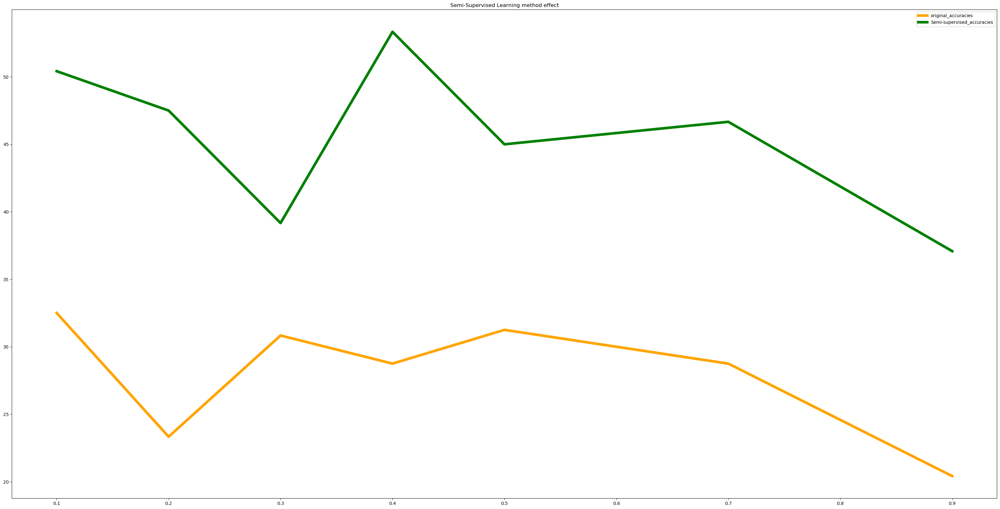

In [234]:
org_dic4 = res = dict(zip(parts_rev, org_comp_accs4))
plot_accs2(org_dic4, method_accs4,"Semi-Supervised Learning method effect")

[74.16666666666667, 69.58333333333333, 76.66666666666667, 70.83333333333334, 66.66666666666666, 67.5, 58.75]
[94.58333333333333, 95.0, 84.58333333333333, 94.58333333333333, 90.41666666666667, 88.33333333333333, 92.5]


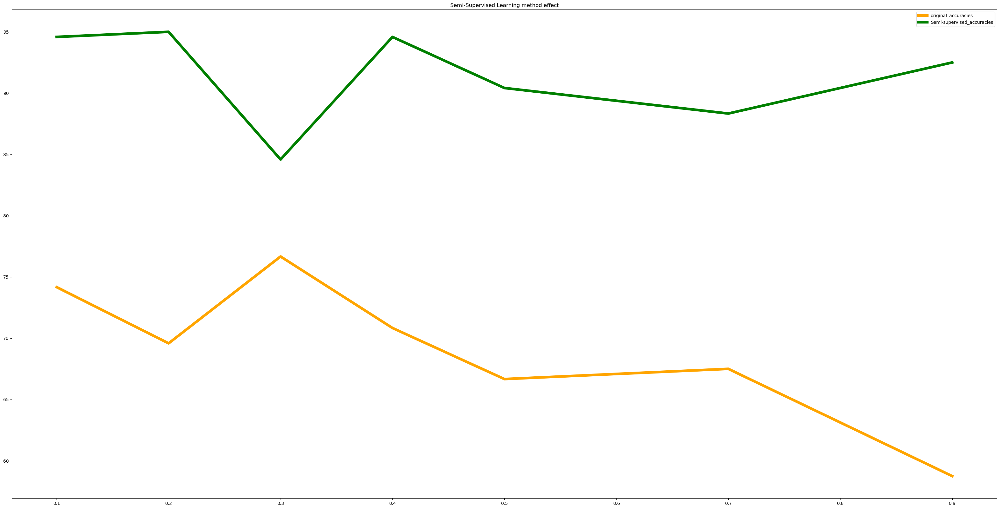

In [235]:
org_dic_room4 = res = dict(zip(parts_rev, org_comp_accs_room4))
plot_accs2(org_dic_room4, method_accs_room4,"Semi-Supervised Learning method effect")

## SVM

In [230]:
method_accs5 = []
org_comp_accs5 = []
method_accs_room5 = []
org_comp_accs_room5 = []
tx = alpha_filtered2_train.copy()
for par in parts:
    print(par)
    data_shape = (20,)
    latent_dim = 8
    input_layer = keras.Input(shape=data_shape)
    x = keras.layers.Dense(18, activation ='relu')(input_layer)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(10, activation ='relu')(x)
    means = keras.layers.Dense(latent_dim)(x)
    log_var = keras.layers.Dense(latent_dim)(x)

    z = Lambda(sample, output_shape = (latent_dim, ))([means, log_var])

    encoder = keras.models.Model(input_layer, [means, log_var, z])

    decoder_input = keras.layers.Input(shape =(latent_dim,))
    x = keras.layers.Dense(10, activation ='relu')(decoder_input)
    x = keras.layers.Dense(15, activation ='relu')(x)
    x = keras.layers.Dense(18, activation ='relu')(x)
    outputs = keras.layers.Dense(20, activation ='sigmoid')(x)
    decoder = keras.models.Model(decoder_input, outputs)
    x_prime = decoder(z)
    outputs = decoder(encoder(input_layer)[2])
    vae = keras.models.Model(input_layer, outputs, name='vae')    
    vae.compile(loss=my_loss,optimizer="adam",metrics=["accuracy"])
    print(vae.summary())

    x = len(alpha_filtered2_train)
    par_df, par_locations, par_df_test, par_test_loc = prep_data_for_synthesis2(tx, par, x)
    tx = par_df.copy()
    tx['location'] = par_locations

    his3 = vae.fit(min_max_scaler.fit_transform(par_df), min_max_scaler.fit_transform(par_df) , epochs = 100, batch_size = 8, validation_split= 0.2)

    outps = encoder.predict(min_max_scaler.fit_transform(par_df))

    new = generate_new_data((1500-len(par_df)), outps)
    generated_dataframe = pd.DataFrame(new, columns = no_channel_training_cols)

    nolabels = [-1 for _ in range(len(generated_dataframe))]
    nolabels = pd.DataFrame(nolabels, columns = ['location'])
    frames = [pd.DataFrame(min_max_scaler.fit_transform(par_df), columns= no_channel_training_cols), generated_dataframe]
    train_combined = pd.concat(frames)

    semi_combined_lbs = pd.concat([par_locations, nolabels])
    label_propagator = LabelPropagation()
    label_propagator.fit(train_combined, semi_combined_lbs)
    all_labels = label_propagator.transduction_


    
    grid_svm_parameters = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001],'kernel': ['poly','rbf', 'sigmoid','linear']}
    grid = GridSearchCV(SVC(),grid_svm_parameters,refit=True,verbose=2,cv = [(slice(None), slice(None))])
    print(grid.fit(train_combined, all_labels))
    

    svm_grid_predictions = grid.predict(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]))


    
    method_accs5.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], svm_grid_predictions)*100)

    room_lev_atarget = []
    for i in alpha_filtered2_test.loc[:, ['location']].to_numpy():
        room_lev_atarget.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    room_lev_test_semi = []
    for i in svm_grid_predictions:
        room_lev_test_semi.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    method_accs_room5.append(accuracy_score(room_lev_atarget, room_lev_test_semi)*100)

   
    grid = GridSearchCV(SVC(),grid_svm_parameters,refit=True,verbose=2, cv = [(slice(None), slice(None))])
    print(grid.fit(min_max_scaler.fit_transform(par_df), par_locations))

    svm_grid_predictions = grid.predict(min_max_scaler.fit_transform(alpha_filtered2_test.loc[:, no_channel_training_cols]))


    org_comp_accs5.append(accuracy_score(alpha_filtered2_test.loc[:, ['location']], svm_grid_predictions)*100)
    

    room_lev_test_without_pred_rf = []
    for i in svm_grid_predictions:
        room_lev_test_without_pred_rf.append({j for j in room_level_mappings if (i in room_level_mappings[j])}.pop())

    org_comp_accs_room5.append(accuracy_score(room_lev_atarget, room_lev_test_without_pred_rf)*100)


0.9
Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_59 (InputLayer)        (None, 20)                0         
_________________________________________________________________
model_57 (Model)             [(None, 8), (None, 8), (N 999       
_________________________________________________________________
model_58 (Model)             (None, 20)                923       
Total params: 1,922
Trainable params: 1,922
Non-trainable params: 0
_________________________________________________________________
None
Train on 690 samples, validate on 173 samples
Epoch 1/100
690/690 [==============================] - 3s 4ms/step - loss: 12.1525 - accuracy: 0.2899 - val_loss: 11.5083 - val_accuracy: 0.0000e+00
Epoch 2/100
690/690 [==============================] - 0s 563us/step - loss: 7.2349 - accuracy: 0.2420 - val_loss: 10.4765 - val_accuracy: 0.0000e+00
Epoch 3/100
690/690 [================

690/690 [==============================] - 0s 657us/step - loss: 3.2035 - accuracy: 0.7377 - val_loss: 4.5954 - val_accuracy: 0.6069
Epoch 52/100
690/690 [==============================] - 0s 670us/step - loss: 3.1890 - accuracy: 0.7159 - val_loss: 4.5955 - val_accuracy: 0.6936
Epoch 53/100
690/690 [==============================] - 1s 730us/step - loss: 3.2054 - accuracy: 0.7435 - val_loss: 4.5849 - val_accuracy: 0.8150
Epoch 54/100
690/690 [==============================] - 1s 770us/step - loss: 3.1837 - accuracy: 0.7420 - val_loss: 4.6406 - val_accuracy: 0.7399
Epoch 55/100
690/690 [==============================] - 1s 734us/step - loss: 3.1736 - accuracy: 0.7449 - val_loss: 4.5963 - val_accuracy: 0.7514
Epoch 56/100
690/690 [==============================] - 0s 723us/step - loss: 3.2043 - accuracy: 0.7290 - val_loss: 4.6254 - val_accuracy: 0.8960
Epoch 57/100
690/690 [==============================] - 0s 695us/step - loss: 3.1904 - accuracy: 0.7217 - val_loss: 4.6680 - val_accuracy

[CV] END ...................C=0.1, gamma=0.01, kernel=linear; total time=   0.5s
[CV] END ....................C=0.1, gamma=0.001, kernel=poly; total time=   0.5s
[CV] END .....................C=0.1, gamma=0.001, kernel=rbf; total time=   0.8s
[CV] END .................C=0.1, gamma=0.001, kernel=sigmoid; total time=   0.6s
[CV] END ..................C=0.1, gamma=0.001, kernel=linear; total time=   0.4s
[CV] END ..........................C=1, gamma=1, kernel=poly; total time=   0.3s
[CV] END ...........................C=1, gamma=1, kernel=rbf; total time=   0.6s
[CV] END .......................C=1, gamma=1, kernel=sigmoid; total time=   0.7s
[CV] END ........................C=1, gamma=1, kernel=linear; total time=   0.4s
[CV] END ........................C=1, gamma=0.1, kernel=poly; total time=   0.4s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   0.7s
[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.5s
[CV] END ...................

[CV] END ......................C=10, gamma=0.001, kernel=rbf; total time=   0.2s
[CV] END ..................C=10, gamma=0.001, kernel=sigmoid; total time=   0.2s
[CV] END ...................C=10, gamma=0.001, kernel=linear; total time=   0.1s
[CV] END ........................C=100, gamma=1, kernel=poly; total time=   0.1s
[CV] END .........................C=100, gamma=1, kernel=rbf; total time=   0.2s
[CV] END .....................C=100, gamma=1, kernel=sigmoid; total time=   0.2s
[CV] END ......................C=100, gamma=1, kernel=linear; total time=   0.1s
[CV] END ......................C=100, gamma=0.1, kernel=poly; total time=   0.1s
[CV] END .......................C=100, gamma=0.1, kernel=rbf; total time=   0.2s
[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END ....................C=100, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=100, gamma=0.01, kernel=poly; total time=   0.1s
[CV] END ...................

613/613 [==============================] - 0s 516us/step - loss: 3.2271 - accuracy: 0.5546 - val_loss: 4.6296 - val_accuracy: 0.7727
Epoch 40/100
613/613 [==============================] - 0s 522us/step - loss: 3.2327 - accuracy: 0.5710 - val_loss: 4.5972 - val_accuracy: 0.8377
Epoch 41/100
613/613 [==============================] - 0s 516us/step - loss: 3.2397 - accuracy: 0.5563 - val_loss: 4.9139 - val_accuracy: 0.6429
Epoch 42/100
613/613 [==============================] - 0s 519us/step - loss: 3.2266 - accuracy: 0.6036 - val_loss: 4.6269 - val_accuracy: 0.7597
Epoch 43/100
613/613 [==============================] - 0s 519us/step - loss: 3.2374 - accuracy: 0.5889 - val_loss: 4.6461 - val_accuracy: 0.8442
Epoch 44/100
613/613 [==============================] - 0s 540us/step - loss: 3.2222 - accuracy: 0.5873 - val_loss: 4.6478 - val_accuracy: 0.5519
Epoch 45/100
613/613 [==============================] - 0s 529us/step - loss: 3.2240 - accuracy: 0.6052 - val_loss: 4.6543 - val_accuracy

613/613 [==============================] - 1s 850us/step - loss: 3.1778 - accuracy: 0.7423 - val_loss: 4.5692 - val_accuracy: 0.7273
Epoch 96/100
613/613 [==============================] - 1s 841us/step - loss: 3.1660 - accuracy: 0.7243 - val_loss: 4.5421 - val_accuracy: 0.6948
Epoch 97/100
613/613 [==============================] - 0s 760us/step - loss: 3.1767 - accuracy: 0.7325 - val_loss: 4.5165 - val_accuracy: 0.6104
Epoch 98/100
613/613 [==============================] - 0s 759us/step - loss: 3.1855 - accuracy: 0.7162 - val_loss: 4.5006 - val_accuracy: 0.6299
Epoch 99/100
613/613 [==============================] - 0s 749us/step - loss: 3.1613 - accuracy: 0.7113 - val_loss: 4.6044 - val_accuracy: 0.6688
Epoch 100/100
613/613 [==============================] - 1s 819us/step - loss: 3.1638 - accuracy: 0.7406 - val_loss: 4.4375 - val_accuracy: 0.6688
Fitting 1 folds for each of 64 candidates, totalling 64 fits
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=  

[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=   0.2s
[CV] END ......................C=1, gamma=0.1, kernel=linear; total time=   0.2s
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.2s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=   0.3s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.2s
[CV] END .....................C=1, gamma=0.01, kernel=linear; total time=   0.2s
[CV] END ......................C=1, gamma=0.001, kernel=poly; total time=   0.2s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.3s
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time=   0.2s
[CV] END ....................C=1, gamma=0.001, kernel=linear; total time=   0.2s
[CV] END .........................C=10, gamma=1, kernel=poly; total time=   0.1s
[CV] END ..........................C=10, gamma=1, kernel=rbf; total time=   0.2s
[CV] END ...................

511/511 [==============================] - 1s 1ms/step - loss: 3.3883 - accuracy: 0.5734 - val_loss: 5.1909 - val_accuracy: 0.5000
Epoch 27/100
511/511 [==============================] - 0s 953us/step - loss: 3.3549 - accuracy: 0.5558 - val_loss: 4.8927 - val_accuracy: 0.9219
Epoch 28/100
511/511 [==============================] - 0s 951us/step - loss: 3.3360 - accuracy: 0.5479 - val_loss: 4.9562 - val_accuracy: 0.8828
Epoch 29/100
511/511 [==============================] - 0s 915us/step - loss: 3.3437 - accuracy: 0.5558 - val_loss: 4.9000 - val_accuracy: 0.9141
Epoch 30/100
511/511 [==============================] - 1s 980us/step - loss: 3.3257 - accuracy: 0.5675 - val_loss: 5.0993 - val_accuracy: 0.9141
Epoch 31/100
511/511 [==============================] - 0s 948us/step - loss: 3.3173 - accuracy: 0.5440 - val_loss: 4.8786 - val_accuracy: 0.8047
Epoch 32/100
511/511 [==============================] - 1s 1ms/step - loss: 3.3410 - accuracy: 0.5734 - val_loss: 4.8913 - val_accuracy: 0.

511/511 [==============================] - 0s 928us/step - loss: 3.2085 - accuracy: 0.6360 - val_loss: 4.5913 - val_accuracy: 0.5781
Epoch 83/100
511/511 [==============================] - 0s 881us/step - loss: 3.2007 - accuracy: 0.6106 - val_loss: 4.6630 - val_accuracy: 0.6094
Epoch 84/100
511/511 [==============================] - 1s 1ms/step - loss: 3.2095 - accuracy: 0.6184 - val_loss: 4.8773 - val_accuracy: 0.5312
Epoch 85/100
511/511 [==============================] - 1s 990us/step - loss: 3.1990 - accuracy: 0.6282 - val_loss: 4.7780 - val_accuracy: 0.4219
Epoch 86/100
511/511 [==============================] - 0s 919us/step - loss: 3.1814 - accuracy: 0.6380 - val_loss: 4.6391 - val_accuracy: 0.5938
Epoch 87/100
511/511 [==============================] - 1s 1ms/step - loss: 3.2170 - accuracy: 0.6027 - val_loss: 4.7331 - val_accuracy: 0.3281
Epoch 88/100
511/511 [==============================] - 0s 938us/step - loss: 3.2114 - accuracy: 0.6282 - val_loss: 4.7897 - val_accuracy: 0.

[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.2s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.1s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time=   0.1s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.1s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.1s
[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=0.1, gamma=0.01, kernel=poly; total time=   0.1s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=0.1, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ....................C=0.1, gamma=0.001, kernel=poly; total time=   0.1s
[CV] END ...................

Epoch 15/100
383/383 [==============================] - 0s 561us/step - loss: 3.8185 - accuracy: 0.6475 - val_loss: 5.5195 - val_accuracy: 0.6562
Epoch 16/100
383/383 [==============================] - 0s 537us/step - loss: 3.8344 - accuracy: 0.6449 - val_loss: 5.4529 - val_accuracy: 0.6562
Epoch 17/100
383/383 [==============================] - 0s 499us/step - loss: 3.7993 - accuracy: 0.6475 - val_loss: 5.4113 - val_accuracy: 0.6562
Epoch 18/100
383/383 [==============================] - 0s 518us/step - loss: 3.8179 - accuracy: 0.6475 - val_loss: 5.3458 - val_accuracy: 0.6562
Epoch 19/100
383/383 [==============================] - 0s 487us/step - loss: 3.7546 - accuracy: 0.6475 - val_loss: 5.2600 - val_accuracy: 0.6562
Epoch 20/100
383/383 [==============================] - 0s 549us/step - loss: 3.7845 - accuracy: 0.6475 - val_loss: 5.2613 - val_accuracy: 0.6562
Epoch 21/100
383/383 [==============================] - 0s 595us/step - loss: 3.7615 - accuracy: 0.6475 - val_loss: 5.2072 -

383/383 [==============================] - 0s 594us/step - loss: 3.6362 - accuracy: 0.6658 - val_loss: 4.9499 - val_accuracy: 0.6562
Epoch 72/100
383/383 [==============================] - 0s 583us/step - loss: 3.6382 - accuracy: 0.6867 - val_loss: 4.9753 - val_accuracy: 0.6562
Epoch 73/100
383/383 [==============================] - 0s 613us/step - loss: 3.6428 - accuracy: 0.6789 - val_loss: 4.9646 - val_accuracy: 0.6562
Epoch 74/100
383/383 [==============================] - 0s 708us/step - loss: 3.6091 - accuracy: 0.6815 - val_loss: 4.9140 - val_accuracy: 0.6562
Epoch 75/100
383/383 [==============================] - 0s 644us/step - loss: 3.6231 - accuracy: 0.6632 - val_loss: 4.9269 - val_accuracy: 0.6562
Epoch 76/100
383/383 [==============================] - 0s 587us/step - loss: 3.6529 - accuracy: 0.6841 - val_loss: 4.9896 - val_accuracy: 0.6562
Epoch 77/100
383/383 [==============================] - 0s 641us/step - loss: 3.6284 - accuracy: 0.6997 - val_loss: 4.8933 - val_accuracy

[CV] END ...................C=10, gamma=0.001, kernel=linear; total time=   0.4s
[CV] END ........................C=100, gamma=1, kernel=poly; total time=   0.2s
[CV] END .........................C=100, gamma=1, kernel=rbf; total time=   0.5s
[CV] END .....................C=100, gamma=1, kernel=sigmoid; total time=   0.6s
[CV] END ......................C=100, gamma=1, kernel=linear; total time=   0.3s
[CV] END ......................C=100, gamma=0.1, kernel=poly; total time=   0.4s
[CV] END .......................C=100, gamma=0.1, kernel=rbf; total time=   0.5s
[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   0.4s
[CV] END ....................C=100, gamma=0.1, kernel=linear; total time=   0.3s
[CV] END .....................C=100, gamma=0.01, kernel=poly; total time=   0.5s
[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.6s
[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   0.4s
[CV] END ...................

384/384 [==============================] - 0s 562us/step - loss: 9.9158 - accuracy: 0.1589 - val_loss: 11.6802 - val_accuracy: 0.5521
Epoch 3/100
384/384 [==============================] - 0s 508us/step - loss: 7.3744 - accuracy: 0.1589 - val_loss: 10.1637 - val_accuracy: 0.5521
Epoch 4/100
384/384 [==============================] - 0s 584us/step - loss: 6.5902 - accuracy: 0.2161 - val_loss: 10.1202 - val_accuracy: 0.1042
Epoch 5/100
384/384 [==============================] - 0s 497us/step - loss: 6.3020 - accuracy: 0.3932 - val_loss: 9.9055 - val_accuracy: 0.1146
Epoch 6/100
384/384 [==============================] - 0s 557us/step - loss: 5.6112 - accuracy: 0.4062 - val_loss: 8.0361 - val_accuracy: 0.2500
Epoch 7/100
384/384 [==============================] - 0s 529us/step - loss: 4.3955 - accuracy: 0.5208 - val_loss: 7.0480 - val_accuracy: 0.5208
Epoch 8/100
384/384 [==============================] - 0s 585us/step - loss: 3.9409 - accuracy: 0.5495 - val_loss: 6.6697 - val_accuracy: 0

384/384 [==============================] - 0s 632us/step - loss: 3.2769 - accuracy: 0.5156 - val_loss: 4.5682 - val_accuracy: 0.1979
Epoch 59/100
384/384 [==============================] - 0s 629us/step - loss: 3.2535 - accuracy: 0.5339 - val_loss: 4.6938 - val_accuracy: 0.2500
Epoch 60/100
384/384 [==============================] - 0s 630us/step - loss: 3.2543 - accuracy: 0.5625 - val_loss: 4.6648 - val_accuracy: 0.1771
Epoch 61/100
384/384 [==============================] - 0s 621us/step - loss: 3.2685 - accuracy: 0.5286 - val_loss: 4.7098 - val_accuracy: 0.1354
Epoch 62/100
384/384 [==============================] - 0s 571us/step - loss: 3.2661 - accuracy: 0.5677 - val_loss: 4.6730 - val_accuracy: 0.1562
Epoch 63/100
384/384 [==============================] - 0s 615us/step - loss: 3.2526 - accuracy: 0.5312 - val_loss: 4.7911 - val_accuracy: 0.1354
Epoch 64/100
384/384 [==============================] - 0s 618us/step - loss: 3.2481 - accuracy: 0.5547 - val_loss: 4.6978 - val_accuracy

[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.4s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=   0.6s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.5s
[CV] END .....................C=1, gamma=0.01, kernel=linear; total time=   0.3s
[CV] END ......................C=1, gamma=0.001, kernel=poly; total time=   0.4s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.8s
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time=   0.6s
[CV] END ....................C=1, gamma=0.001, kernel=linear; total time=   0.3s
[CV] END .........................C=10, gamma=1, kernel=poly; total time=   0.2s
[CV] END ..........................C=10, gamma=1, kernel=rbf; total time=   0.5s
[CV] END ......................C=10, gamma=1, kernel=sigmoid; total time=   0.6s
[CV] END .......................C=10, gamma=1, kernel=linear; total time=   0.3s
[CV] END ...................

[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=100, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ....................C=100, gamma=0.001, kernel=poly; total time=   0.1s
[CV] END .....................C=100, gamma=0.001, kernel=rbf; total time=   0.1s
[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END ..................C=100, gamma=0.001, kernel=linear; total time=   0.1s
GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['poly', 'rbf', 'sigmoid', 'linear']},
             verbose=2)
0.3
Model: "vae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input

Epoch 46/100
256/256 [==============================] - 0s 627us/step - loss: 3.6142 - accuracy: 0.6602 - val_loss: 4.8752 - val_accuracy: 0.9688
Epoch 47/100
256/256 [==============================] - 0s 536us/step - loss: 3.6170 - accuracy: 0.6797 - val_loss: 4.6818 - val_accuracy: 0.9688
Epoch 48/100
256/256 [==============================] - 0s 651us/step - loss: 3.6276 - accuracy: 0.6680 - val_loss: 4.8501 - val_accuracy: 0.9531
Epoch 49/100
256/256 [==============================] - 0s 631us/step - loss: 3.5829 - accuracy: 0.7070 - val_loss: 4.7025 - val_accuracy: 0.9531
Epoch 50/100
256/256 [==============================] - 0s 521us/step - loss: 3.5731 - accuracy: 0.6523 - val_loss: 4.6828 - val_accuracy: 0.9531
Epoch 51/100
256/256 [==============================] - 0s 568us/step - loss: 3.5785 - accuracy: 0.7070 - val_loss: 4.7550 - val_accuracy: 0.9531
Epoch 52/100
256/256 [==============================] - 0s 604us/step - loss: 3.6078 - accuracy: 0.6992 - val_loss: 4.7594 -

[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.8s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.6s
[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time=   0.5s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.8s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.6s
[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.5s
[CV] END .....................C=0.1, gamma=0.01, kernel=poly; total time=   0.5s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.8s
[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=   0.6s
[CV] END ...................C=0.1, gamma=0.01, kernel=linear; total time=   0.4s
[CV] END ....................C=0.1, gamma=0.001, kernel=poly; total time=   0.5s
[CV] END .....................C=0.1, gamma=0.001, kernel=rbf; total time=   0.8s
[CV] END .................C=

[CV] END .....................C=10, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ......................C=10, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=   0.1s
[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   0.1s
[CV] END ....................C=10, gamma=0.01, kernel=linear; total time=   0.0s
[CV] END .....................C=10, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ......................C=10, gamma=0.001, kernel=rbf; total time=   0.1s
[CV] END ..................C=10, gamma=0.001, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ........................C=100, gamma=1, kernel=poly; total time=   0.0s
[CV] END .........................C=100, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .....................C=100, gamma=1, kernel=sigmoid; total time=   0.1s
[CV] END ...................

76/76 [==============================] - 0s 650us/step - loss: 4.4270 - accuracy: 0.5000 - val_loss: 6.9292 - val_accuracy: 0.6500
Epoch 37/100
76/76 [==============================] - 0s 669us/step - loss: 4.2732 - accuracy: 0.4868 - val_loss: 7.0426 - val_accuracy: 0.6500
Epoch 38/100
76/76 [==============================] - 0s 965us/step - loss: 4.2403 - accuracy: 0.4211 - val_loss: 6.6476 - val_accuracy: 0.6500
Epoch 39/100
76/76 [==============================] - 0s 659us/step - loss: 4.2006 - accuracy: 0.4079 - val_loss: 6.4195 - val_accuracy: 0.6500
Epoch 40/100
76/76 [==============================] - 0s 650us/step - loss: 4.1241 - accuracy: 0.3816 - val_loss: 6.2257 - val_accuracy: 0.6500
Epoch 41/100
76/76 [==============================] - 0s 788us/step - loss: 4.1568 - accuracy: 0.4211 - val_loss: 5.9789 - val_accuracy: 0.6500
Epoch 42/100
76/76 [==============================] - 0s 764us/step - loss: 4.0655 - accuracy: 0.3947 - val_loss: 6.2063 - val_accuracy: 0.6500
Epoch

Epoch 93/100
76/76 [==============================] - 0s 705us/step - loss: 3.8529 - accuracy: 0.5000 - val_loss: 5.3522 - val_accuracy: 0.6500
Epoch 94/100
76/76 [==============================] - 0s 700us/step - loss: 3.7796 - accuracy: 0.5132 - val_loss: 5.0946 - val_accuracy: 0.6500
Epoch 95/100
76/76 [==============================] - 0s 750us/step - loss: 3.7574 - accuracy: 0.5526 - val_loss: 5.2188 - val_accuracy: 0.6500
Epoch 96/100
76/76 [==============================] - 0s 738us/step - loss: 3.8124 - accuracy: 0.5789 - val_loss: 5.1373 - val_accuracy: 0.6500
Epoch 97/100
76/76 [==============================] - 0s 715us/step - loss: 3.7336 - accuracy: 0.5395 - val_loss: 5.1547 - val_accuracy: 0.6500
Epoch 98/100
76/76 [==============================] - 0s 690us/step - loss: 3.8116 - accuracy: 0.5132 - val_loss: 5.0363 - val_accuracy: 0.6500
Epoch 99/100
76/76 [==============================] - 0s 713us/step - loss: 3.8365 - accuracy: 0.5000 - val_loss: 5.2959 - val_accuracy:

[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=1, gamma=0.01, kernel=linear; total time=   0.0s
[CV] END ......................C=1, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=1, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END .........................C=10, gamma=1, kernel=poly; total time=   0.0s
[CV] END ..........................C=10, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ......................C=10, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .......................C=10, gamma=1, kernel=linear; total time=   0.0s
[CV] END .......................C=10, gamma=0.1, kernel=poly; total time=   0.0s
[CV] END ........................C=10, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ...................

[42.5, 41.25, 43.333333333333336, 73.33333333333333, 53.75, 60.416666666666664, 44.166666666666664]
[46.25, 44.583333333333336, 45.83333333333333, 70.41666666666667, 56.25, 56.25, 41.66666666666667]


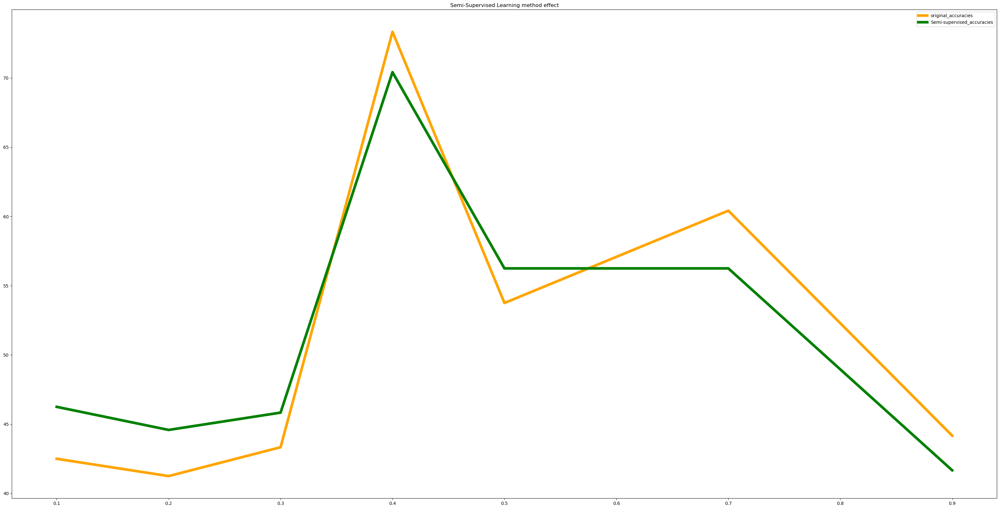

In [231]:
org_dic5 = res = dict(zip(parts_rev, org_comp_accs5))
plot_accs2(org_dic5, method_accs5,"Semi-Supervised Learning method effect")

[89.58333333333334, 89.16666666666667, 90.41666666666667, 97.91666666666666, 92.08333333333333, 95.41666666666667, 91.25]
[90.83333333333333, 90.0, 90.83333333333333, 98.75, 94.16666666666667, 96.25, 87.08333333333333]


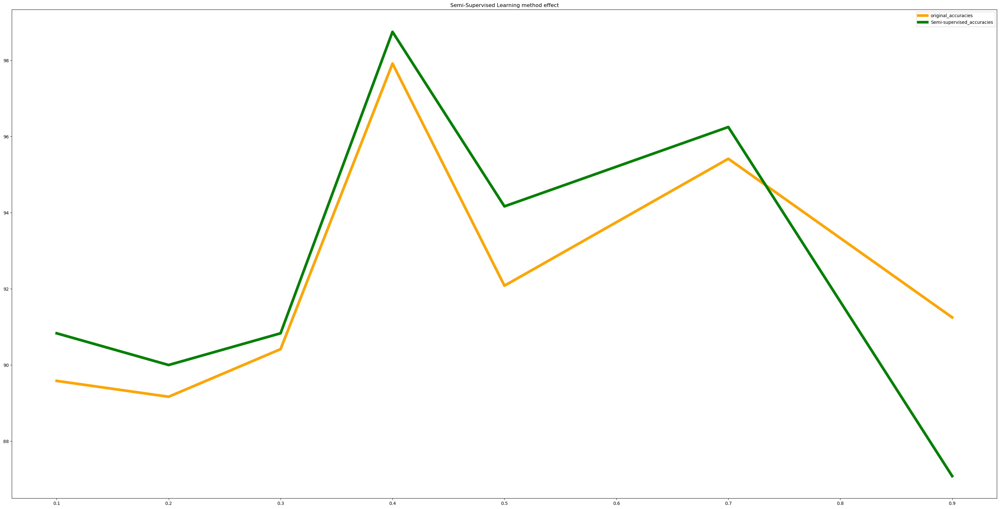

In [232]:
org_dic_room5 = res = dict(zip(parts_rev, org_comp_accs_room5))
plot_accs2(org_dic_room5, method_accs_room5,"Semi-Supervised Learning method effect")

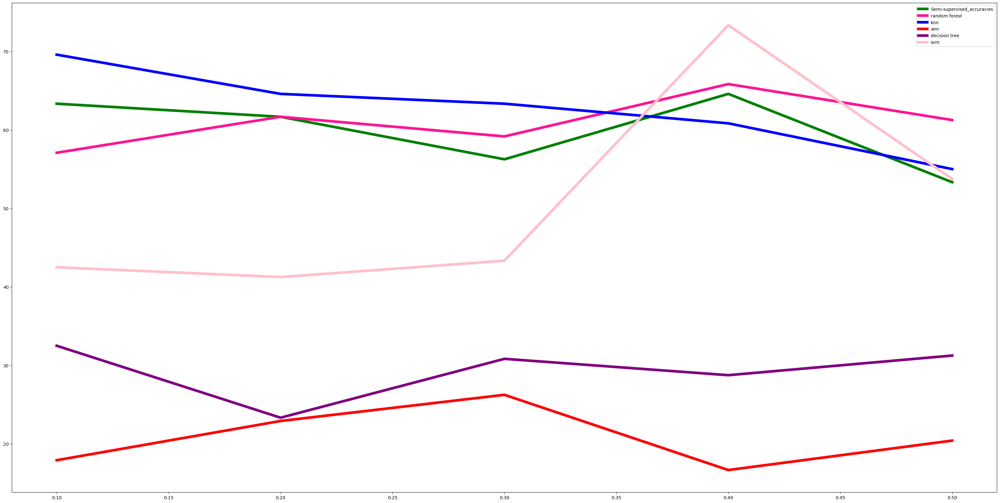

In [254]:
org_list = [org_dic,org_dic2,org_dic3,org_dic4,org_dic5]
names = ['random forest', 'knn', 'ann', 'decision tree', 'svm']
colorsx = ['deeppink', 'blue', 'red','purple','pink']

signals = [ {'name': 'Semi-supervised_accuracies', 'x': t[:5],
             'y': np.concatenate([method_accs[:5]]), 'color':'green', 'linewidth':6}]
i = 0
for original_accs in org_list:
    t = list(original_accs.keys())
    k = list(original_accs.values())
    signals.append({'name': names[i], 'x': t[:5],
             'y': k[:5], 'color':colorsx[i], 'linewidth':6})

    i+=1 
    
fig, ax = plt.subplots()
for signal in signals:
        ax.plot(signal['x'], signal['y'], 
                color=signal['color'], 
                linewidth=signal['linewidth'],
                label=signal['name'])
plt.rcParams['figure.figsize'] = [40, 20]
ax.legend()
# ax.set_title()
plt.show()